<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical, numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>Hyper paramter tuning (best `depth` in range [1, 5, 10, 50, 100, 500, 100], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li> 
        </ul>
    </li>
    <br>
    <li><strong>Graphviz</strong>
        <ul>
    <li>Visualize your decision tree with Graphviz. It helps you to understand how a decision is being made, given a new vector.</li>
    <li>Since feature names are not obtained from word2vec related models, visualize only BOW & TFIDF decision trees using Graphviz</li>
    <li>Make sure to print the words in each node of the decision tree instead of printing its index.</li>
    <li>Just for visualization purpose, limit max_depth to 2 or 3 and either embed the generated images of graphviz in your notebook, or directly upload them as .png files.</li>                
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='train_cv_auc.JPG' width=300px></li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud <a href='https://www.geeksforgeeks.org/generating-word-cloud-python/' with the words of eassy text of these `false positive data points`>WordCloud</a></li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>[Task-2]</strong>
        <ul>
    <li> Select 5k best features from features of <font color='red'>Set 2</font> using<a href='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html'>`feature_importances_`</a>, discard all the other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3</li>
        </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

In [ ]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
from sklearn import tree
from tqdm import tqdm
import os
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score
from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,classification_report,f1_score

#### Read the CSV file project and resorce.

In [ ]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [ ]:
project_data.shape

(109248, 17)

In [ ]:
resource_data.shape

(1541272, 4)

    • There are 109248 datapoints and 17 features in project file.
    • There are 1541272  datapoints and 4 features in resource file.

In [ ]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()

# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [ ]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category',
       'project_subject_categories', 'project_subject_subcategories',
       'project_title', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'price', 'quantity'],
      dtype='object')

In [ ]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]

# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [ ]:

#filtered_data["Time"] = filtered_data["Time"].map(lambda t: datetime.datetime.fromtimestamp(int(t)).strftime('%Y-%m-%d %H:%M:%S'))
project_data = project_data[project_data['teacher_prefix'].isnull() == False]
project_data_final = project_data.sort_values('id',axis=0,kind="quicksort", ascending=True)
#project_data_final = sortedData[sortedData.HelpfulnessNumerator <= final.HelpfulnessDenominator]

#As data is huge, due to computation limitation we will randomly select data. we will try to pick data in a way so that it doesn't make data imbalance problem
project_data_approve = project_data_final[project_data_final.project_is_approved == 1]
project_data_approve = project_data_approve.sample(n = 63000 ,replace=True) #0.055
project_data_reject = project_data_final[project_data_final.project_is_approved == 0]
project_data_reject = project_data_reject.sample(n = 37000,replace=True) #0.25
project_data_temp = pd.concat([project_data_approve,project_data_reject],axis=0)
#sording data by timestamp so that it can be devided in train and cross validate dataset for time based slicing.
project_data_temp = project_data_temp.sort_values('Date',axis=0,kind="quicksort", ascending=True).reset_index(drop=True)

### • Splitting Data

In [ ]:
X = project_data_temp
y = project_data_temp["project_is_approved"]
X.shape

(100000, 20)

In [ ]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)
print(X_train.shape)
print(X_cv.shape)
print(X_test.shape)

(44890, 20)
(22110, 20)
(33000, 20)


### school_state : categorical data (one hot encoding)

In [ ]:
# we use count vectorizer to convert the values into one hot encoded features
state_list = list(np.unique(X_train['school_state']))
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=state_list, lowercase=False, binary=True)
vectorizer.fit(X_train['school_state'].values)
#print(vectorizer.get_feature_names())
vectorizer_school_train = vectorizer
school_state_train = vectorizer.transform(X_train['school_state'].values)
print("Shape of matrix train data after one hot encodig ",school_state_train.shape)
vectorizer.fit(X_cv['school_state'].values)
#print(vectorizer.get_feature_names())
vectorizer = CountVectorizer(vocabulary=state_list, lowercase=False, binary=True)
school_state_cv = vectorizer.transform(X_cv['school_state'].values)
print("Shape of matrix CV data after one hot encodig ",school_state_cv.shape)
vectorizer_school_cv = vectorizer
#print(vectorizer.get_feature_names())
vectorizer = CountVectorizer(vocabulary=state_list, lowercase=False, binary=True)
vectorizer.fit(X_test['school_state'].values)
#print(vectorizer.get_feature_names())
vectorizer_school_test = vectorizer
school_state_test = vectorizer.transform(X_test['school_state'].values)
print("Shape of matrix Test data after one hot encodig ",school_state_test.shape)


Shape of matrix train data after one hot encodig  (44890, 51)
Shape of matrix CV data after one hot encodig  (22110, 51)
Shape of matrix Test data after one hot encodig  (33000, 51)


### Observation:
    Shape of matrix of school_state after one hot encodig  :
     • train data (44890,51)
     • CV data (22110,51)
     • test data (33000,51)

In [ ]:
p_feature =[]
p_feature = list(vectorizer_school_train.get_feature_names())
#p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.DataFrame(data=p_feature)
#p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_school_cv.get_feature_names())
#p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.DataFrame(data=p_feature)

p_feature =[]
p_feature = list(vectorizer_school_test.get_feature_names())
#p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.DataFrame(data=p_feature)

### clean_categories : categorical data (one hot encoding)

In [ ]:

def clean_categories (catogories,X):
    
#    catogories = list(project_data_temp['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
    cat_list = []
    for i in catogories:
        temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
        for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
            if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
                j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
            j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
            temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
            temp = temp.replace('&','_') # we are replacing the & value into 
        cat_list.append(temp.strip())
    X['clean_categories'] = cat_list   

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
    from collections import Counter
    my_counter = Counter()
    for word in X['clean_categories'].values:
        my_counter.update(word.split())

# dict sort by value python: https://stackoverflow.com/a/613218/4084039
    clean_cat_dict = dict(my_counter)
    sorted_clean_cat_dict = dict(sorted(clean_cat_dict.items(), key=lambda kv: kv[1]))
    return sorted_clean_cat_dict

# we use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
catogories = list(X_train['project_subject_categories'].values)
sorted_cat_dict_train = clean_categories(catogories,X_train)
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict_train.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_categories'].values)
    #print(vectorizer.get_feature_names())
categories_train = vectorizer.transform(X_train['clean_categories'].values)
print("Shape of matrix after one hot encodig ",categories_train.shape)
vectorizer_categories_train = vectorizer



catogories = list(X_cv['project_subject_categories'].values)
sorted_cat_dict_cv = clean_categories(catogories,X_cv)
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict_cv.keys()), lowercase=False, binary=True)
vectorizer.fit(X_cv['clean_categories'].values)
    #print(vectorizer.get_feature_names())
categories_cv = vectorizer.transform(X_cv['clean_categories'].values)
print("Shape of matrix after one hot encodig ",categories_cv.shape)
vectorizer_categories_cv = vectorizer

catogories = list(X_test['project_subject_categories'].values)
sorted_cat_dict_test = clean_categories(catogories,X_test)
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict_test.keys()), lowercase=False, binary=True)
vectorizer.fit(X_test['clean_categories'].values)
    #print(vectorizer.get_feature_names())
categories_test = vectorizer.transform(X_test['clean_categories'].values)
print("Shape of matrix after one hot encodig ",categories_test.shape)
vectorizer_categories_test = vectorizer


Shape of matrix after one hot encodig  (44890, 9)
Shape of matrix after one hot encodig  (22110, 9)
Shape of matrix after one hot encodig  (33000, 9)


### Observation:
    Shape of matrix of school_state after one hot encodig  :
     • train data (44890,9)
     • CV data (22110,9)
     • test data (33000,9)

In [ ]:
p_feature =[]
p_feature = list(vectorizer_categories_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_categories_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_categories_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

### clean_subcategories : categorical data (one hot encoding)

In [ ]:
#sub_catogories = list(project_data_temp['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

def clean_subcategories(sub_catogories,X):
    sub_cat_list = []
    for i in sub_catogories:
        temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
        for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
            if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
                j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
            j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
            temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
            temp = temp.replace('&','_')
        sub_cat_list.append(temp.strip())

    X['clean_subcategories'] = sub_cat_list



# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
    from collections import Counter
    my_counter = Counter()
    for word in X['clean_subcategories'].values:
        my_counter.update(word.split())

# dict sort by value python: https://stackoverflow.com/a/613218/4084039
    sub_cat_dict = dict(my_counter)
    sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))
# we use count vectorizer to convert the values into one hot encoded features
    return sorted_sub_cat_dict
 

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

#vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
sub_catogories = list(X_train['project_subject_subcategories'].values)
sub_categories_sort_tr =  clean_subcategories(sub_catogories,X_train)
vectorizer = CountVectorizer(vocabulary=list(sub_categories_sort_tr.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_subcategories'].values)
sub_categories_vect_test = vectorizer
#print(vectorizer.get_feature_names())
sub_categories_train = vectorizer.transform(X_train['clean_subcategories'].values)
print("Shape of matrix after one hot encodig ",sub_categories_train.shape)

sub_catogories = list(X_cv['project_subject_subcategories'].values)
sub_categories_sort_cv =  clean_subcategories(sub_catogories,X_cv)
vectorizer = CountVectorizer(vocabulary=list(sub_categories_sort_cv.keys()), lowercase=False, binary=True)
vectorizer.fit(X_cv['clean_subcategories'].values)
sub_categories_vect_cv = vectorizer
#print(vectorizer.get_feature_names())
sub_categories_cv = vectorizer.transform(X_cv['clean_subcategories'].values)
print("Shape of matrix after one hot encodig ",sub_categories_cv.shape)

sub_catogories = list(X_test['project_subject_subcategories'].values)
sub_categories_sort_test =  clean_subcategories(sub_catogories,X_test)
vectorizer = CountVectorizer(vocabulary=list(sub_categories_sort_test.keys()), lowercase=False, binary=True)
vectorizer.fit(X_test['clean_subcategories'].values)
sub_categories_vect_train = vectorizer
#print(vectorizer.get_feature_names())
sub_categories_test = vectorizer.transform(X_test['clean_subcategories'].values)
print("Shape of matrix after one hot encodig ",sub_categories_test.shape)

Shape of matrix after one hot encodig  (44890, 30)
Shape of matrix after one hot encodig  (22110, 30)
Shape of matrix after one hot encodig  (33000, 30)


### Observation:
    Shape of matrix of school_state after one hot encodig  :
     • train data (44890, 30)
     • CV data (22110, 30)
     • test data (33000, 30)

In [ ]:
p_feature =[]
p_feature = list(sub_categories_vect_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(sub_categories_vect_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(sub_categories_vect_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

###  teacher_prefix : categorical data (one hot encoding)

In [ ]:
#https://stackoverflow.com/questions/12282232/how-do-i-count-unique-values-inside-a-list"
def teacher_prefix(X1):
    X = X1
    state_teacher_prefix = list(X['teacher_prefix'])
    a = set()
    a = list(set(state_teacher_prefix))
    set(filter(lambda x: x == x , a))
    seen = set()
    result = []
    for j in a:
        if j not in seen:
        #if pd.notnull(j) == 'True':  
            seen.add(j)
            result.append(j)
    state_teacher_prefix = [x for x in result if str(x) != 'nan']
    return state_teacher_prefix
    print(state_teacher_prefix)
    #print(state_teacher_prefix)
    #teacher_prefix = X['teacher_prefix']
    #x_teacher_prefix = teacher_prefix[pd.notnull(teacher_prefix)]
# we use count vectorizer to convert the values into one hot encoded features     
    

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
teacher_prefix_ohe_train = teacher_prefix(X_train)
vectorizer = CountVectorizer(vocabulary=teacher_prefix_ohe_train, lowercase=False, binary=True)
vectorizer.fit(teacher_prefix_ohe_train)
teacher_prefix_train = vectorizer.fit_transform(X_train['teacher_prefix'].values)
teacher_prefix_vect_train = vectorizer
print("Shape of matrix after one hot encodig ",teacher_prefix_train.shape)

teacher_prefix_ohe_cv = teacher_prefix(X_cv)
vectorizer = CountVectorizer(vocabulary=teacher_prefix_ohe_cv, lowercase=False, binary=True)
vectorizer.fit_transform(teacher_prefix_ohe_cv)
teacher_prefix_cv = vectorizer.fit_transform(X_cv['teacher_prefix'].values)
teacher_prefix_vect_cv = vectorizer
print("Shape of matrix after one hot encodig ",teacher_prefix_cv.shape)

teacher_prefix_ohe_test = teacher_prefix(X_test)
vectorizer = CountVectorizer(vocabulary=teacher_prefix_ohe_cv, lowercase=False, binary=True)
vectorizer.fit_transform(teacher_prefix_ohe_test)
teacher_prefix_test = vectorizer.transform(X_test['teacher_prefix'].values)
teacher_prefix_vect_test = vectorizer
print("Shape of matrix after one hot encodig ",teacher_prefix_test.shape)

Shape of matrix after one hot encodig  (44890, 5)
Shape of matrix after one hot encodig  (22110, 5)
Shape of matrix after one hot encodig  (33000, 5)


### Observation:
    Shape of matrix of teacher_prefix after one hot encodig  :
     • train data (44890,5)
     • CV data (22110,5)
     • test data (33000,5)

In [ ]:
p_feature =[]
p_feature = list(teacher_prefix_vect_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(teacher_prefix_vect_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(teacher_prefix_vect_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

### project_grade_category : categorical data (one hot encoding)

In [ ]:
def grade(X):
    project_data_temp = X
    grade_list = list(np.unique(project_data_temp['project_grade_category']))
# we use count vectorizer to convert the values into one hot encoded features
    from sklearn.feature_extraction.text import CountVectorizer
    vectorizer = CountVectorizer(vocabulary=grade_list, lowercase=False, binary=True)
    vectorizer.fit(project_data_temp['project_grade_category'].values)
    #print(vectorizer.get_feature_names())
    grade_list_one_hot = vectorizer.transform(project_data_temp['project_grade_category'].values)
    print("Shape of matrix after one hot encodig ",grade_list_one_hot.shape)
    return grade_list_one_hot , vectorizer;

In [ ]:
grade_list_train , grade_list_train_v = grade(X_train)
grade_list_cv , grade_list_cv_v = grade(X_cv)
grade_list_test , grade_list_test_v = grade(X_test)

Shape of matrix after one hot encodig  (44890, 4)
Shape of matrix after one hot encodig  (22110, 4)
Shape of matrix after one hot encodig  (33000, 4)


### Observation:
     • train data (44890, 4)
     • CV data (22110, 4)
     • test data (33000, 4)

In [ ]:
p_feature =[]
p_feature = list(grade_list_train_v.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(grade_list_cv_v.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(grade_list_test_v.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

###  project_title : text data (BOW, TFIDF, AVG W2V, TFIDF W2V)

####   project_title : text data (BOW)

In [ ]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [ ]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [ ]:

#project title
# Combining all the above statemennts 
def process_title(X):
        project_data_temp = X
        from tqdm import tqdm
        preprocessed_project_title= []
# tqdm is for printing the status bar
        for sentance in tqdm(project_data_temp['project_title'].values):
            sent = decontracted(sentance)
            sent = sent.replace('\\r', ' ')
            sent = sent.replace('\\"', ' ')
            sent = sent.replace('\\n', ' ')
            sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
            sent = ' '.join(e for e in sent.split() if e not in stopwords)
            preprocessed_project_title.append(sent.lower().strip())

# We are considering only the words which appeared in at least 10 documents(rows or projects).
        #vectorizer = CountVectorizer(min_df=10)
        #text_bow = vectorizer.fit_transform(preprocessed_project_title)
        #print("BOW ",text_bow.shape)
        return preprocessed_project_title

In [ ]:
preprocessed_project_title_train = process_title(X_train)
vectorizer = CountVectorizer(min_df=10)
vectorizer_preprocessed_project_title_train = vectorizer
text_bow_train = vectorizer.fit_transform(preprocessed_project_title_train)
print("Train BOW ",text_bow_train .shape)
preprocessed_project_title_cv = process_title(X_cv)
text_bow_cv = vectorizer.transform(preprocessed_project_title_cv)
vectorizer_preprocessed_project_title_cv = vectorizer
print("CV BOW ",text_bow_cv .shape)
preprocessed_project_title_test = process_title(X_test)
text_bow_test = vectorizer.transform(preprocessed_project_title_test)
vectorizer_preprocessed_project_title_test = vectorizer
print("Test BOW ",text_bow_test .shape)

 38%|███▊      | 8366/22110 [00:00<00:00, 41691.23it/s]

Train BOW  (44890, 1993)


 24%|██▍       | 8050/33000 [00:00<00:00, 40689.23it/s]

CV BOW  (22110, 1993)


100%|██████████| 33000/33000 [00:00<00:00, 41533.51it/s]


Test BOW  (33000, 1993)


In [ ]:
train_project_title_feature =  vectorizer_preprocessed_project_title_train.get_feature_names()

#### Observation:
    Shape of matrix of  project_title : text data (BOW) :
     • train data (44890, 1993)
     • CV data (22110, 1993)
     • test data (33000,1993)

####  project_title : text data (TIDF)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf_train = vectorizer.fit_transform(preprocessed_project_title_train)
vectorizer_tfidf_project_title_train = vectorizer
print("TFIDF ",text_tfidf_train.shape)
text_tfidf_cv = vectorizer.transform(preprocessed_project_title_cv)
print("TFIDF ",text_tfidf_cv.shape)
vectorizer_tfidf_project_title_cv = vectorizer
text_tfidf_test = vectorizer.transform(preprocessed_project_title_test)
print("TFIDF ",text_tfidf_test.shape)
vectorizer_tfidf_project_title_test = vectorizer

TFIDF  (44890, 1993)
TFIDF  (22110, 1993)
TFIDF  (33000, 1993)


#### Observation:
    Shape of matrix of  project_title : text data (TFIDF) :
     • train data (44890, 1993)
     • CV data (22110, 1993)
     • test data (33000, 1993)

In [ ]:
train_project_title_feature_t = vectorizer_tfidf_project_title_train.get_feature_names()

In [ ]:
p_feature =[]
p_feature = list(vectorizer_tfidf_project_title_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_tfidf_project_title_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_tfidf_project_title_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

####  project_title : text data (w2v_tfidf)

In [ ]:
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model

In [ ]:
preprocessed_project_title = preprocessed_project_title_train
tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.fit_transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)
print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))
text_w2v_tfidf_train = tfidf_w2v_vectors



0it [00:00, ?it/s]

939it [00:00, 9380.91it/s]



Loading Glove Model


1779it [00:00, 9061.22it/s]

2749it [00:00, 9242.26it/s]

3368it [00:00, 6264.35it/s]

4220it [00:00, 6803.53it/s]

5136it [00:00, 7371.27it/s]

6071it [00:00, 7869.68it/s]

7083it [00:00, 8426.83it/s]

8073it [00:00, 8819.32it/s]

9101it [00:01, 9210.61it/s]

10086it [00:01, 9392.33it/s]

11034it [00:01, 9411.81it/s]

11982it [00:01, 9398.84it/s]

12927it [00:01, 9372.53it/s]

13961it [00:01, 9641.76it/s]

14932it [00:01, 9661.52it/s]

15901it [00:01, 9471.00it/s]

16851it [00:01, 9438.71it/s]

17797it [00:01, 9439.29it/s]

18758it [00:02, 9487.22it/s]

19708it [00:02, 9484.29it/s]

20664it [00:02, 9505.74it/s]

21616it [00:02, 9361.30it/s]

22553it [00:02, 7458.83it/s]

23361it [00:02, 7233.60it/s]

24424it [00:02, 8000.09it/s]

25388it [00:02, 8429.03it/s]

26375it [00:02, 8815.02it/s]

27502it [00:03, 9430.08it/s]

28544it [00:03, 9704.70it/s]

29543it [00:03, 8639.10it/s]

30449it [00:03, 8596.97it/s]

31338it [00:03, 8166.38it/s]

32246it [00:03, 8419.64it/s]

33241it [00:03, 882

225423it [00:23, 9491.90it/s]

226378it [00:23, 9385.45it/s]

227386it [00:23, 9581.85it/s]

228348it [00:23, 9208.47it/s]

229288it [00:24, 9253.10it/s]

230420it [00:24, 9787.27it/s]

231470it [00:24, 9990.53it/s]

232478it [00:24, 9971.36it/s]

233502it [00:24, 10048.54it/s]

234525it [00:24, 10100.77it/s]

235539it [00:24, 9758.33it/s] 

236646it [00:24, 10116.82it/s]

237700it [00:24, 10208.60it/s]

238726it [00:25, 9587.99it/s] 

239731it [00:25, 9720.01it/s]

240883it [00:25, 10195.88it/s]

241954it [00:25, 10343.27it/s]

242998it [00:25, 10349.29it/s]

244173it [00:25, 10732.90it/s]

245255it [00:25, 10733.08it/s]

246334it [00:25, 10610.95it/s]

247400it [00:25, 10532.89it/s]

248474it [00:25, 10592.42it/s]

249565it [00:26, 10678.18it/s]

250665it [00:26, 10772.57it/s]

251744it [00:26, 10705.99it/s]

252816it [00:26, 10350.25it/s]

253855it [00:26, 10083.17it/s]

254868it [00:26, 9348.88it/s] 

255817it [00:26, 9081.97it/s]

256789it [00:26, 8932.51it/s]

257691it [00:26, 77

454304it [00:46, 9182.06it/s]

455225it [00:46, 8911.74it/s]

456120it [00:46, 8907.27it/s]

457014it [00:46, 8648.92it/s]

457885it [00:46, 8665.47it/s]

458803it [00:46, 8813.41it/s]

459705it [00:46, 8873.29it/s]

460595it [00:47, 8779.08it/s]

461515it [00:47, 8898.57it/s]

462485it [00:47, 9123.76it/s]

463400it [00:47, 8957.56it/s]

464382it [00:47, 9198.89it/s]

465316it [00:47, 9239.43it/s]

466243it [00:47, 9226.91it/s]

467172it [00:47, 9241.52it/s]

468098it [00:47, 9006.01it/s]

469001it [00:48, 8013.12it/s]

469825it [00:48, 7784.30it/s]

470672it [00:48, 7975.16it/s]

471486it [00:48, 8023.12it/s]

472303it [00:48, 8064.88it/s]

473119it [00:48, 8092.82it/s]

473933it [00:48, 7512.09it/s]

474696it [00:48, 7097.04it/s]

475419it [00:48, 7070.93it/s]

476136it [00:49, 6721.38it/s]

476819it [00:49, 6675.05it/s]

477507it [00:49, 6735.14it/s]

478186it [00:49, 6629.27it/s]

478931it [00:49, 6855.74it/s]

479717it [00:49, 7127.46it/s]

480547it [00:49, 7442.64it/s]

481300it

581347it [01:09, 5696.18it/s]

581959it [01:09, 5784.55it/s]

582560it [01:09, 5849.44it/s]

583147it [01:10, 5727.07it/s]

583722it [01:10, 5682.30it/s]

584312it [01:10, 5744.01it/s]

584888it [01:10, 5573.30it/s]

585448it [01:10, 5551.57it/s]

586043it [01:10, 5656.88it/s]

586684it [01:10, 5862.96it/s]

587274it [01:10, 5870.97it/s]

587864it [01:10, 5870.86it/s]

588485it [01:10, 5967.88it/s]

589084it [01:11, 5202.17it/s]

589623it [01:11, 4249.77it/s]

590090it [01:12, 1386.79it/s]

590433it [01:12, 1368.80it/s]

590787it [01:12, 1675.14it/s]

591222it [01:12, 2053.94it/s]

591682it [01:12, 2462.50it/s]

592148it [01:12, 2857.81it/s]

592637it [01:12, 3264.47it/s]

593124it [01:13, 3622.27it/s]

593572it [01:13, 3842.12it/s]

594112it [01:13, 3938.51it/s]

594611it [01:13, 4203.01it/s]

595169it [01:13, 4538.64it/s]

595770it [01:13, 4896.51it/s]

596307it [01:13, 5028.34it/s]

596833it [01:13, 4550.39it/s]

597469it [01:13, 4973.76it/s]

598067it [01:14, 5237.00it/s]

598628it

750507it [01:33, 10322.57it/s]

751583it [01:34, 10449.01it/s]

752697it [01:34, 10646.50it/s]

753771it [01:34, 10644.19it/s]

754837it [01:34, 10627.28it/s]

755913it [01:34, 10664.09it/s]

756980it [01:34, 10587.59it/s]

758040it [01:34, 10569.86it/s]

759185it [01:34, 10817.03it/s]

760351it [01:34, 11055.87it/s]

761466it [01:34, 11080.08it/s]

762576it [01:35, 10987.02it/s]

763677it [01:35, 10565.09it/s]

764853it [01:35, 10889.43it/s]

765948it [01:35, 10646.89it/s]

767153it [01:35, 11030.51it/s]

768264it [01:35, 10851.25it/s]

769355it [01:35, 10814.22it/s]

770458it [01:35, 10876.94it/s]

771563it [01:35, 10927.44it/s]

772658it [01:36, 10763.60it/s]

773737it [01:36, 10603.76it/s]

774808it [01:36, 10634.05it/s]

775889it [01:36, 10684.08it/s]

776973it [01:36, 10728.59it/s]

778141it [01:36, 10996.62it/s]

779243it [01:36, 10489.75it/s]

780384it [01:36, 10749.11it/s]

781506it [01:36, 10882.89it/s]

782599it [01:36, 10889.29it/s]

783720it [01:37, 10980.76it/s]

784910it

954757it [01:56, 6046.48it/s]

955449it [01:56, 6263.68it/s]

956082it [01:57, 6222.76it/s]

956789it [01:57, 6453.18it/s]

957485it [01:57, 6596.21it/s]

958150it [01:57, 6568.43it/s]

958820it [01:57, 6606.21it/s]

959483it [01:57, 6559.11it/s]

960141it [01:57, 6409.93it/s]

960784it [01:57, 5985.08it/s]

961390it [01:57, 5748.63it/s]

962047it [01:57, 5972.39it/s]

962748it [01:58, 6249.29it/s]

963497it [01:58, 6574.44it/s]

964249it [01:58, 6831.32it/s]

965039it [01:58, 7118.73it/s]

965787it [01:58, 7221.88it/s]

966517it [01:58, 6774.00it/s]

967287it [01:58, 7025.54it/s]

968100it [01:58, 7322.23it/s]

968843it [01:58, 5912.80it/s]

969486it [01:59, 5938.81it/s]

970131it [01:59, 6081.77it/s]

970926it [01:59, 6526.90it/s]

971606it [01:59, 6430.29it/s]

972269it [01:59, 4711.15it/s]

972820it [01:59, 4918.85it/s]

973490it [01:59, 5344.68it/s]

974224it [01:59, 5819.04it/s]

974979it [02:00, 6247.49it/s]

975647it [02:00, 6132.97it/s]

976291it [02:00, 5848.31it/s]

976900it

1139934it [02:19, 8489.26it/s]

1140877it [02:19, 8749.64it/s]

1141771it [02:19, 8571.05it/s]

1142711it [02:20, 8801.97it/s]

1143614it [02:20, 8868.76it/s]

1144560it [02:20, 9035.56it/s]

1145486it [02:20, 9100.71it/s]

1146401it [02:20, 8955.89it/s]

1147301it [02:20, 8851.25it/s]

1148189it [02:20, 8759.93it/s]

1149068it [02:20, 8568.17it/s]

1149928it [02:20, 8551.09it/s]

1150785it [02:20, 8437.40it/s]

1151631it [02:21, 8341.00it/s]

1152467it [02:21, 8317.28it/s]

1153300it [02:21, 7487.73it/s]

1154096it [02:21, 7621.79it/s]

1154872it [02:21, 7661.55it/s]

1155747it [02:21, 7957.99it/s]

1156645it [02:21, 8237.51it/s]

1157539it [02:21, 8434.74it/s]

1158412it [02:21, 8521.00it/s]

1159287it [02:22, 8587.67it/s]

1160157it [02:22, 8619.96it/s]

1161023it [02:22, 8631.31it/s]

1161898it [02:22, 8665.70it/s]

1162777it [02:22, 8701.28it/s]

1163677it [02:22, 8787.22it/s]

1164557it [02:22, 8289.16it/s]

1165393it [02:22, 7346.03it/s]

1166152it [02:22, 7004.96it/s]

1166892i

1323800it [02:42, 9933.86it/s]

1324897it [02:42, 10218.65it/s]

1325923it [02:42, 10168.99it/s]

1326986it [02:42, 10302.68it/s]

1328019it [02:42, 10094.76it/s]

1329067it [02:42, 10205.84it/s]

1330090it [02:42, 10207.48it/s]

1331113it [02:42, 10186.83it/s]

1332133it [02:42, 10066.58it/s]

1333168it [02:42, 10148.53it/s]

1334184it [02:43, 9619.88it/s] 

1335153it [02:43, 9512.45it/s]

1336132it [02:43, 9592.38it/s]

1337111it [02:43, 9648.32it/s]

1338079it [02:43, 9537.57it/s]

1339092it [02:43, 9707.08it/s]

1340065it [02:43, 9661.00it/s]

1341033it [02:43, 9652.00it/s]

1342000it [02:43, 9520.89it/s]

1342954it [02:44, 9516.36it/s]

1343946it [02:44, 9633.84it/s]

1344940it [02:44, 9722.24it/s]

1345914it [02:44, 9661.33it/s]

1346952it [02:44, 9865.34it/s]

1347941it [02:44, 9861.88it/s]

1348983it [02:44, 10022.09it/s]

1350036it [02:44, 10156.35it/s]

1351054it [02:44, 10062.99it/s]

1352062it [02:44, 10050.74it/s]

1353068it [02:45, 6967.64it/s] 

1353972it [02:45, 7481.25

1517368it [03:05, 8361.45it/s]

1518215it [03:05, 8324.41it/s]

1519055it [03:05, 8248.22it/s]

1519897it [03:05, 8296.83it/s]

1520731it [03:05, 7784.08it/s]

1521519it [03:05, 7761.22it/s]

1522364it [03:06, 7952.11it/s]

1523165it [03:06, 7947.01it/s]

1523964it [03:06, 7953.33it/s]

1524790it [03:06, 8037.31it/s]

1525732it [03:06, 8406.56it/s]

1526622it [03:06, 8547.02it/s]

1527491it [03:06, 8589.07it/s]

1528354it [03:06, 6631.31it/s]

1529139it [03:06, 6953.06it/s]

1529888it [03:07, 7049.15it/s]

1530774it [03:07, 7508.75it/s]

1531628it [03:07, 7785.44it/s]

1532434it [03:07, 7806.48it/s]

1533234it [03:07, 7848.52it/s]

1534113it [03:07, 8107.44it/s]

1534953it [03:07, 8191.78it/s]

1535781it [03:07, 8047.11it/s]

1536593it [03:07, 5913.20it/s]

1537287it [03:08, 6185.90it/s]

1538133it [03:08, 6728.24it/s]

1538872it [03:08, 6913.96it/s]

1539712it [03:08, 7301.32it/s]

1540629it [03:08, 7770.82it/s]

1541440it [03:08, 7731.15it/s]

1542321it [03:08, 8023.59it/s]

1543143i

1705390it [03:28, 8730.18it/s]

1706264it [03:28, 8715.33it/s]

1707136it [03:28, 8694.23it/s]

1708097it [03:29, 8949.00it/s]

1708994it [03:29, 8856.09it/s]

1709882it [03:29, 8801.40it/s]

1710764it [03:29, 8343.01it/s]

1711605it [03:29, 8164.03it/s]

1712427it [03:29, 8103.99it/s]

1713265it [03:29, 8164.17it/s]

1714100it [03:29, 8218.83it/s]

1714973it [03:29, 8364.60it/s]

1715812it [03:29, 8311.32it/s]

1716684it [03:30, 8427.91it/s]

1717529it [03:30, 8320.37it/s]

1718363it [03:30, 5920.39it/s]

1719206it [03:30, 6500.28it/s]

1719942it [03:30, 6664.72it/s]

1720670it [03:30, 6830.19it/s]

1721413it [03:30, 6998.80it/s]

1722145it [03:30, 6322.28it/s]

1722871it [03:31, 6574.99it/s]

1723556it [03:31, 6228.43it/s]

1724202it [03:31, 6023.01it/s]

1724822it [03:31, 2782.65it/s]

1725490it [03:31, 3372.94it/s]

1726284it [03:32, 4075.92it/s]

1727026it [03:32, 4712.45it/s]

1727760it [03:32, 5278.82it/s]

1728435it [03:32, 5246.68it/s]

1729063it [03:32, 5372.20it/s]

1729815i

1862805it [03:52, 7437.84it/s]

1863620it [03:52, 7638.03it/s]

1864477it [03:52, 7895.18it/s]

1865284it [03:52, 7657.99it/s]

1866073it [03:52, 7724.31it/s]

1866856it [03:52, 7707.21it/s]

1867722it [03:52, 7969.95it/s]

1868577it [03:52, 8134.00it/s]

1869397it [03:53, 8101.80it/s]

1870251it [03:53, 8228.33it/s]

1871084it [03:53, 8248.46it/s]

1871912it [03:53, 8229.18it/s]

1872737it [03:53, 8162.14it/s]

1873555it [03:53, 7770.98it/s]

1874340it [03:53, 7794.06it/s]

1875123it [03:53, 7614.03it/s]

1876066it [03:53, 8080.67it/s]

1876907it [03:53, 8175.94it/s]

1877832it [03:54, 8470.14it/s]

1878687it [03:54, 8171.64it/s]

1879512it [03:54, 6347.68it/s]

1880254it [03:54, 6632.82it/s]

1881131it [03:54, 7155.76it/s]

1881962it [03:54, 7466.04it/s]

1882787it [03:54, 7675.81it/s]

1883662it [03:54, 7968.42it/s]

1884530it [03:54, 8154.62it/s]

1885362it [03:55, 8097.75it/s]

1886211it [03:55, 8209.16it/s]

1887041it [03:55, 8145.13it/s]

1887951it [03:55, 8409.33it/s]

1888799i

Done. 1917495  words loaded!
all the words in the coupus 193452
the unique words in the coupus 10044
The number of words that are present in both glove vectors and our coupus 9681 ( 96.386 %)
word 2 vec length 9681




  0%|          | 0/44890 [00:00<?, ?it/s]

  1%|▏         | 569/44890 [00:00<00:07, 5681.76it/s]

  2%|▏         | 1052/44890 [00:00<00:08, 5395.64it/s]

  4%|▍         | 1779/44890 [00:00<00:07, 5843.15it/s]

  6%|▋         | 2832/44890 [00:00<00:06, 6743.59it/s]

  9%|▉         | 3953/44890 [00:00<00:05, 7658.97it/s]

 11%|█         | 5026/44890 [00:00<00:04, 8377.30it/s]

 14%|█▍        | 6227/44890 [00:00<00:04, 9197.91it/s]

 16%|█▌        | 7213/44890 [00:00<00:04, 9385.91it/s]

 19%|█▉        | 8465/44890 [00:00<00:03, 10147.11it/s]

 21%|██        | 9515/44890 [00:01<00:03, 9816.05it/s] 

 23%|██▎       | 10524/44890 [00:01<00:03, 9839.77it/s]

 26%|██▌       | 11527/44890 [00:01<00:03, 9866.29it/s]

 28%|██▊       | 12527/44890 [00:01<00:03, 9848.72it/s]

 30%|███       | 13599/44890 [00:01<00:03, 10093.98it/s]

 33%|███▎      | 14617/44890 [00:01<00:03, 9966.06it/s] 

 35%|███▍      | 15674/44890 [00:01<00:02, 10125.42it/s]

 37%|███▋      | 16826/44890 [00:01<00:02, 10506.

44890
300


In [ ]:
preprocessed_project_title = preprocessed_project_title_cv
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)
print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))
text_w2v_tfidf_cv = tfidf_w2v_vectors



0it [00:00, ?it/s]

535it [00:00, 5346.51it/s]

Loading Glove Model




1190it [00:00, 5657.97it/s]

1863it [00:00, 5940.91it/s]

2518it [00:00, 6110.79it/s]

3222it [00:00, 6352.92it/s]

3944it [00:00, 6589.20it/s]

4724it [00:00, 6905.39it/s]

5543it [00:00, 7245.85it/s]

6386it [00:00, 7563.90it/s]

7201it [00:01, 7728.13it/s]

7968it [00:01, 7642.19it/s]

8779it [00:01, 7774.08it/s]

9733it [00:01, 8230.32it/s]

10651it [00:01, 8473.19it/s]

11504it [00:01, 7623.62it/s]

12287it [00:01, 7630.43it/s]

13065it [00:01, 7009.17it/s]

13955it [00:01, 7485.62it/s]

14940it [00:01, 8065.17it/s]

15812it [00:02, 8249.52it/s]

16762it [00:02, 8588.04it/s]

17682it [00:02, 8747.71it/s]

18593it [00:02, 8851.76it/s]

19639it [00:02, 9264.07it/s]

20609it [00:02, 9373.09it/s]

21611it [00:02, 9556.52it/s]

22574it [00:02, 9103.58it/s]

23538it [00:02, 9256.98it/s]

24582it [00:02, 9581.27it/s]

25596it [00:03, 9741.06it/s]

26655it [00:03, 9977.74it/s]

27753it [00:03, 10257.14it/s]

28796it [00:03, 10211.66it/s]

29822it [00:03, 10187.94it/s]

30844it [00:03, 1

177675it [00:23, 8109.02it/s]

178562it [00:23, 8320.95it/s]

179398it [00:23, 8312.34it/s]

180281it [00:24, 8459.65it/s]

181130it [00:24, 8424.79it/s]

182009it [00:24, 8531.00it/s]

182868it [00:24, 8523.52it/s]

183748it [00:24, 8603.62it/s]

184728it [00:24, 8929.23it/s]

185625it [00:24, 8688.16it/s]

186498it [00:24, 8572.77it/s]

187424it [00:24, 8767.58it/s]

188305it [00:25, 8582.42it/s]

189173it [00:25, 8610.75it/s]

190101it [00:25, 8799.41it/s]

191021it [00:25, 8914.45it/s]

191915it [00:25, 8899.40it/s]

192843it [00:25, 9008.50it/s]

193746it [00:25, 8889.46it/s]

194739it [00:25, 9177.40it/s]

195698it [00:25, 9295.88it/s]

196722it [00:25, 9555.90it/s]

197682it [00:26, 9087.47it/s]

198696it [00:26, 9379.01it/s]

199664it [00:26, 9464.58it/s]

200616it [00:26, 9303.76it/s]

201619it [00:26, 9499.46it/s]

202608it [00:26, 9612.78it/s]

203595it [00:26, 9686.99it/s]

204577it [00:26, 9725.91it/s]

205699it [00:26, 10130.04it/s]

206880it [00:26, 10580.92it/s]

208049

401137it [00:46, 10285.52it/s]

402190it [00:46, 10171.39it/s]

403284it [00:46, 10389.35it/s]

404534it [00:47, 10941.76it/s]

405646it [00:47, 10644.66it/s]

406725it [00:47, 10651.01it/s]

407800it [00:47, 10307.77it/s]

408840it [00:47, 9794.92it/s] 

409884it [00:47, 9979.60it/s]

410940it [00:47, 10146.36it/s]

411962it [00:47, 9457.24it/s] 

412923it [00:47, 9479.35it/s]

413936it [00:47, 9653.78it/s]

414930it [00:48, 9735.39it/s]

415910it [00:48, 9234.19it/s]

416917it [00:48, 9467.41it/s]

417946it [00:48, 9699.10it/s]

418923it [00:48, 9266.13it/s]

419882it [00:48, 9360.76it/s]

421041it [00:48, 9933.23it/s]

422157it [00:48, 10270.27it/s]

423197it [00:48, 9761.01it/s] 

424335it [00:49, 10194.98it/s]

425536it [00:49, 10679.06it/s]

426621it [00:49, 9873.42it/s] 

427632it [00:49, 9585.56it/s]

428609it [00:49, 6285.81it/s]

429618it [00:49, 7086.56it/s]

430604it [00:49, 7739.36it/s]

431498it [00:49, 7580.93it/s]

432476it [00:50, 8127.78it/s]

433371it [00:50, 8356.03

574952it [01:11, 7719.29it/s]

575760it [01:11, 7822.51it/s]

576562it [01:11, 7771.18it/s]

577353it [01:11, 7614.90it/s]

578168it [01:11, 7767.44it/s]

578953it [01:12, 7624.28it/s]

579722it [01:12, 7565.10it/s]

580483it [01:12, 7274.91it/s]

581229it [01:12, 7329.19it/s]

581966it [01:12, 7254.60it/s]

582695it [01:12, 7255.73it/s]

583438it [01:12, 6111.88it/s]

584082it [01:12, 5535.83it/s]

584875it [01:12, 6086.09it/s]

585627it [01:13, 6454.02it/s]

586423it [01:13, 6835.71it/s]

587137it [01:13, 6482.62it/s]

587827it [01:13, 6601.22it/s]

588633it [01:13, 6979.76it/s]

589373it [01:13, 7098.63it/s]

590173it [01:13, 7345.53it/s]

590960it [01:13, 7494.59it/s]

591719it [01:13, 7445.89it/s]

592470it [01:13, 7457.09it/s]

593253it [01:14, 7563.07it/s]

594013it [01:14, 5812.73it/s]

594792it [01:14, 6291.07it/s]

595542it [01:14, 6607.93it/s]

596377it [01:14, 7048.06it/s]

597182it [01:14, 7311.01it/s]

597970it [01:14, 7472.14it/s]

598750it [01:14, 7565.66it/s]

599586it

773096it [01:35, 10578.66it/s]

774297it [01:35, 10969.34it/s]

775485it [01:35, 11225.41it/s]

776626it [01:35, 11211.32it/s]

777809it [01:35, 11388.90it/s]

779035it [01:35, 11635.65it/s]

780261it [01:35, 11813.78it/s]

781496it [01:35, 11967.30it/s]

782738it [01:36, 12098.75it/s]

783994it [01:36, 12233.28it/s]

785264it [01:36, 12367.60it/s]

786504it [01:36, 11976.80it/s]

787707it [01:36, 11977.88it/s]

788908it [01:36, 11849.72it/s]

790193it [01:36, 12131.75it/s]

791454it [01:36, 12269.16it/s]

792684it [01:36, 12260.33it/s]

793912it [01:37, 10349.93it/s]

795141it [01:37, 10863.74it/s]

796346it [01:37, 11190.96it/s]

797581it [01:37, 11513.33it/s]

798758it [01:37, 10307.58it/s]

799831it [01:37, 10223.97it/s]

800883it [01:37, 10213.41it/s]

801925it [01:37, 10106.77it/s]

802951it [01:37, 9959.06it/s] 

803958it [01:38, 9769.95it/s]

804944it [01:38, 9672.45it/s]

805918it [01:38, 9690.21it/s]

806914it [01:38, 9768.22it/s]

807935it [01:38, 9895.88it/s]

808945it [01:

1010191it [01:58, 10205.42it/s]

1011213it [01:58, 10080.66it/s]

1012222it [01:58, 9790.89it/s] 

1013204it [01:58, 8216.36it/s]

1014111it [01:58, 8453.79it/s]

1014990it [01:58, 8547.70it/s]

1015970it [01:58, 8887.67it/s]

1017015it [01:58, 9303.13it/s]

1018082it [01:58, 9673.82it/s]

1019067it [01:59, 8592.49it/s]

1020135it [01:59, 9125.59it/s]

1021223it [01:59, 9589.41it/s]

1022214it [01:59, 9683.16it/s]

1023204it [01:59, 9305.17it/s]

1024153it [01:59, 8842.75it/s]

1025055it [01:59, 8562.59it/s]

1025926it [01:59, 8333.57it/s]

1026871it [01:59, 8638.10it/s]

1027870it [02:00, 9001.26it/s]

1028782it [02:00, 8364.53it/s]

1029681it [02:00, 8521.10it/s]

1030546it [02:00, 8470.66it/s]

1031402it [02:00, 8180.88it/s]

1032229it [02:00, 8108.61it/s]

1033173it [02:00, 8462.27it/s]

1034075it [02:00, 8618.95it/s]

1035058it [02:00, 8949.02it/s]

1036050it [02:00, 9217.91it/s]

1036980it [02:01, 8938.00it/s]

1037881it [02:01, 5206.39it/s]

1038834it [02:01, 6026.01it/s]

10396

1229430it [02:21, 10992.77it/s]

1230660it [02:21, 11353.15it/s]

1231802it [02:21, 11151.00it/s]

1232923it [02:21, 10805.17it/s]

1234095it [02:21, 11062.83it/s]

1235207it [02:22, 11051.38it/s]

1236366it [02:22, 11206.81it/s]

1237525it [02:22, 11317.99it/s]

1238696it [02:22, 11430.60it/s]

1239842it [02:22, 11413.75it/s]

1240985it [02:22, 11263.90it/s]

1242113it [02:22, 11114.92it/s]

1243226it [02:22, 10890.34it/s]

1244331it [02:22, 10933.33it/s]

1245509it [02:23, 11174.09it/s]

1246629it [02:23, 10868.31it/s]

1247760it [02:23, 10996.60it/s]

1248863it [02:23, 10880.90it/s]

1250069it [02:23, 11207.76it/s]

1251213it [02:23, 11273.97it/s]

1252437it [02:23, 11545.42it/s]

1253646it [02:23, 11703.47it/s]

1254914it [02:23, 11978.57it/s]

1256116it [02:23, 11943.10it/s]

1257347it [02:24, 12050.01it/s]

1258555it [02:24, 11728.51it/s]

1259776it [02:24, 11866.50it/s]

1260999it [02:24, 11971.22it/s]

1262199it [02:24, 11948.78it/s]

1263396it [02:24, 11809.45it/s]

1264579it 

1458037it [02:43, 9279.65it/s] 

1458981it [02:43, 9318.32it/s]

1459956it [02:43, 9442.38it/s]

1461036it [02:43, 9803.88it/s]

1462119it [02:43, 10056.88it/s]

1463148it [02:43, 10123.65it/s]

1464167it [02:43, 9824.35it/s] 

1465156it [02:44, 8164.33it/s]

1466100it [02:44, 8508.59it/s]

1467050it [02:44, 8782.47it/s]

1467959it [02:44, 8633.09it/s]

1468916it [02:44, 8881.19it/s]

1469926it [02:44, 9214.06it/s]

1470891it [02:44, 9338.59it/s]

1471863it [02:44, 9447.84it/s]

1472816it [02:44, 9085.66it/s]

1473847it [02:45, 9421.20it/s]

1474865it [02:45, 9634.36it/s]

1475958it [02:45, 9988.90it/s]

1476966it [02:45, 9969.58it/s]

1477970it [02:45, 9806.38it/s]

1478956it [02:45, 9588.09it/s]

1479988it [02:45, 9796.44it/s]

1481052it [02:45, 10033.56it/s]

1482060it [02:45, 9960.88it/s] 

1483060it [02:45, 9772.11it/s]

1484041it [02:46, 9677.08it/s]

1485082it [02:46, 9884.53it/s]

1486074it [02:46, 9816.04it/s]

1487145it [02:46, 10068.13it/s]

1488155it [02:46, 9863.40it/s] 



1684198it [03:05, 10976.73it/s]

1685314it [03:05, 11030.82it/s]

1686508it [03:05, 11287.51it/s]

1687653it [03:05, 11335.37it/s]

1688808it [03:05, 11397.77it/s]

1689950it [03:06, 11193.89it/s]

1691136it [03:06, 11384.71it/s]

1692284it [03:06, 11412.39it/s]

1693449it [03:06, 11477.28it/s]

1694598it [03:06, 11244.47it/s]

1695725it [03:06, 10692.08it/s]

1696802it [03:06, 10317.79it/s]

1697909it [03:06, 10529.09it/s]

1699006it [03:06, 10657.22it/s]

1700120it [03:07, 10797.51it/s]

1701225it [03:07, 10869.34it/s]

1702349it [03:07, 10976.63it/s]

1703463it [03:07, 11024.02it/s]

1704568it [03:07, 10984.56it/s]

1705736it [03:07, 11184.24it/s]

1706914it [03:07, 11355.82it/s]

1708052it [03:07, 11179.51it/s]

1709172it [03:07, 11008.33it/s]

1710327it [03:07, 11164.64it/s]

1711446it [03:08, 11127.88it/s]

1712569it [03:08, 11157.22it/s]

1713686it [03:08, 11060.06it/s]

1714884it [03:08, 11319.22it/s]

1716064it [03:08, 11457.56it/s]

1717223it [03:08, 11494.78it/s]

1718374it 

1886651it [03:27, 7914.30it/s]

1887511it [03:28, 8106.30it/s]

1888329it [03:28, 7783.45it/s]

1889238it [03:28, 8134.20it/s]

1890173it [03:28, 8463.78it/s]

1891074it [03:28, 8619.87it/s]

1891961it [03:28, 8693.25it/s]

1892880it [03:28, 8835.25it/s]

1893769it [03:28, 8811.68it/s]

1894693it [03:28, 8934.75it/s]

1895596it [03:28, 8962.88it/s]

1896539it [03:29, 9096.11it/s]

1897508it [03:29, 9266.38it/s]

1898470it [03:29, 9366.94it/s]

1899409it [03:29, 9121.65it/s]

1900370it [03:29, 9261.92it/s]

1901299it [03:29, 9105.28it/s]

1902212it [03:29, 8730.86it/s]

1903090it [03:29, 8728.96it/s]

1903971it [03:29, 8720.03it/s]

1904846it [03:30, 8629.05it/s]

1905733it [03:30, 8699.10it/s]

1906617it [03:30, 8740.07it/s]

1907493it [03:30, 8623.61it/s]

1908357it [03:30, 8487.09it/s]

1909207it [03:30, 8161.01it/s]

1910031it [03:30, 8183.70it/s]

1910904it [03:30, 8339.93it/s]

1911830it [03:30, 8587.48it/s]

1912725it [03:30, 8690.94it/s]

1913597it [03:31, 8354.71it/s]

1914438i

Done. 1917495  words loaded!
all the words in the coupus 95043
the unique words in the coupus 7618
The number of words that are present in both glove vectors and our coupus 7398 ( 97.112 %)
word 2 vec length 7398




  0%|          | 0/22110 [00:00<?, ?it/s]

  2%|▏         | 421/22110 [00:00<00:05, 4189.89it/s]

  4%|▍         | 933/22110 [00:00<00:04, 4428.49it/s]

  7%|▋         | 1486/22110 [00:00<00:04, 4708.63it/s]

 10%|▉         | 2116/22110 [00:00<00:03, 5094.48it/s]

 12%|█▏        | 2670/22110 [00:00<00:03, 5214.31it/s]

 15%|█▌        | 3343/22110 [00:00<00:03, 5589.45it/s]

 18%|█▊        | 3923/22110 [00:00<00:03, 5648.43it/s]

 21%|██        | 4537/22110 [00:00<00:03, 5780.47it/s]

 23%|██▎       | 5179/22110 [00:00<00:02, 5958.26it/s]

 26%|██▋       | 5850/22110 [00:01<00:02, 6164.34it/s]

 30%|██▉       | 6596/22110 [00:01<00:02, 6490.38it/s]

 34%|███▍      | 7473/22110 [00:01<00:02, 7029.04it/s]

 38%|███▊      | 8465/22110 [00:01<00:01, 7701.58it/s]

 42%|████▏     | 9270/22110 [00:01<00:01, 7794.81it/s]

 46%|████▌     | 10223/22110 [00:01<00:01, 8244.14it/s]

 51%|█████     | 11205/22110 [00:01<00:01, 8659.34it/s]

 55%|█████▌    | 12218/22110 [00:01<00:01, 9035.27it/s]

 6

22110
300


In [ ]:
preprocessed_project_title = preprocessed_project_title_test
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)
print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))
text_w2v_tfidf_test = tfidf_w2v_vectors



0it [00:00, ?it/s]

324it [00:00, 3224.04it/s]

Loading Glove Model




645it [00:00, 3212.08it/s]

942it [00:00, 3130.92it/s]

1288it [00:00, 3220.65it/s]

1928it [00:00, 3784.63it/s]

2611it [00:00, 4368.71it/s]

3286it [00:00, 4885.02it/s]

3857it [00:00, 5106.14it/s]

4484it [00:00, 5406.54it/s]

5087it [00:01, 5579.49it/s]

5726it [00:01, 5791.71it/s]

6407it [00:01, 6063.15it/s]

7223it [00:01, 6569.30it/s]

8014it [00:01, 6920.38it/s]

8727it [00:01, 6846.87it/s]

9427it [00:01, 5314.92it/s]

10047it [00:01, 5548.00it/s]

10761it [00:01, 5945.59it/s]

11462it [00:02, 6229.25it/s]

12243it [00:02, 6631.46it/s]

12942it [00:02, 6734.05it/s]

13850it [00:02, 7299.54it/s]

14699it [00:02, 7619.34it/s]

15513it [00:02, 7767.88it/s]

16364it [00:02, 7975.15it/s]

17268it [00:02, 8266.88it/s]

18107it [00:02, 8257.30it/s]

18942it [00:02, 8026.25it/s]

19752it [00:03, 7298.63it/s]

20500it [00:03, 6099.07it/s]

21219it [00:03, 6389.49it/s]

22097it [00:03, 6956.90it/s]

22833it [00:03, 7011.82it/s]

23788it [00:03, 7618.91it/s]

24718it [00:03, 8054.79it

126711it [00:24, 2708.05it/s]

126990it [00:24, 2731.94it/s]

127326it [00:24, 2894.14it/s]

127663it [00:24, 3022.12it/s]

128001it [00:24, 3119.78it/s]

128342it [00:24, 3200.89it/s]

128666it [00:24, 3191.64it/s]

128999it [00:25, 3227.68it/s]

129342it [00:25, 3285.63it/s]

129696it [00:25, 3357.74it/s]

130034it [00:25, 3237.57it/s]

130360it [00:25, 3213.15it/s]

130685it [00:25, 3221.88it/s]

131009it [00:25, 3160.42it/s]

131335it [00:25, 3188.92it/s]

131664it [00:25, 3217.88it/s]

132024it [00:25, 3322.67it/s]

132371it [00:26, 3365.42it/s]

132709it [00:26, 2928.63it/s]

133013it [00:26, 2924.51it/s]

133314it [00:26, 2924.10it/s]

133651it [00:26, 3044.77it/s]

134017it [00:26, 3206.09it/s]

134344it [00:26, 3199.01it/s]

134669it [00:26, 3209.05it/s]

134998it [00:26, 3224.96it/s]

135323it [00:27, 2541.24it/s]

135648it [00:27, 2715.69it/s]

136006it [00:27, 2925.90it/s]

136442it [00:27, 3245.16it/s]

136859it [00:27, 3475.01it/s]

137229it [00:27, 3538.20it/s]

137641it

258412it [00:47, 8778.11it/s]

259435it [00:47, 9168.23it/s]

260358it [00:47, 8968.12it/s]

261329it [00:48, 9177.17it/s]

262298it [00:48, 9315.95it/s]

263234it [00:48, 9249.59it/s]

264225it [00:48, 9437.25it/s]

265172it [00:48, 9441.18it/s]

266193it [00:48, 9635.89it/s]

267207it [00:48, 9780.00it/s]

268188it [00:48, 9324.53it/s]

269127it [00:48, 9141.77it/s]

270087it [00:48, 9273.91it/s]

271019it [00:49, 8489.32it/s]

271920it [00:49, 8637.48it/s]

272796it [00:49, 8510.85it/s]

273656it [00:49, 8279.80it/s]

274492it [00:49, 7940.52it/s]

275332it [00:49, 8072.93it/s]

276191it [00:49, 8219.72it/s]

277018it [00:49, 7928.80it/s]

277817it [00:49, 7540.93it/s]

278613it [00:50, 7661.89it/s]

279386it [00:50, 7608.62it/s]

280152it [00:50, 7587.51it/s]

280958it [00:50, 7722.89it/s]

281734it [00:50, 7716.13it/s]

282536it [00:50, 7779.30it/s]

283375it [00:50, 7861.24it/s]

284163it [00:50, 7642.29it/s]

284930it [00:50, 7634.96it/s]

285696it [00:50, 7580.42it/s]

286456it

429881it [01:11, 6314.63it/s]

430533it [01:11, 6374.12it/s]

431175it [01:11, 6212.23it/s]

431907it [01:11, 6494.79it/s]

432633it [01:11, 6705.60it/s]

433363it [01:11, 6872.41it/s]

434126it [01:11, 7083.35it/s]

434924it [01:12, 7330.13it/s]

435681it [01:12, 7381.86it/s]

436424it [01:12, 7173.38it/s]

437164it [01:12, 7239.08it/s]

437892it [01:12, 6883.58it/s]

438587it [01:12, 6401.35it/s]

439279it [01:12, 6546.79it/s]

439943it [01:12, 6415.60it/s]

440624it [01:12, 6528.74it/s]

441282it [01:13, 6446.42it/s]

441931it [01:13, 6360.14it/s]

442570it [01:13, 6331.56it/s]

443237it [01:13, 6419.33it/s]

443881it [01:13, 6249.73it/s]

444556it [01:13, 6390.60it/s]

445280it [01:13, 6616.66it/s]

445946it [01:13, 5759.43it/s]

446545it [01:13, 5742.28it/s]

447135it [01:13, 5570.55it/s]

447705it [01:14, 5453.60it/s]

448260it [01:14, 5300.20it/s]

448798it [01:14, 5050.90it/s]

449311it [01:14, 5005.63it/s]

449934it [01:14, 5313.80it/s]

450545it [01:14, 5480.68it/s]

451121it

598525it [01:35, 7327.44it/s]

599261it [01:35, 7332.75it/s]

600057it [01:35, 7509.52it/s]

600830it [01:35, 7571.88it/s]

601590it [01:35, 6453.14it/s]

602391it [01:35, 6851.79it/s]

603115it [01:35, 6963.49it/s]

603899it [01:36, 7203.36it/s]

604636it [01:36, 6779.60it/s]

605331it [01:36, 6494.06it/s]

606047it [01:36, 6678.78it/s]

606792it [01:36, 6891.66it/s]

607495it [01:36, 6931.54it/s]

608263it [01:36, 7130.73it/s]

609050it [01:36, 7289.22it/s]

609785it [01:36, 7083.32it/s]

610499it [01:37, 6869.77it/s]

611191it [01:37, 6734.78it/s]

611869it [01:37, 6577.48it/s]

612531it [01:37, 6583.50it/s]

613228it [01:37, 6693.59it/s]

613900it [01:37, 6667.25it/s]

614569it [01:37, 6506.62it/s]

615222it [01:37, 6488.83it/s]

615891it [01:37, 6546.43it/s]

616547it [01:37, 6379.60it/s]

617187it [01:38, 6319.26it/s]

617821it [01:38, 6197.48it/s]

618513it [01:38, 6397.72it/s]

619156it [01:38, 6240.09it/s]

619824it [01:38, 6364.48it/s]

620463it [01:38, 6158.10it/s]

621083it

743093it [01:59, 9147.67it/s]

744065it [01:59, 9310.24it/s]

745034it [01:59, 9419.58it/s]

745978it [01:59, 9285.41it/s]

747015it [01:59, 9585.13it/s]

747977it [01:59, 9383.43it/s]

748972it [01:59, 9544.56it/s]

750001it [01:59, 9755.71it/s]

750980it [01:59, 9507.48it/s]

752037it [02:00, 9801.21it/s]

753102it [02:00, 10039.87it/s]

754194it [02:00, 10286.03it/s]

755291it [02:00, 10479.00it/s]

756353it [02:00, 10519.78it/s]

757417it [02:00, 10554.05it/s]

758475it [02:00, 10070.18it/s]

759542it [02:00, 10240.47it/s]

760634it [02:00, 10433.52it/s]

761688it [02:00, 10464.46it/s]

762738it [02:01, 10316.97it/s]

763773it [02:01, 10189.51it/s]

764854it [02:01, 10366.74it/s]

765893it [02:01, 10294.55it/s]

766945it [02:01, 10360.52it/s]

767995it [02:01, 10400.40it/s]

769036it [02:01, 10301.09it/s]

770067it [02:01, 10099.58it/s]

771120it [02:01, 10222.91it/s]

772176it [02:02, 10321.18it/s]

773266it [02:02, 10488.03it/s]

774403it [02:02, 10736.45it/s]

775480it [02:02, 1

949693it [02:22, 6398.85it/s]

950346it [02:22, 5861.31it/s]

950950it [02:22, 5829.70it/s]

951546it [02:22, 5495.13it/s]

952109it [02:22, 4703.89it/s]

952783it [02:22, 5171.73it/s]

953557it [02:22, 5742.47it/s]

954291it [02:23, 6143.16it/s]

955047it [02:23, 6507.72it/s]

955773it [02:23, 6714.59it/s]

956543it [02:23, 6981.10it/s]

957283it [02:23, 7100.66it/s]

958008it [02:23, 7109.48it/s]

958730it [02:23, 7049.89it/s]

959443it [02:23, 6995.24it/s]

960148it [02:23, 6986.19it/s]

960883it [02:23, 7090.35it/s]

961620it [02:24, 7171.17it/s]

962371it [02:24, 7267.75it/s]

963112it [02:24, 7308.51it/s]

963845it [02:24, 7051.03it/s]

964554it [02:24, 6966.58it/s]

965298it [02:24, 7100.28it/s]

966089it [02:24, 7322.88it/s]

966825it [02:24, 7214.01it/s]

967581it [02:24, 7313.87it/s]

968315it [02:24, 7296.32it/s]

969047it [02:25, 6719.27it/s]

969763it [02:25, 6845.06it/s]

970456it [02:25, 6611.91it/s]

971125it [02:25, 6141.31it/s]

971754it [02:25, 6183.22it/s]

972423it

1119403it [02:44, 9612.83it/s]

1120367it [02:44, 9615.24it/s]

1121330it [02:44, 9410.85it/s]

1122331it [02:44, 9582.02it/s]

1123337it [02:45, 9719.99it/s]

1124350it [02:45, 9838.54it/s]

1125336it [02:45, 9810.41it/s]

1126319it [02:45, 9516.75it/s]

1127376it [02:45, 9808.97it/s]

1128362it [02:45, 9739.60it/s]

1129340it [02:45, 8156.24it/s]

1130392it [02:45, 8735.51it/s]

1131361it [02:45, 9000.66it/s]

1132294it [02:46, 8736.36it/s]

1133323it [02:46, 9150.00it/s]

1134344it [02:46, 9432.16it/s]

1135305it [02:46, 9351.46it/s]

1136289it [02:46, 9492.33it/s]

1137286it [02:46, 9629.67it/s]

1138256it [02:46, 8876.92it/s]

1139269it [02:46, 9217.91it/s]

1140285it [02:46, 9481.35it/s]

1141288it [02:46, 9638.79it/s]

1142262it [02:47, 9480.00it/s]

1143321it [02:47, 9787.17it/s]

1144308it [02:47, 6727.41it/s]

1145120it [02:47, 7080.42it/s]

1146069it [02:47, 7663.27it/s]

1146977it [02:47, 8038.63it/s]

1147896it [02:47, 8350.86it/s]

1148910it [02:47, 8816.91it/s]

1149836i

1337622it [03:07, 9884.67it/s] 

1338614it [03:07, 9579.09it/s]

1339712it [03:07, 9958.46it/s]

1340754it [03:07, 10091.64it/s]

1341779it [03:07, 10136.32it/s]

1342797it [03:07, 10069.07it/s]

1343807it [03:07, 9987.61it/s] 

1344808it [03:07, 9918.59it/s]

1345839it [03:07, 10030.55it/s]

1346844it [03:07, 9937.94it/s] 

1347839it [03:08, 9747.06it/s]

1348899it [03:08, 9962.16it/s]

1349898it [03:08, 9489.33it/s]

1350924it [03:08, 9702.67it/s]

1351900it [03:08, 9160.06it/s]

1352827it [03:08, 9092.99it/s]

1353744it [03:08, 9102.93it/s]

1354671it [03:08, 9151.54it/s]

1355590it [03:08, 9161.95it/s]

1356593it [03:09, 9406.06it/s]

1357537it [03:09, 9279.44it/s]

1358468it [03:09, 8790.19it/s]

1359414it [03:09, 8910.43it/s]

1360311it [03:09, 8285.16it/s]

1361227it [03:09, 8529.50it/s]

1362173it [03:09, 8787.70it/s]

1363124it [03:09, 8990.48it/s]

1364058it [03:09, 9092.53it/s]

1365124it [03:09, 9510.12it/s]

1366184it [03:10, 9795.50it/s]

1367173it [03:10, 9181.04it/s]

1

1516911it [03:29, 8187.72it/s]

1517731it [03:29, 8086.76it/s]

1518541it [03:29, 7945.88it/s]

1519337it [03:29, 7621.77it/s]

1520194it [03:29, 7882.51it/s]

1521108it [03:30, 8221.73it/s]

1522021it [03:30, 8474.65it/s]

1522877it [03:30, 8477.93it/s]

1523730it [03:30, 8344.81it/s]

1524569it [03:30, 8312.06it/s]

1525426it [03:30, 8387.11it/s]

1526267it [03:30, 8110.15it/s]

1527100it [03:30, 8172.91it/s]

1528006it [03:30, 8419.82it/s]

1528950it [03:30, 8701.32it/s]

1529894it [03:31, 8910.42it/s]

1530790it [03:31, 8880.78it/s]

1531682it [03:31, 8794.54it/s]

1532564it [03:31, 8679.84it/s]

1533435it [03:31, 8613.06it/s]

1534307it [03:31, 8642.97it/s]

1535198it [03:31, 8719.72it/s]

1536071it [03:31, 8648.09it/s]

1536937it [03:31, 8494.38it/s]

1537857it [03:31, 8692.56it/s]

1538824it [03:32, 8960.61it/s]

1539724it [03:32, 8686.79it/s]

1540643it [03:32, 8830.25it/s]

1541537it [03:32, 8861.68it/s]

1542426it [03:32, 8743.14it/s]

1543326it [03:32, 8818.63it/s]

1544263i

1727926it [03:51, 9933.71it/s]

1728923it [03:51, 9787.79it/s]

1729905it [03:51, 9395.84it/s]

1730861it [03:52, 9443.41it/s]

1731855it [03:52, 9585.14it/s]

1732817it [03:52, 9457.99it/s]

1733766it [03:52, 9385.30it/s]

1734723it [03:52, 9439.04it/s]

1735699it [03:52, 9530.61it/s]

1736654it [03:52, 9428.32it/s]

1737620it [03:52, 9495.89it/s]

1738571it [03:52, 9284.52it/s]

1739502it [03:52, 8745.41it/s]

1740399it [03:53, 8809.86it/s]

1741316it [03:53, 8898.70it/s]

1742210it [03:53, 8777.17it/s]

1743091it [03:53, 8530.42it/s]

1743948it [03:53, 8517.50it/s]

1744827it [03:53, 8595.41it/s]

1745690it [03:53, 8603.60it/s]

1746554it [03:53, 8613.02it/s]

1747417it [03:53, 8597.68it/s]

1748278it [03:53, 8273.90it/s]

1749139it [03:54, 8371.75it/s]

1750039it [03:54, 8550.26it/s]

1750936it [03:54, 8671.17it/s]

1751806it [03:54, 8603.36it/s]

1752687it [03:54, 8663.23it/s]

1753555it [03:54, 8521.76it/s]

1754409it [03:54, 8319.67it/s]

1755277it [03:54, 8404.30it/s]

1756120i

1895383it [04:14, 8379.03it/s]

1896262it [04:14, 8498.19it/s]

1897113it [04:14, 8355.24it/s]

1898020it [04:14, 8556.10it/s]

1898878it [04:14, 8383.26it/s]

1899732it [04:14, 8429.52it/s]

1900577it [04:14, 8337.15it/s]

1901480it [04:14, 8532.63it/s]

1902359it [04:14, 8607.62it/s]

1903256it [04:15, 8711.49it/s]

1904129it [04:15, 8610.66it/s]

1904992it [04:15, 8555.74it/s]

1905869it [04:15, 8617.52it/s]

1906754it [04:15, 8685.05it/s]

1907632it [04:15, 8711.76it/s]

1908508it [04:15, 8722.84it/s]

1909381it [04:15, 8627.50it/s]

1910245it [04:15, 8584.26it/s]

1911104it [04:15, 8463.55it/s]

1911952it [04:16, 8249.75it/s]

1912846it [04:16, 8443.94it/s]

1913693it [04:16, 8331.40it/s]

1914608it [04:16, 8556.73it/s]

1915467it [04:16, 6389.85it/s]

1916275it [04:16, 6817.18it/s]

1917103it [04:16, 7096.89it/s]

1917495it [04:16, 7465.01it/s]

Done. 1917495  words loaded!
all the words in the coupus 142861
the unique words in the coupus 8858
The number of words that are present in both glove vectors and our coupus 8585 ( 96.918 %)
word 2 vec length 8585




  0%|          | 0/33000 [00:00<?, ?it/s]

  1%|          | 320/33000 [00:00<00:10, 3179.74it/s]

  3%|▎         | 831/33000 [00:00<00:08, 3585.48it/s]

  4%|▍         | 1451/33000 [00:00<00:07, 4103.89it/s]

  6%|▋         | 2111/33000 [00:00<00:06, 4628.24it/s]

  8%|▊         | 2723/33000 [00:00<00:06, 4983.70it/s]

 10%|█         | 3324/33000 [00:00<00:05, 5252.66it/s]

 12%|█▏        | 3846/33000 [00:00<00:06, 4621.62it/s]

 13%|█▎        | 4320/33000 [00:00<00:06, 4452.29it/s]

 15%|█▍        | 4832/33000 [00:00<00:06, 4623.77it/s]

 16%|█▋        | 5374/33000 [00:01<00:05, 4833.07it/s]

 18%|█▊        | 5974/33000 [00:01<00:05, 5126.55it/s]

 20%|█▉        | 6498/33000 [00:01<00:05, 4936.29it/s]

 21%|██▏       | 7068/33000 [00:01<00:05, 5142.61it/s]

 24%|██▎       | 7813/33000 [00:01<00:04, 5668.33it/s]

 25%|██▌       | 8403/33000 [00:01<00:04, 5611.08it/s]

 27%|██▋       | 9035/33000 [00:01<00:04, 5804.60it/s]

 30%|██▉       | 9804/33000 [00:01<00:03, 6262.75it/s]

 32%|

33000
300


#### Observation:
    Shape of matrix of project_title : text data (W2V_TFIDF) :
     • train data (44890, 300)
     • CV data (22110, 300)
     • test data (33000, 300)

In [ ]:
preprocessed_project_title = preprocessed_project_title_train
tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.fit_transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_train =  avg_w2v_vectors



0it [00:00, ?it/s]

476it [00:00, 4758.29it/s]

Loading Glove Model




1134it [00:00, 5189.26it/s]

1789it [00:00, 5532.55it/s]

2360it [00:00, 5584.60it/s]

2961it [00:00, 5702.96it/s]

3617it [00:00, 5934.63it/s]

4275it [00:00, 6113.20it/s]

4949it [00:00, 6286.21it/s]

5562it [00:00, 6238.15it/s]

6205it [00:01, 6293.74it/s]

6825it [00:01, 6223.66it/s]

7482it [00:01, 6321.03it/s]

8110it [00:01, 6279.45it/s]

8827it [00:01, 6522.13it/s]

9480it [00:01, 6318.01it/s]

10126it [00:01, 6351.33it/s]

10763it [00:01, 6268.47it/s]

11391it [00:01, 6221.54it/s]

12046it [00:01, 6312.57it/s]

12679it [00:02, 6243.94it/s]

13305it [00:02, 6151.66it/s]

13922it [00:02, 5864.60it/s]

14512it [00:02, 5673.65it/s]

15118it [00:02, 5783.02it/s]

15737it [00:02, 5898.04it/s]

16330it [00:02, 5825.82it/s]

16954it [00:02, 5936.57it/s]

17612it [00:02, 6114.69it/s]

18297it [00:02, 6317.32it/s]

18983it [00:03, 6466.64it/s]

19765it [00:03, 6820.20it/s]

20486it [00:03, 6895.61it/s]

21182it [00:03, 6835.93it/s]

21870it [00:03, 6822.87it/s]

22556it [00:03, 6780.6

150929it [00:23, 4932.07it/s]

151425it [00:23, 4750.20it/s]

151951it [00:23, 4892.01it/s]

152444it [00:24, 4208.83it/s]

153024it [00:24, 4585.66it/s]

153506it [00:24, 4604.29it/s]

153983it [00:24, 4500.73it/s]

154470it [00:24, 4604.41it/s]

154961it [00:24, 4690.43it/s]

155496it [00:24, 4861.23it/s]

156076it [00:24, 5102.79it/s]

156594it [00:24, 5059.89it/s]

157106it [00:25, 4992.13it/s]

157610it [00:25, 4828.21it/s]

158097it [00:25, 4601.75it/s]

158563it [00:25, 4489.45it/s]

159061it [00:25, 4619.79it/s]

159527it [00:25, 4300.77it/s]

159965it [00:25, 3920.67it/s]

160369it [00:25, 3850.86it/s]

160788it [00:25, 3945.59it/s]

161189it [00:26, 3771.23it/s]

161619it [00:26, 3914.98it/s]

162071it [00:26, 4077.40it/s]

162608it [00:26, 4393.67it/s]

163059it [00:26, 4355.89it/s]

163503it [00:26, 4357.91it/s]

164016it [00:26, 4562.81it/s]

164497it [00:26, 4633.15it/s]

164966it [00:26, 4436.67it/s]

165546it [00:26, 4762.35it/s]

166033it [00:27, 4291.73it/s]

166524it

306416it [00:46, 5557.34it/s]

307008it [00:47, 5661.29it/s]

307646it [00:47, 5858.37it/s]

308329it [00:47, 6119.09it/s]

308957it [00:47, 6109.03it/s]

309587it [00:47, 6164.44it/s]

310212it [00:47, 6182.57it/s]

310836it [00:47, 6137.62it/s]

311516it [00:47, 6319.85it/s]

312153it [00:47, 6187.88it/s]

312776it [00:47, 6101.83it/s]

313411it [00:48, 6172.79it/s]

314088it [00:48, 6339.83it/s]

314847it [00:48, 6665.38it/s]

315520it [00:48, 6527.80it/s]

316182it [00:48, 6552.91it/s]

316902it [00:48, 6734.41it/s]

317580it [00:48, 6610.61it/s]

318271it [00:48, 6695.91it/s]

318944it [00:48, 6693.40it/s]

319616it [00:48, 6406.41it/s]

320306it [00:49, 6543.70it/s]

320964it [00:49, 6290.78it/s]

321598it [00:49, 5589.22it/s]

322224it [00:49, 5772.21it/s]

322816it [00:49, 5613.26it/s]

323389it [00:49, 5646.01it/s]

323962it [00:49, 5622.62it/s]

324536it [00:49, 5656.60it/s]

325218it [00:49, 5960.11it/s]

325963it [00:50, 6339.80it/s]

326656it [00:50, 6504.65it/s]

327328it

461483it [01:10, 5326.39it/s]

462020it [01:10, 5035.66it/s]

462566it [01:10, 5149.86it/s]

463086it [01:10, 4727.91it/s]

463607it [01:11, 4861.81it/s]

464102it [01:11, 4810.13it/s]

464622it [01:11, 4883.81it/s]

465229it [01:11, 5177.82it/s]

465966it [01:11, 5656.50it/s]

466551it [01:11, 5402.01it/s]

467493it [01:11, 6188.47it/s]

468164it [01:11, 6210.14it/s]

468920it [01:11, 6561.18it/s]

469760it [01:12, 7020.68it/s]

470634it [01:12, 7460.91it/s]

471579it [01:12, 7962.24it/s]

472405it [01:12, 7946.04it/s]

473389it [01:12, 8432.83it/s]

474255it [01:12, 7854.70it/s]

475065it [01:12, 7247.75it/s]

475862it [01:12, 7448.88it/s]

476867it [01:12, 8075.67it/s]

477704it [01:12, 8065.32it/s]

478531it [01:13, 7785.97it/s]

479326it [01:13, 7577.79it/s]

480171it [01:13, 7819.46it/s]

481034it [01:13, 8045.48it/s]

481848it [01:13, 7591.02it/s]

482619it [01:13, 7464.31it/s]

483446it [01:13, 7674.26it/s]

484221it [01:13, 7015.31it/s]

484939it [01:13, 7037.09it/s]

485655it

661342it [01:34, 7514.97it/s]

662286it [01:34, 8004.44it/s]

663308it [01:34, 8559.40it/s]

664205it [01:34, 8622.77it/s]

665096it [01:34, 7585.61it/s]

666059it [01:34, 8101.38it/s]

666974it [01:34, 8388.24it/s]

667939it [01:34, 8729.41it/s]

669016it [01:35, 9255.28it/s]

670002it [01:35, 9427.03it/s]

670972it [01:35, 9501.40it/s]

671936it [01:35, 9253.55it/s]

672873it [01:35, 8926.62it/s]

673874it [01:35, 9211.31it/s]

674990it [01:35, 9719.01it/s]

676011it [01:35, 9859.91it/s]

677008it [01:35, 9886.41it/s]

678004it [01:35, 9711.12it/s]

678987it [01:36, 9710.14it/s]

679963it [01:36, 9568.28it/s]

680924it [01:36, 8874.19it/s]

681949it [01:36, 9239.53it/s]

683028it [01:36, 9655.41it/s]

684130it [01:36, 10027.74it/s]

685152it [01:36, 10083.91it/s]

686197it [01:36, 10189.14it/s]

687255it [01:36, 10302.54it/s]

688291it [01:37, 9979.68it/s] 

689295it [01:37, 9565.00it/s]

690260it [01:37, 9178.47it/s]

691217it [01:37, 9292.42it/s]

692153it [01:37, 8516.95it/s]

693

881409it [01:57, 8451.80it/s]

882396it [01:57, 8830.07it/s]

883396it [01:57, 9149.46it/s]

884404it [01:57, 9410.01it/s]

885359it [01:57, 9233.52it/s]

886293it [01:58, 9101.42it/s]

887237it [01:58, 9200.33it/s]

888163it [01:58, 8960.82it/s]

889065it [01:58, 8760.34it/s]

889946it [01:58, 7968.94it/s]

890929it [01:58, 8448.40it/s]

892075it [01:58, 9170.25it/s]

893229it [01:58, 9770.31it/s]

894445it [01:58, 10380.87it/s]

895517it [01:59, 10296.28it/s]

896650it [01:59, 10549.92it/s]

897724it [01:59, 10604.25it/s]

898828it [01:59, 10731.20it/s]

899911it [01:59, 10190.13it/s]

901085it [01:59, 10609.83it/s]

902234it [01:59, 10857.75it/s]

903331it [01:59, 8981.69it/s] 

904349it [01:59, 9309.15it/s]

905471it [02:00, 9808.61it/s]

906690it [02:00, 10413.34it/s]

907811it [02:00, 10639.83it/s]

908956it [02:00, 10869.90it/s]

910064it [02:00, 10922.75it/s]

911269it [02:00, 11235.88it/s]

912495it [02:00, 11522.67it/s]

913726it [02:00, 11745.03it/s]

915009it [02:00, 12049.

1116315it [02:19, 10433.52it/s]

1117366it [02:20, 10331.06it/s]

1118405it [02:20, 10070.28it/s]

1119418it [02:20, 10018.18it/s]

1120467it [02:20, 10154.23it/s]

1121533it [02:20, 10297.59it/s]

1122575it [02:20, 10331.03it/s]

1123626it [02:20, 10381.73it/s]

1124666it [02:20, 10129.82it/s]

1125773it [02:20, 10393.35it/s]

1126816it [02:20, 10081.80it/s]

1127931it [02:21, 10377.87it/s]

1128975it [02:21, 10158.95it/s]

1130099it [02:21, 10459.11it/s]

1131151it [02:21, 10434.66it/s]

1132199it [02:21, 10223.89it/s]

1133318it [02:21, 10494.59it/s]

1134372it [02:21, 9975.93it/s] 

1135378it [02:21, 9795.26it/s]

1136519it [02:21, 10228.14it/s]

1137601it [02:22, 10398.26it/s]

1138649it [02:22, 10188.14it/s]

1139710it [02:22, 10310.05it/s]

1140746it [02:22, 9856.06it/s] 

1141740it [02:22, 9835.97it/s]

1142729it [02:22, 6594.68it/s]

1143791it [02:22, 7439.83it/s]

1144830it [02:22, 8101.27it/s]

1145754it [02:23, 8351.68it/s]

1146792it [02:23, 8871.11it/s]

1147863it [02:23,

1345924it [02:42, 10629.13it/s]

1347024it [02:42, 10735.47it/s]

1348101it [02:42, 10278.45it/s]

1349253it [02:42, 10619.99it/s]

1350416it [02:42, 10879.96it/s]

1351511it [02:42, 10461.77it/s]

1352600it [02:42, 10586.60it/s]

1353832it [02:42, 11052.67it/s]

1354947it [02:42, 10993.09it/s]

1356054it [02:42, 10928.68it/s]

1357152it [02:43, 10805.19it/s]

1358237it [02:43, 10796.12it/s]

1359320it [02:43, 10464.06it/s]

1360371it [02:43, 10282.27it/s]

1361403it [02:43, 9926.60it/s] 

1362401it [02:43, 9755.09it/s]

1363381it [02:43, 9132.94it/s]

1364483it [02:43, 9627.13it/s]

1365514it [02:43, 9820.87it/s]

1366553it [02:44, 9984.89it/s]

1367561it [02:44, 9699.10it/s]

1368690it [02:44, 10127.13it/s]

1369849it [02:44, 10524.17it/s]

1370913it [02:44, 10363.03it/s]

1371958it [02:44, 10352.39it/s]

1373000it [02:44, 10294.40it/s]

1374159it [02:44, 10650.96it/s]

1375250it [02:44, 10725.48it/s]

1376327it [02:44, 10425.23it/s]

1377375it [02:45, 10207.49it/s]

1378401it [02:45

1552465it [03:05, 3939.34it/s]

1552972it [03:05, 4128.25it/s]

1553523it [03:05, 4463.63it/s]

1554135it [03:05, 4849.77it/s]

1554969it [03:05, 5545.92it/s]

1555801it [03:05, 6161.78it/s]

1556674it [03:05, 6757.76it/s]

1557500it [03:06, 7147.64it/s]

1558269it [03:06, 6964.29it/s]

1559053it [03:06, 7204.44it/s]

1559958it [03:06, 7673.85it/s]

1560781it [03:06, 7832.48it/s]

1561586it [03:06, 7838.18it/s]

1562436it [03:06, 8025.40it/s]

1563256it [03:06, 8076.79it/s]

1564072it [03:06, 8033.58it/s]

1564896it [03:06, 8092.47it/s]

1565829it [03:07, 8425.80it/s]

1566678it [03:07, 8406.13it/s]

1567524it [03:07, 8389.18it/s]

1568367it [03:07, 8161.35it/s]

1569195it [03:07, 8185.64it/s]

1570017it [03:07, 7996.74it/s]

1570820it [03:07, 7907.27it/s]

1571613it [03:07, 7676.59it/s]

1572384it [03:07, 7662.11it/s]

1573167it [03:07, 7690.72it/s]

1573978it [03:08, 7811.18it/s]

1574761it [03:08, 7075.81it/s]

1575483it [03:08, 7102.18it/s]

1576204it [03:08, 7067.63it/s]

1576977i

1749470it [03:27, 10411.73it/s]

1750516it [03:27, 10291.55it/s]

1751549it [03:27, 9934.18it/s] 

1752659it [03:27, 10256.86it/s]

1753691it [03:28, 9822.58it/s] 

1754738it [03:28, 10008.12it/s]

1755810it [03:28, 10143.46it/s]

1756974it [03:28, 10548.24it/s]

1758037it [03:28, 10334.12it/s]

1759150it [03:28, 10557.79it/s]

1760312it [03:28, 10854.72it/s]

1761404it [03:28, 10688.33it/s]

1762525it [03:28, 10839.21it/s]

1763613it [03:28, 10741.38it/s]

1764732it [03:29, 10870.22it/s]

1765822it [03:29, 10737.63it/s]

1766956it [03:29, 10891.13it/s]

1768048it [03:29, 10733.43it/s]

1769134it [03:29, 10767.08it/s]

1770297it [03:29, 11011.45it/s]

1771401it [03:29, 10690.49it/s]

1772474it [03:29, 10665.63it/s]

1773544it [03:29, 10228.05it/s]

1774573it [03:29, 9131.37it/s] 

1775592it [03:30, 9423.04it/s]

1776611it [03:30, 9640.21it/s]

1777616it [03:30, 9737.39it/s]

1778601it [03:30, 9373.54it/s]

1779627it [03:30, 9622.20it/s]

1780668it [03:30, 9843.80it/s]

1781679it [03:30

Done. 1917495  words loaded!
all the words in the coupus 193452
the unique words in the coupus 10044
The number of words that are present in both glove vectors and our coupus 9681 ( 96.386 %)
word 2 vec length 9681




  0%|          | 0/44890 [00:00<?, ?it/s]

  1%|▏         | 620/44890 [00:00<00:07, 6199.44it/s]

  3%|▎         | 1540/44890 [00:00<00:06, 6862.29it/s]

  7%|▋         | 2946/44890 [00:00<00:05, 8099.82it/s]

  9%|▉         | 4228/44890 [00:00<00:04, 9098.22it/s]

 12%|█▏        | 5479/44890 [00:00<00:03, 9908.12it/s]

 15%|█▌        | 6781/44890 [00:00<00:03, 10672.28it/s]

 19%|█▊        | 8384/44890 [00:00<00:03, 11847.33it/s]

 22%|██▏       | 9859/44890 [00:00<00:02, 12586.14it/s]

 26%|██▌       | 11671/44890 [00:00<00:02, 13854.58it/s]

 30%|███       | 13476/44890 [00:01<00:02, 14890.16it/s]

 35%|███▍      | 15549/44890 [00:01<00:01, 16263.75it/s]

 40%|███▉      | 17797/44890 [00:01<00:01, 17734.67it/s]

 44%|████▍     | 19672/44890 [00:01<00:01, 17846.07it/s]

 50%|████▉     | 22254/44890 [00:01<00:01, 19667.36it/s]

 55%|█████▌    | 24910/44890 [00:01<00:00, 21298.93it/s]

 61%|██████    | 27198/44890 [00:01<00:00, 21748.72it/s]

 66%|██████▌   | 29642/44890 [00:01<00:00

44890
300


In [ ]:
preprocessed_project_title = preprocessed_project_title_cv
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_cv =  avg_w2v_vectors



0it [00:00, ?it/s]

380it [00:00, 3793.93it/s]

Loading Glove Model




692it [00:00, 3558.37it/s]

865it [00:00, 2570.18it/s]

1110it [00:00, 2530.28it/s]

1450it [00:00, 2736.88it/s]

1758it [00:00, 2816.51it/s]

2014it [00:00, 2641.08it/s]

2262it [00:00, 2013.95it/s]

2537it [00:01, 2189.24it/s]

2916it [00:01, 2504.00it/s]

3493it [00:01, 3015.97it/s]

3970it [00:01, 3389.66it/s]

4369it [00:01, 3373.39it/s]

4749it [00:01, 2960.19it/s]

5277it [00:01, 3406.02it/s]

5938it [00:01, 3985.58it/s]

6615it [00:01, 4545.78it/s]

7149it [00:02, 4650.28it/s]

7670it [00:02, 4735.95it/s]

8184it [00:02, 4420.21it/s]

8658it [00:02, 4040.35it/s]

9207it [00:02, 4387.26it/s]

9839it [00:02, 4830.17it/s]

10424it [00:02, 5086.42it/s]

10960it [00:02, 4757.55it/s]

11460it [00:02, 4014.34it/s]

12051it [00:03, 4441.56it/s]

12655it [00:03, 4822.23it/s]

13175it [00:03, 3697.78it/s]

13611it [00:03, 3409.73it/s]

14229it [00:03, 3935.49it/s]

14911it [00:03, 4506.74it/s]

15575it [00:03, 4976.46it/s]

16255it [00:03, 5411.41it/s]

16874it [00:04, 5620.12it/s]

17

175574it [00:24, 7954.39it/s]

176374it [00:24, 7840.94it/s]

177162it [00:24, 7050.93it/s]

177885it [00:24, 6637.28it/s]

178629it [00:24, 6858.85it/s]

179329it [00:25, 6528.61it/s]

180126it [00:25, 6895.83it/s]

180933it [00:25, 7210.03it/s]

181669it [00:25, 7205.96it/s]

182400it [00:25, 6929.71it/s]

183103it [00:25, 6543.75it/s]

183991it [00:25, 7103.63it/s]

184794it [00:25, 7357.21it/s]

185602it [00:25, 7559.10it/s]

186418it [00:25, 7727.91it/s]

187202it [00:26, 7697.58it/s]

188020it [00:26, 7835.58it/s]

188810it [00:26, 7831.18it/s]

189598it [00:26, 7259.50it/s]

190336it [00:26, 6992.52it/s]

191236it [00:26, 7492.58it/s]

192129it [00:26, 7865.57it/s]

192994it [00:26, 8084.16it/s]

193879it [00:26, 8298.93it/s]

194720it [00:26, 8293.48it/s]

195557it [00:27, 8158.30it/s]

196379it [00:27, 8040.73it/s]

197188it [00:27, 7851.85it/s]

197978it [00:27, 7211.67it/s]

198733it [00:27, 7282.38it/s]

199471it [00:27, 7223.20it/s]

200252it [00:27, 7388.63it/s]

200997it

324757it [00:49, 2783.38it/s]

325037it [00:49, 2725.03it/s]

325350it [00:49, 2823.59it/s]

325635it [00:49, 2776.77it/s]

325915it [00:49, 2438.91it/s]

326168it [00:49, 2440.84it/s]

326419it [00:50, 2153.54it/s]

326687it [00:50, 2283.29it/s]

326925it [00:50, 2279.70it/s]

327160it [00:50, 2099.04it/s]

327378it [00:50, 1960.66it/s]

327662it [00:50, 2127.48it/s]

328001it [00:50, 2394.72it/s]

328306it [00:50, 2559.17it/s]

328632it [00:50, 2734.24it/s]

328927it [00:50, 2790.05it/s]

329283it [00:51, 2983.61it/s]

329593it [00:51, 2905.76it/s]

329892it [00:51, 2927.28it/s]

330191it [00:51, 2854.20it/s]

330876it [00:51, 3452.53it/s]

331529it [00:51, 4020.53it/s]

332130it [00:51, 4454.76it/s]

332774it [00:51, 4900.27it/s]

333469it [00:51, 5375.11it/s]

334068it [00:52, 5545.87it/s]

334676it [00:52, 5695.67it/s]

335276it [00:52, 5012.73it/s]

335841it [00:52, 5187.20it/s]

336439it [00:52, 5400.75it/s]

337076it [00:52, 5657.40it/s]

337660it [00:52, 5223.24it/s]

338202it

473332it [01:13, 7239.11it/s]

474101it [01:13, 6379.76it/s]

474931it [01:13, 6837.98it/s]

475659it [01:13, 6857.73it/s]

476405it [01:14, 6508.35it/s]

477328it [01:14, 7132.66it/s]

478077it [01:14, 7148.96it/s]

478817it [01:14, 6980.38it/s]

479567it [01:14, 7127.58it/s]

480294it [01:14, 6838.74it/s]

480990it [01:14, 5957.97it/s]

481615it [01:14, 5653.97it/s]

482385it [01:15, 6142.25it/s]

483209it [01:15, 6649.75it/s]

483991it [01:15, 6961.52it/s]

484823it [01:15, 7319.66it/s]

485579it [01:15, 7287.20it/s]

486456it [01:15, 7673.59it/s]

487392it [01:15, 8111.54it/s]

488252it [01:15, 8251.72it/s]

489145it [01:15, 8442.73it/s]

490000it [01:15, 7938.67it/s]

490808it [01:16, 7849.26it/s]

491720it [01:16, 8190.31it/s]

492550it [01:16, 8142.42it/s]

493483it [01:16, 8411.57it/s]

494332it [01:16, 8284.76it/s]

495167it [01:16, 8158.93it/s]

496085it [01:16, 8423.27it/s]

496952it [01:16, 8494.26it/s]

497875it [01:16, 8700.86it/s]

498775it [01:16, 8788.47it/s]

499657it

662857it [01:36, 9105.51it/s]

663773it [01:37, 8731.27it/s]

664731it [01:37, 8948.00it/s]

665633it [01:37, 8835.79it/s]

666559it [01:37, 8869.05it/s]

667450it [01:37, 8862.72it/s]

668339it [01:37, 8446.39it/s]

669190it [01:37, 8464.34it/s]

670121it [01:37, 8701.19it/s]

670996it [01:37, 7953.62it/s]

671807it [01:38, 7723.83it/s]

672592it [01:38, 7559.69it/s]

673507it [01:38, 7974.05it/s]

674412it [01:38, 8268.21it/s]

675251it [01:38, 8164.82it/s]

676076it [01:38, 7068.34it/s]

676815it [01:38, 7101.66it/s]

677617it [01:38, 7353.68it/s]

678371it [01:38, 7399.36it/s]

679214it [01:38, 7678.72it/s]

679994it [01:39, 6539.67it/s]

680686it [01:39, 6371.85it/s]

681480it [01:39, 6761.51it/s]

682336it [01:39, 7215.89it/s]

683239it [01:39, 7678.46it/s]

684034it [01:39, 7169.60it/s]

684777it [01:39, 7174.86it/s]

685611it [01:39, 7488.01it/s]

686406it [01:40, 7619.60it/s]

687185it [01:40, 7655.26it/s]

687959it [01:40, 7385.86it/s]

688706it [01:40, 6746.31it/s]

689546it

806618it [02:00, 4648.16it/s]

807132it [02:00, 4784.87it/s]

807660it [02:00, 4920.82it/s]

808224it [02:00, 5115.92it/s]

808740it [02:00, 5058.47it/s]

809255it [02:00, 5085.05it/s]

809766it [02:00, 5084.03it/s]

810276it [02:00, 4991.57it/s]

810777it [02:01, 4943.24it/s]

811273it [02:01, 4197.23it/s]

811801it [02:01, 4471.91it/s]

812298it [02:01, 4609.69it/s]

812774it [02:01, 4009.93it/s]

813294it [02:01, 4304.22it/s]

813748it [02:01, 4254.68it/s]

814224it [02:01, 4394.41it/s]

814678it [02:02, 4344.13it/s]

815201it [02:02, 4574.96it/s]

815762it [02:02, 4841.89it/s]

816274it [02:02, 4921.35it/s]

816804it [02:02, 5028.22it/s]

817313it [02:02, 4961.75it/s]

817814it [02:02, 4919.56it/s]

818318it [02:02, 4953.11it/s]

818833it [02:02, 5008.81it/s]

819336it [02:02, 4967.62it/s]

819835it [02:03, 4874.25it/s]

820324it [02:03, 4846.18it/s]

820810it [02:03, 4825.17it/s]

821294it [02:03, 4675.12it/s]

821867it [02:03, 4947.47it/s]

822424it [02:03, 5116.39it/s]

822942it

912964it [02:55, 41.13it/s]

912972it [02:55, 37.07it/s]

912983it [02:56, 43.88it/s]

913004it [02:56, 49.05it/s]

913011it [02:56, 40.85it/s]

913038it [02:56, 50.29it/s]

913057it [02:57, 52.91it/s]

913064it [02:57, 25.19it/s]

913070it [02:58, 23.80it/s]

913095it [02:58, 29.96it/s]

913112it [02:58, 39.43it/s]

913121it [02:59, 18.44it/s]

913133it [03:00, 19.62it/s]

913138it [03:00, 22.75it/s]

913170it [03:00, 30.33it/s]

913200it [03:00, 38.20it/s]

913212it [03:00, 44.23it/s]

913220it [03:01, 45.06it/s]

913238it [03:01, 37.00it/s]

913244it [03:02, 14.74it/s]

913285it [03:02, 20.54it/s]

913296it [03:03, 17.57it/s]

913319it [03:03, 23.54it/s]

913363it [03:04, 30.63it/s]

913373it [03:04, 32.60it/s]

913381it [03:05, 16.75it/s]

913387it [03:05, 18.68it/s]

913424it [03:06, 26.11it/s]

913439it [03:06, 23.70it/s]

913458it [03:07, 30.04it/s]

913468it [03:08, 13.16it/s]

913476it [03:08, 16.62it/s]

913483it [03:09, 19.49it/s]

913489it [03:09, 16.54it/s]

913494it [03:1

918077it [04:44, 109.52it/s]

918144it [04:44, 123.26it/s]

918166it [04:45, 96.41it/s] 

918183it [04:47, 19.91it/s]

918195it [04:48, 18.02it/s]

918574it [04:48, 25.49it/s]

918604it [04:49, 32.15it/s]

918636it [04:49, 39.30it/s]

918694it [04:49, 53.98it/s]

919074it [04:49, 76.64it/s]

919439it [04:49, 108.50it/s]

919640it [04:50, 143.05it/s]

919797it [04:50, 192.85it/s]

919938it [04:50, 216.38it/s]

920400it [04:51, 303.03it/s]

920919it [04:51, 422.32it/s]

921466it [04:51, 583.99it/s]

922052it [04:51, 799.74it/s]

922668it [04:51, 1082.22it/s]

923248it [04:51, 1431.41it/s]

923766it [04:51, 1506.72it/s]

924559it [04:51, 1989.49it/s]

925086it [04:52, 2367.50it/s]

925650it [04:52, 2864.52it/s]

926284it [04:52, 3428.20it/s]

927101it [04:52, 4150.79it/s]

927994it [04:52, 4944.50it/s]

928776it [04:52, 5557.25it/s]

929618it [04:52, 6171.28it/s]

930452it [04:52, 6692.56it/s]

931455it [04:52, 7433.96it/s]

932306it [04:52, 7725.18it/s]

933156it [04:53, 7161.83it/s]

93

1112663it [05:13, 9280.29it/s]

1113659it [05:13, 9472.93it/s]

1114619it [05:13, 9385.46it/s]

1115627it [05:13, 9582.74it/s]

1116593it [05:13, 8600.81it/s]

1117558it [05:13, 8876.79it/s]

1118567it [05:13, 9207.59it/s]

1119539it [05:13, 9354.28it/s]

1120623it [05:13, 9755.31it/s]

1121738it [05:14, 10135.27it/s]

1122765it [05:14, 9680.00it/s] 

1123747it [05:14, 9617.84it/s]

1124719it [05:14, 8681.23it/s]

1125612it [05:14, 8680.06it/s]

1126497it [05:14, 8671.91it/s]

1127441it [05:14, 8888.19it/s]

1128446it [05:14, 9206.78it/s]

1129377it [05:14, 9175.56it/s]

1130302it [05:14, 9116.18it/s]

1131257it [05:15, 9239.45it/s]

1132254it [05:15, 9445.83it/s]

1133260it [05:15, 9620.79it/s]

1134256it [05:15, 9718.63it/s]

1135366it [05:15, 10093.69it/s]

1136381it [05:15, 9380.27it/s] 

1137349it [05:15, 9466.72it/s]

1138414it [05:15, 9792.36it/s]

1139404it [05:15, 9774.79it/s]

1140389it [05:16, 9761.81it/s]

1141371it [05:16, 9482.04it/s]

1142325it [05:16, 9473.68it/s]

1143

1332509it [05:35, 9859.86it/s] 

1333636it [05:36, 10244.26it/s]

1334677it [05:36, 10293.06it/s]

1335809it [05:36, 10580.34it/s]

1336875it [05:36, 10257.39it/s]

1337926it [05:36, 10330.34it/s]

1338965it [05:36, 10333.92it/s]

1340019it [05:36, 10394.83it/s]

1341062it [05:36, 10111.74it/s]

1342077it [05:36, 10033.22it/s]

1343194it [05:36, 10348.30it/s]

1344234it [05:37, 10025.90it/s]

1345242it [05:37, 9887.14it/s] 

1346317it [05:37, 10130.59it/s]

1347335it [05:37, 10004.21it/s]

1348447it [05:37, 10314.51it/s]

1349634it [05:37, 10734.35it/s]

1350747it [05:37, 10849.87it/s]

1351917it [05:37, 11090.57it/s]

1353032it [05:37, 10946.94it/s]

1354131it [05:37, 10912.52it/s]

1355226it [05:38, 10784.94it/s]

1356310it [05:38, 10800.85it/s]

1357398it [05:38, 10822.18it/s]

1358482it [05:38, 10645.22it/s]

1359549it [05:38, 10504.95it/s]

1360601it [05:38, 9504.69it/s] 

1361571it [05:38, 9034.13it/s]

1362634it [05:38, 9459.12it/s]

1363648it [05:38, 9653.47it/s]

1364627it [05

1550474it [05:58, 8425.69it/s]

1551486it [05:58, 7744.34it/s]

1552609it [05:58, 8538.67it/s]

1553506it [05:58, 8637.95it/s]

1554400it [05:58, 8593.18it/s]

1555422it [05:58, 9023.45it/s]

1556426it [05:58, 9305.81it/s]

1557472it [05:58, 9624.17it/s]

1558472it [05:59, 9732.42it/s]

1559637it [05:59, 10237.91it/s]

1560675it [05:59, 10254.60it/s]

1561711it [05:59, 9997.70it/s] 

1562720it [05:59, 9719.16it/s]

1563753it [05:59, 9892.56it/s]

1564749it [05:59, 9836.72it/s]

1565868it [05:59, 10206.53it/s]

1566971it [05:59, 10439.45it/s]

1568113it [06:00, 10712.45it/s]

1569191it [06:00, 10576.45it/s]

1570254it [06:00, 10395.73it/s]

1571298it [06:00, 9785.20it/s] 

1572287it [06:00, 9372.56it/s]

1573235it [06:00, 8948.49it/s]

1574142it [06:00, 8778.66it/s]

1575029it [06:00, 8619.95it/s]

1576007it [06:00, 8935.50it/s]

1576949it [06:00, 9071.73it/s]

1577912it [06:01, 9230.79it/s]

1578848it [06:01, 9268.42it/s]

1579840it [06:01, 9454.43it/s]

1580810it [06:01, 9525.47it/s]


1767853it [06:20, 10310.98it/s]

1768892it [06:20, 10331.76it/s]

1769929it [06:20, 10211.71it/s]

1770954it [06:20, 9640.57it/s] 

1772097it [06:20, 10098.74it/s]

1773119it [06:21, 9933.50it/s] 

1774143it [06:21, 10022.30it/s]

1775152it [06:21, 9889.99it/s] 

1776197it [06:21, 10050.37it/s]

1777207it [06:21, 9646.23it/s] 

1778178it [06:21, 9153.21it/s]

1779211it [06:21, 9474.91it/s]

1780172it [06:21, 9514.07it/s]

1781148it [06:21, 9452.48it/s]

1782099it [06:22, 9290.60it/s]

1783090it [06:22, 9410.44it/s]

1784035it [06:22, 9074.01it/s]

1785055it [06:22, 9382.43it/s]

1786054it [06:22, 9371.28it/s]

1787117it [06:22, 9715.67it/s]

1788095it [06:22, 9623.61it/s]

1789236it [06:22, 10097.74it/s]

1790256it [06:22, 10086.40it/s]

1791311it [06:22, 10220.02it/s]

1792339it [06:23, 10154.96it/s]

1793359it [06:23, 9964.47it/s] 

1794359it [06:23, 9389.56it/s]

1795308it [06:23, 9342.08it/s]

1796272it [06:23, 9428.89it/s]

1797336it [06:23, 9760.75it/s]

1798319it [06:23, 9524.20

Done. 1917495  words loaded!
all the words in the coupus 95043
the unique words in the coupus 7618
The number of words that are present in both glove vectors and our coupus 7398 ( 97.112 %)
word 2 vec length 7398




  0%|          | 0/22110 [00:00<?, ?it/s]

  3%|▎         | 641/22110 [00:00<00:03, 6399.57it/s]

  8%|▊         | 1829/22110 [00:00<00:02, 7427.28it/s]

 15%|█▍        | 3227/22110 [00:00<00:02, 8642.19it/s]

 20%|██        | 4510/22110 [00:00<00:01, 9572.53it/s]

 27%|██▋       | 5873/22110 [00:00<00:01, 10447.34it/s]

 33%|███▎      | 7402/22110 [00:00<00:01, 11530.52it/s]

 44%|████▍     | 9810/22110 [00:00<00:00, 13667.03it/s]

 51%|█████▏    | 11362/22110 [00:00<00:00, 13494.23it/s]

 59%|█████▉    | 13134/22110 [00:00<00:00, 14517.71it/s]

 68%|██████▊   | 15118/22110 [00:01<00:00, 15775.23it/s]

 77%|███████▋  | 16949/22110 [00:01<00:00, 16432.18it/s]

 84%|████████▍ | 18677/22110 [00:01<00:00, 14923.78it/s]

 92%|█████████▏| 20256/22110 [00:01<00:00, 14429.07it/s]

 99%|█████████▉| 21950/22110 [00:01<00:00, 15099.31it/s]

100%|██████████| 22110/22110 [00:01<00:00, 14769.18it/s]

22110
300


In [ ]:
preprocessed_project_title = preprocessed_project_title_test
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_test =  avg_w2v_vectors



0it [00:00, ?it/s]

641it [00:00, 6406.40it/s]

Loading Glove Model




1462it [00:00, 6857.49it/s]

2102it [00:00, 6711.41it/s]

2734it [00:00, 6587.38it/s]

3562it [00:00, 7016.69it/s]

4207it [00:00, 6834.23it/s]

4833it [00:00, 6650.71it/s]

5503it [00:00, 6662.42it/s]

6138it [00:00, 6502.80it/s]

6863it [00:01, 6708.95it/s]

7635it [00:01, 6983.04it/s]

8446it [00:01, 7285.14it/s]

9395it [00:01, 7828.25it/s]

10338it [00:01, 8246.56it/s]

11177it [00:01, 8278.49it/s]

12015it [00:01, 7715.17it/s]

12801it [00:01, 7670.14it/s]

13579it [00:01, 7562.64it/s]

14351it [00:01, 7606.72it/s]

15117it [00:02, 7150.72it/s]

15842it [00:02, 7044.03it/s]

16554it [00:02, 7031.04it/s]

17317it [00:02, 7200.08it/s]

18127it [00:02, 7446.74it/s]

18877it [00:02, 7136.25it/s]

19817it [00:02, 7684.69it/s]

20602it [00:02, 7483.01it/s]

21363it [00:02, 7513.40it/s]

22201it [00:02, 7752.80it/s]

23107it [00:03, 8103.26it/s]

23940it [00:03, 8124.99it/s]

24789it [00:03, 8196.01it/s]

25747it [00:03, 8566.05it/s]

26612it [00:03, 7940.31it/s]

27593it [00:03, 8420

217822it [00:25, 7476.95it/s]

218603it [00:25, 6790.84it/s]

219318it [00:25, 6577.25it/s]

220061it [00:25, 6811.62it/s]

220763it [00:25, 6142.71it/s]

221404it [00:25, 5781.94it/s]

222006it [00:25, 5546.21it/s]

222603it [00:25, 5666.02it/s]

223183it [00:25, 5467.44it/s]

223771it [00:26, 5584.95it/s]

224355it [00:26, 5658.81it/s]

225016it [00:26, 5912.26it/s]

225615it [00:26, 5656.30it/s]

226363it [00:26, 6102.06it/s]

226989it [00:26, 6095.91it/s]

227624it [00:26, 6167.81it/s]

228352it [00:26, 6464.05it/s]

229008it [00:26, 5376.44it/s]

229583it [00:27, 4810.01it/s]

230102it [00:27, 4829.60it/s]

230650it [00:27, 5007.69it/s]

231255it [00:27, 5277.95it/s]

231801it [00:27, 4441.24it/s]

232281it [00:27, 3383.54it/s]

232682it [00:27, 3060.25it/s]

233223it [00:28, 3518.67it/s]

233635it [00:28, 3429.67it/s]

234020it [00:28, 3247.33it/s]

234545it [00:28, 3248.99it/s]

234892it [00:28, 2704.14it/s]

235227it [00:28, 2867.42it/s]

235641it [00:28, 3142.81it/s]

235981it

355145it [00:54, 2837.78it/s]

355940it [00:54, 3327.63it/s]

356788it [00:54, 4065.81it/s]

357348it [00:54, 3119.90it/s]

357879it [00:54, 3266.00it/s]

358306it [00:55, 2929.85it/s]

358676it [00:55, 1993.29it/s]

358984it [00:55, 2229.11it/s]

359723it [00:55, 2819.81it/s]

360390it [00:55, 3306.85it/s]

360944it [00:55, 3440.48it/s]

361385it [00:55, 3526.11it/s]

361806it [00:56, 3375.97it/s]

362299it [00:56, 3728.33it/s]

363066it [00:56, 4407.30it/s]

363656it [00:56, 4112.59it/s]

364138it [00:56, 3704.27it/s]

364560it [00:56, 2930.02it/s]

364919it [00:56, 2919.51it/s]

365557it [00:57, 3486.86it/s]

366372it [00:57, 4199.12it/s]

366981it [00:57, 4630.33it/s]

367637it [00:57, 4849.01it/s]

368482it [00:57, 5387.92it/s]

369089it [00:57, 4274.50it/s]

369940it [00:57, 5024.27it/s]

370554it [00:57, 3941.48it/s]

371316it [00:58, 4608.33it/s]

372089it [00:58, 5243.00it/s]

372865it [00:58, 5807.47it/s]

373547it [00:58, 5947.83it/s]

374352it [00:58, 6402.64it/s]

375259it

518946it [01:21, 4964.25it/s]

519603it [01:21, 5355.40it/s]

520249it [01:21, 5644.41it/s]

520838it [01:21, 4603.58it/s]

521426it [01:21, 4923.95it/s]

522049it [01:22, 5253.18it/s]

522654it [01:22, 5467.31it/s]

523289it [01:22, 5703.86it/s]

523956it [01:22, 5962.72it/s]

524621it [01:22, 6153.22it/s]

525309it [01:22, 6352.14it/s]

526007it [01:22, 6526.35it/s]

526669it [01:22, 6541.79it/s]

527330it [01:22, 6548.03it/s]

527990it [01:22, 6103.80it/s]

528617it [01:23, 6146.75it/s]

529279it [01:23, 6280.02it/s]

529923it [01:23, 6326.78it/s]

530598it [01:23, 6445.92it/s]

531278it [01:23, 6546.64it/s]

531969it [01:23, 6650.17it/s]

532661it [01:23, 6728.41it/s]

533336it [01:23, 6677.67it/s]

534025it [01:23, 6738.34it/s]

534726it [01:23, 6816.03it/s]

535420it [01:24, 6851.43it/s]

536106it [01:24, 6835.44it/s]

536808it [01:24, 6888.64it/s]

537498it [01:24, 6495.07it/s]

538153it [01:24, 6262.68it/s]

538798it [01:24, 6315.98it/s]

539453it [01:24, 6383.67it/s]

540096it

713370it [01:45, 11927.40it/s]

714570it [01:45, 11151.39it/s]

715701it [01:45, 10613.51it/s]

716779it [01:45, 10436.76it/s]

717835it [01:45, 10370.03it/s]

718932it [01:45, 10542.20it/s]

719993it [01:45, 10444.04it/s]

721060it [01:45, 10509.80it/s]

722171it [01:45, 10681.16it/s]

723243it [01:46, 10342.14it/s]

724282it [01:46, 10225.49it/s]

725309it [01:46, 9922.01it/s] 

726375it [01:46, 10131.56it/s]

727393it [01:46, 9878.36it/s] 

728449it [01:46, 6867.15it/s]

729264it [01:46, 6198.11it/s]

730245it [01:47, 6967.68it/s]

731318it [01:47, 7784.74it/s]

732318it [01:47, 8337.17it/s]

733448it [01:47, 9047.22it/s]

734483it [01:47, 9402.08it/s]

735552it [01:47, 9751.58it/s]

736632it [01:47, 10042.92it/s]

737737it [01:47, 10322.76it/s]

738794it [01:47, 10382.23it/s]

739974it [01:47, 10770.39it/s]

741067it [01:48, 10714.42it/s]

742247it [01:48, 11018.09it/s]

743379it [01:48, 11105.07it/s]

744567it [01:48, 11301.76it/s]

745704it [01:48, 11051.78it/s]

746815it [01:48,

946298it [02:08, 7034.42it/s]

947220it [02:08, 7536.88it/s]

948081it [02:09, 7730.56it/s]

948943it [02:09, 7930.16it/s]

949899it [02:09, 8357.44it/s]

950965it [02:09, 8936.46it/s]

951901it [02:09, 8873.39it/s]

952838it [02:09, 9015.27it/s]

953761it [02:09, 8857.16it/s]

954880it [02:09, 9446.34it/s]

955877it [02:09, 9595.97it/s]

956988it [02:10, 10004.95it/s]

958077it [02:10, 10252.81it/s]

959115it [02:10, 7278.04it/s] 

960148it [02:10, 7985.06it/s]

961058it [02:10, 8108.38it/s]

962083it [02:10, 8649.28it/s]

963096it [02:10, 9041.58it/s]

964213it [02:10, 9589.45it/s]

965336it [02:10, 9988.01it/s]

966475it [02:11, 10369.57it/s]

967541it [02:11, 10440.95it/s]

968605it [02:11, 10417.32it/s]

969661it [02:11, 10253.42it/s]

970808it [02:11, 10589.05it/s]

971877it [02:11, 9051.93it/s] 

972829it [02:11, 9106.14it/s]

973905it [02:11, 9545.42it/s]

975050it [02:11, 10044.95it/s]

976138it [02:12, 10280.35it/s]

977223it [02:12, 10443.49it/s]

978360it [02:12, 10705.15it

1177209it [02:32, 9168.59it/s]

1178182it [02:32, 6426.65it/s]

1179130it [02:32, 7113.67it/s]

1180031it [02:32, 7591.07it/s]

1181149it [02:32, 8398.86it/s]

1182085it [02:32, 8651.63it/s]

1183185it [02:32, 9242.19it/s]

1184278it [02:33, 9689.83it/s]

1185406it [02:33, 10117.18it/s]

1186529it [02:33, 10425.65it/s]

1187601it [02:33, 10355.92it/s]

1188819it [02:33, 10842.96it/s]

1189924it [02:33, 10522.13it/s]

1190993it [02:33, 10192.58it/s]

1192072it [02:33, 10340.81it/s]

1193160it [02:33, 10495.72it/s]

1194218it [02:33, 10290.46it/s]

1195365it [02:34, 10617.01it/s]

1196493it [02:34, 10805.61it/s]

1197580it [02:34, 10680.50it/s]

1198653it [02:34, 7841.64it/s] 

1199549it [02:34, 7747.58it/s]

1200601it [02:34, 8398.30it/s]

1201775it [02:34, 9180.57it/s]

1202896it [02:34, 9707.69it/s]

1203948it [02:35, 9936.53it/s]

1205050it [02:35, 10237.23it/s]

1206106it [02:35, 9769.39it/s] 

1207126it [02:35, 9893.41it/s]

1208146it [02:35, 9983.11it/s]

1209158it [02:35, 9591.62

1402552it [02:57, 9703.74it/s]

1403571it [02:57, 9716.90it/s]

1404577it [02:57, 9410.95it/s]

1405544it [02:57, 9392.96it/s]

1406623it [02:57, 9771.26it/s]

1407755it [02:57, 10188.10it/s]

1408836it [02:57, 10366.55it/s]

1409885it [02:57, 8593.17it/s] 

1411046it [02:57, 9317.73it/s]

1412037it [02:58, 9436.12it/s]

1413023it [02:58, 7639.15it/s]

1413950it [02:58, 8062.99it/s]

1414996it [02:58, 8643.41it/s]

1415927it [02:58, 8832.79it/s]

1416973it [02:58, 9265.00it/s]

1418013it [02:58, 9576.71it/s]

1418998it [02:58, 9614.50it/s]

1420144it [02:58, 10101.10it/s]

1421174it [02:59, 9805.05it/s] 

1422335it [02:59, 10281.29it/s]

1423479it [02:59, 10595.18it/s]

1424573it [02:59, 10695.82it/s]

1425661it [02:59, 10747.33it/s]

1426743it [02:59, 10595.38it/s]

1427809it [02:59, 10438.26it/s]

1428858it [02:59, 10177.57it/s]

1429881it [02:59, 10145.78it/s]

1430899it [02:59, 9403.03it/s] 

1431970it [03:00, 9759.96it/s]

1433025it [03:00, 9983.16it/s]

1434090it [03:00, 10141.95

1630870it [03:19, 10469.21it/s]

1631928it [03:19, 10160.88it/s]

1633091it [03:19, 10558.01it/s]

1634204it [03:20, 10722.37it/s]

1635287it [03:20, 10754.05it/s]

1636399it [03:20, 10859.82it/s]

1637490it [03:20, 10746.98it/s]

1638635it [03:20, 10946.59it/s]

1639749it [03:20, 11003.67it/s]

1640852it [03:20, 10970.49it/s]

1642001it [03:20, 11057.26it/s]

1643109it [03:20, 9759.77it/s] 

1644114it [03:20, 9657.77it/s]

1645181it [03:21, 9939.34it/s]

1646370it [03:21, 10452.39it/s]

1647434it [03:21, 9865.98it/s] 

1648441it [03:21, 9862.12it/s]

1649491it [03:21, 10044.53it/s]

1650579it [03:21, 10280.57it/s]

1651685it [03:21, 10500.07it/s]

1652857it [03:21, 10838.49it/s]

1653949it [03:21, 10845.43it/s]

1655040it [03:22, 10072.27it/s]

1656122it [03:22, 10274.09it/s]

1657161it [03:22, 9800.35it/s] 

1658154it [03:22, 9438.75it/s]

1659110it [03:22, 8915.33it/s]

1660219it [03:22, 9471.74it/s]

1661287it [03:22, 9804.41it/s]

1662434it [03:22, 10250.88it/s]

1663583it [03:22,

1858803it [03:42, 10322.05it/s]

1859851it [03:42, 10306.73it/s]

1860907it [03:42, 10367.48it/s]

1861952it [03:42, 10317.55it/s]

1862990it [03:42, 8934.26it/s] 

1864125it [03:42, 9543.06it/s]

1865172it [03:43, 9794.22it/s]

1866253it [03:43, 10077.90it/s]

1867349it [03:43, 8746.26it/s] 

1868271it [03:43, 8034.34it/s]

1869397it [03:43, 8788.36it/s]

1870328it [03:43, 8673.86it/s]

1871233it [03:43, 7679.22it/s]

1872068it [03:43, 7867.13it/s]

1872921it [03:44, 8054.23it/s]

1873764it [03:44, 8163.09it/s]

1874729it [03:44, 8558.26it/s]

1875603it [03:44, 7774.64it/s]

1876423it [03:44, 7812.38it/s]

1877242it [03:44, 7921.04it/s]

1878201it [03:44, 8354.40it/s]

1879126it [03:44, 8604.31it/s]

1880198it [03:44, 9144.42it/s]

1881210it [03:44, 9415.66it/s]

1882291it [03:45, 9794.27it/s]

1883340it [03:45, 9992.76it/s]

1884378it [03:45, 10092.56it/s]

1885396it [03:45, 9685.04it/s] 

1886465it [03:45, 9964.44it/s]

1887540it [03:45, 10187.69it/s]

1888574it [03:45, 10231.48it/s

Done. 1917495  words loaded!
all the words in the coupus 142861
the unique words in the coupus 8858
The number of words that are present in both glove vectors and our coupus 8585 ( 96.918 %)
word 2 vec length 8585




  0%|          | 0/33000 [00:00<?, ?it/s]

  3%|▎         | 936/33000 [00:00<00:03, 9357.02it/s]

  7%|▋         | 2261/33000 [00:00<00:02, 10260.48it/s]

 10%|▉         | 3172/33000 [00:00<00:03, 9743.02it/s] 

 12%|█▏        | 4055/33000 [00:00<00:03, 9449.09it/s]

 16%|█▌        | 5257/33000 [00:00<00:02, 10091.68it/s]

 19%|█▊        | 6181/33000 [00:00<00:02, 9819.92it/s] 

 23%|██▎       | 7565/33000 [00:00<00:02, 10745.34it/s]

 27%|██▋       | 8895/33000 [00:00<00:02, 11395.27it/s]

 31%|███       | 10104/33000 [00:00<00:01, 11594.43it/s]

 34%|███▍      | 11322/33000 [00:01<00:01, 11762.46it/s]

 40%|████      | 13321/33000 [00:01<00:01, 13418.83it/s]

 47%|████▋     | 15516/33000 [00:01<00:01, 15156.83it/s]

 54%|█████▍    | 17780/33000 [00:01<00:00, 16825.12it/s]

 60%|██████    | 19940/33000 [00:01<00:00, 17997.07it/s]

 66%|██████▋   | 21942/33000 [00:01<00:00, 18559.06it/s]

 73%|███████▎  | 24062/33000 [00:01<00:00, 19278.99it/s]

 79%|███████▉  | 26063/33000 [00:01<00

33000
300


#### Observation:
    Shape of matrix  project_title : text data (W2V_AVG) :
     • train data (44890, 300)
     • CV data (22110, 300)
     • test data (33000, 300)

### project data eassay

In [ ]:
def process_essay(X):
        project_data_temp = X
        from tqdm import tqdm
        preprocessed_project_title= []
# tqdm is for printing the status bar
        for sentance in tqdm(project_data_temp['essay'].values):
            sent = decontracted(sentance)
            sent = sent.replace('\\r', ' ')
            sent = sent.replace('\\"', ' ')
            sent = sent.replace('\\n', ' ')
            sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
            sent = ' '.join(e for e in sent.split() if e not in stopwords)
            preprocessed_project_title.append(sent.lower().strip())

# We are considering only the words which appeared in at least 10 documents(rows or projects).
        #vectorizer = CountVectorizer(min_df=10)
        #text_bow = vectorizer.fit_transform(preprocessed_project_title)
        #print("BOW ",text_bow.shape)
        return preprocessed_project_title

In [ ]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
preprocessed_essays_train = process_essay(X_train)
text_bow_project_essay_train = vectorizer.fit_transform(preprocessed_essays_train)
vectorizer_text_bow_project_essay_train = vectorizer
print("Train BOW ",text_bow_project_essay_train.shape)

100%|██████████| 44890/44890 [00:32<00:00, 1376.66it/s]


Train BOW  (44890, 11668)


In [ ]:
train_project_essay_feature = vectorizer_text_bow_project_essay_train.get_feature_names()

In [ ]:
preprocessed_essays_cv = process_essay(X_cv)
text_bow_project_essay_cv = vectorizer.transform(preprocessed_essays_cv)
vectorizer_text_bow_project_essay_cv = vectorizer
print("CV BOW ",text_bow_project_essay_cv.shape)
preprocessed_essays_test = process_essay(X_test)
text_bow_project_essay_test = vectorizer.transform(preprocessed_essays_test)
print("Test BOW ",text_bow_project_essay_test.shape)
vectorizer_text_bow_project_essay_test = vectorizer

  1%|          | 191/33000 [00:00<00:17, 1901.34it/s]

CV BOW  (22110, 11668)


100%|██████████| 33000/33000 [00:20<00:00, 1641.03it/s]


Test BOW  (33000, 11668)


#### Observation:
    Shape of matrix  project_essay : text data (BOW) :
     • train data (44890, 11668)
     • CV data (22110, 11668)
     • test data (33000, 11668)

####  project_essay : text data (TFIDF)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf_project_essay_train = vectorizer.fit_transform(preprocessed_essays_train)
vectorizer_text_tfidf_project_essay_train = vectorizer
print("TFIDF ",text_tfidf_project_essay_train.shape)
text_tfidf_project_essay_cv = vectorizer.transform(preprocessed_essays_cv)
vectorizer_text_tfidf_project_essay_cv = vectorizer
print("TFIDF ",text_tfidf_project_essay_cv.shape)
text_tfidf_project_essay_test = vectorizer.transform(preprocessed_essays_test)
vectorizer_text_tfidf_project_essay_test = vectorizer
print("TFIDF ",text_tfidf_project_essay_test.shape)

TFIDF  (44890, 11668)
TFIDF  (22110, 11668)
TFIDF  (33000, 11668)


#### Observation:
    Shape of matrix of school_state after project_essay : text data (TFIDF) :
     • train data (44890, 11668)
     • CV data (22110, 11668)
     • test data (33000, 11668)

In [ ]:
p_feature =[]
p_feature = list(vectorizer_text_tfidf_project_essay_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_text_tfidf_project_essay_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(vectorizer_text_tfidf_project_essay_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

In [ ]:
train_project_essay_feature_t = vectorizer_text_tfidf_project_essay_train.get_feature_names()

####  project_essay : text data (w2v_TFIDF)

In [ ]:
preprocessed_project_title = preprocessed_essays_train
tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.fit_transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_tidf_train_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

405it [00:00, 4037.13it/s]



Loading Glove Model


881it [00:00, 4229.32it/s]

1305it [00:00, 4230.68it/s]

1592it [00:00, 3092.18it/s]

1998it [00:00, 3329.67it/s]

2485it [00:00, 3676.26it/s]

3121it [00:00, 4208.81it/s]

3821it [00:00, 4779.91it/s]

4484it [00:00, 5208.97it/s]

5045it [00:01, 4955.98it/s]

5634it [00:01, 5203.02it/s]

6179it [00:01, 4974.84it/s]

6696it [00:01, 4743.82it/s]

7187it [00:01, 4653.00it/s]

7757it [00:01, 4920.34it/s]

8262it [00:01, 4676.69it/s]

8741it [00:01, 4557.92it/s]

9296it [00:01, 4815.24it/s]

9854it [00:02, 5021.43it/s]

10460it [00:02, 5292.85it/s]

11076it [00:02, 5526.05it/s]

11701it [00:02, 5722.21it/s]

12347it [00:02, 5915.76it/s]

12947it [00:02, 5768.55it/s]

13584it [00:02, 5936.00it/s]

14184it [00:02, 5674.87it/s]

14790it [00:02, 5780.80it/s]

15373it [00:03, 5614.12it/s]

15976it [00:03, 5732.44it/s]

16645it [00:03, 5986.03it/s]

17295it [00:03, 6122.05it/s]

17947it [00:03, 6220.64it/s]

18578it [00:03, 6245.66it/s]

19206it [00:03, 6252.20it/s]

19843it [00:03, 6284.92it/s]


176292it [00:24, 8278.03it/s]

177133it [00:24, 8246.23it/s]

177967it [00:24, 7406.06it/s]

178989it [00:24, 8071.60it/s]

179990it [00:24, 8568.49it/s]

180999it [00:24, 8972.92it/s]

181970it [00:24, 9180.28it/s]

182960it [00:24, 9384.91it/s]

183914it [00:25, 8971.56it/s]

184861it [00:25, 9111.95it/s]

185836it [00:25, 9293.51it/s]

186838it [00:25, 9499.53it/s]

187817it [00:25, 9583.66it/s]

188820it [00:25, 9712.38it/s]

189798it [00:25, 9731.33it/s]

190774it [00:25, 9222.90it/s]

191704it [00:25, 9062.21it/s]

192617it [00:25, 8934.38it/s]

193515it [00:26, 8662.25it/s]

194387it [00:26, 8529.81it/s]

195244it [00:26, 7835.89it/s]

196088it [00:26, 8007.78it/s]

197012it [00:26, 8338.72it/s]

197945it [00:26, 8612.42it/s]

198950it [00:26, 8998.00it/s]

199964it [00:26, 9311.08it/s]

200989it [00:26, 9573.51it/s]

201956it [00:27, 9594.57it/s]

202923it [00:27, 9499.62it/s]

203878it [00:27, 9259.80it/s]

204809it [00:27, 8793.59it/s]

205697it [00:27, 8573.57it/s]

206711it

361383it [00:48, 7493.66it/s]

362187it [00:48, 7646.68it/s]

362963it [00:48, 7281.11it/s]

363829it [00:48, 7645.31it/s]

364607it [00:48, 7144.97it/s]

365477it [00:48, 7548.29it/s]

366297it [00:48, 7714.09it/s]

367082it [00:48, 7661.90it/s]

367938it [00:49, 7900.78it/s]

368737it [00:49, 7667.86it/s]

369512it [00:49, 7619.02it/s]

370280it [00:49, 7046.25it/s]

371150it [00:49, 7471.33it/s]

372057it [00:49, 7887.05it/s]

373023it [00:49, 8345.37it/s]

374033it [00:49, 8803.55it/s]

374971it [00:49, 8968.73it/s]

375996it [00:49, 9303.86it/s]

377016it [00:50, 9554.32it/s]

378030it [00:50, 9722.65it/s]

379011it [00:50, 8472.94it/s]

379971it [00:50, 8781.39it/s]

380877it [00:50, 8709.01it/s]

381854it [00:50, 9001.77it/s]

382823it [00:50, 9196.34it/s]

383858it [00:50, 9513.59it/s]

384821it [00:50, 9363.96it/s]

385766it [00:51, 9277.36it/s]

386700it [00:51, 8876.63it/s]

387602it [00:51, 8897.87it/s]

388509it [00:51, 8948.18it/s]

389414it [00:51, 8977.31it/s]

390315it

561983it [01:11, 9988.55it/s] 

562992it [01:11, 9724.15it/s]

563973it [01:11, 9274.15it/s]

564911it [01:11, 8802.17it/s]

565989it [01:12, 9313.50it/s]

566980it [01:12, 9472.73it/s]

567940it [01:12, 8994.46it/s]

568915it [01:12, 9206.92it/s]

569847it [01:12, 9108.53it/s]

570864it [01:12, 9401.00it/s]

571873it [01:12, 9586.32it/s]

572935it [01:12, 9872.87it/s]

573983it [01:12, 10044.66it/s]

574993it [01:12, 9884.75it/s] 

575986it [01:13, 9587.58it/s]

577025it [01:13, 9814.17it/s]

578035it [01:13, 9897.83it/s]

579064it [01:13, 10011.02it/s]

580068it [01:13, 9970.68it/s] 

581068it [01:13, 9599.24it/s]

582033it [01:13, 9304.25it/s]

582969it [01:13, 9142.85it/s]

583888it [01:13, 9086.65it/s]

584860it [01:13, 9266.75it/s]

585790it [01:14, 9251.90it/s]

586744it [01:14, 9335.47it/s]

587680it [01:14, 9227.40it/s]

588605it [01:14, 9106.08it/s]

589517it [01:14, 8710.77it/s]

590407it [01:14, 8763.69it/s]

591287it [01:14, 8495.56it/s]

592361it [01:14, 9063.69it/s]

593

789712it [01:35, 10448.04it/s]

790885it [01:35, 10800.95it/s]

792001it [01:35, 10904.36it/s]

793098it [01:35, 10079.96it/s]

794123it [01:35, 10037.70it/s]

795139it [01:35, 9927.90it/s] 

796204it [01:35, 10132.85it/s]

797335it [01:35, 10457.40it/s]

798488it [01:35, 10757.12it/s]

799581it [01:35, 10808.27it/s]

800786it [01:36, 11152.51it/s]

801908it [01:36, 10721.30it/s]

802989it [01:36, 10649.40it/s]

804060it [01:36, 10414.52it/s]

805107it [01:36, 10424.21it/s]

806207it [01:36, 10590.29it/s]

807361it [01:36, 10856.72it/s]

808451it [01:36, 10867.26it/s]

809541it [01:36, 10772.16it/s]

810621it [01:37, 10771.02it/s]

811761it [01:37, 10951.58it/s]

812863it [01:37, 10971.29it/s]

813984it [01:37, 11040.91it/s]

815090it [01:37, 11042.04it/s]

816195it [01:37, 10798.27it/s]

817277it [01:37, 10535.46it/s]

818334it [01:37, 10511.76it/s]

819439it [01:37, 10640.40it/s]

820587it [01:37, 10877.71it/s]

821678it [01:38, 10411.19it/s]

822726it [01:38, 10355.97it/s]

823903it

1026472it [01:57, 9927.61it/s]

1027577it [01:58, 10238.30it/s]

1028700it [01:58, 10516.47it/s]

1029826it [01:58, 10726.65it/s]

1030910it [01:58, 10717.26it/s]

1031990it [01:58, 10351.79it/s]

1033085it [01:58, 10522.83it/s]

1034144it [01:58, 10431.16it/s]

1035331it [01:58, 10822.47it/s]

1036421it [01:58, 10727.48it/s]

1037511it [01:58, 10777.60it/s]

1038593it [01:59, 10661.30it/s]

1039722it [01:59, 10841.84it/s]

1040909it [01:59, 11127.58it/s]

1042063it [01:59, 11247.03it/s]

1043191it [01:59, 11125.89it/s]

1044382it [01:59, 11348.18it/s]

1045557it [01:59, 11463.49it/s]

1046706it [01:59, 11381.51it/s]

1047859it [01:59, 11423.82it/s]

1049003it [01:59, 10866.73it/s]

1050097it [02:00, 10509.93it/s]

1051156it [02:00, 10310.27it/s]

1052193it [02:00, 10115.01it/s]

1053303it [02:00, 10391.22it/s]

1054348it [02:00, 10232.41it/s]

1055376it [02:00, 9743.92it/s] 

1056411it [02:00, 9917.68it/s]

1057481it [02:00, 10138.60it/s]

1058571it [02:00, 10355.07it/s]

1059691it [0

1255552it [02:19, 10633.51it/s]

1256621it [02:19, 9704.86it/s] 

1257708it [02:19, 10025.11it/s]

1258732it [02:20, 10087.82it/s]

1259839it [02:20, 10360.12it/s]

1260937it [02:20, 10537.25it/s]

1261999it [02:20, 10502.90it/s]

1263055it [02:20, 10428.67it/s]

1264102it [02:20, 10343.54it/s]

1265140it [02:20, 9793.12it/s] 

1266240it [02:20, 10124.92it/s]

1267295it [02:20, 10248.77it/s]

1268358it [02:21, 10358.41it/s]

1269461it [02:21, 10550.91it/s]

1270560it [02:21, 10677.53it/s]

1271632it [02:21, 10469.00it/s]

1272683it [02:21, 10376.55it/s]

1273780it [02:21, 10547.43it/s]

1274838it [02:21, 9893.94it/s] 

1275956it [02:21, 10245.98it/s]

1277068it [02:21, 10492.37it/s]

1278135it [02:21, 10544.51it/s]

1279196it [02:22, 10346.29it/s]

1280362it [02:22, 10706.55it/s]

1281495it [02:22, 10884.78it/s]

1282589it [02:22, 10684.42it/s]

1283663it [02:22, 10648.03it/s]

1284758it [02:22, 10735.09it/s]

1285834it [02:22, 10541.09it/s]

1286891it [02:22, 10465.76it/s]

1287984it 

1481647it [02:41, 10133.54it/s]

1482750it [02:42, 10385.33it/s]

1483807it [02:42, 10379.79it/s]

1484858it [02:42, 10305.06it/s]

1485969it [02:42, 10533.60it/s]

1487030it [02:42, 10007.07it/s]

1488042it [02:42, 9915.87it/s] 

1489042it [02:42, 9620.06it/s]

1490012it [02:42, 8544.36it/s]

1491010it [02:42, 8928.08it/s]

1491981it [02:43, 9149.05it/s]

1493001it [02:43, 9440.13it/s]

1493960it [02:43, 9400.10it/s]

1494946it [02:43, 9531.31it/s]

1495907it [02:43, 9460.98it/s]

1496859it [02:43, 8812.89it/s]

1497754it [02:43, 8844.67it/s]

1498871it [02:43, 9433.56it/s]

1499832it [02:43, 9318.48it/s]

1500777it [02:44, 5208.63it/s]

1501515it [02:44, 3495.58it/s]

1502168it [02:44, 4061.24it/s]

1502970it [02:44, 4766.98it/s]

1503689it [02:44, 5302.51it/s]

1504556it [02:44, 5984.90it/s]

1505490it [02:45, 6705.99it/s]

1506415it [02:45, 7307.00it/s]

1507247it [02:45, 6538.75it/s]

1507987it [02:45, 6469.56it/s]

1508920it [02:45, 7123.40it/s]

1509760it [02:45, 7461.98it/s]

1

1631231it [03:09, 7096.05it/s]

1631943it [03:09, 6975.91it/s]

1632643it [03:09, 6661.14it/s]

1633372it [03:09, 6837.80it/s]

1634139it [03:10, 7065.83it/s]

1634866it [03:10, 7123.41it/s]

1635648it [03:10, 7318.49it/s]

1636421it [03:10, 7437.18it/s]

1637183it [03:10, 7489.89it/s]

1637956it [03:10, 7560.21it/s]

1638714it [03:10, 7029.06it/s]

1639426it [03:10, 6924.68it/s]

1640135it [03:10, 6972.79it/s]

1640882it [03:10, 7113.32it/s]

1641681it [03:11, 7353.54it/s]

1642457it [03:11, 7470.45it/s]

1643321it [03:11, 7784.55it/s]

1644107it [03:11, 7806.22it/s]

1644892it [03:11, 7366.97it/s]

1645641it [03:11, 7400.92it/s]

1646501it [03:11, 7723.96it/s]

1647282it [03:11, 7744.02it/s]

1648096it [03:11, 7834.72it/s]

1648907it [03:11, 7915.19it/s]

1649702it [03:12, 7879.97it/s]

1650543it [03:12, 8030.75it/s]

1651391it [03:12, 8157.81it/s]

1652259it [03:12, 8305.91it/s]

1653097it [03:12, 8325.12it/s]

1653957it [03:12, 8404.31it/s]

1654799it [03:12, 8178.70it/s]

1655630i

1855246it [03:31, 11430.28it/s]

1856397it [03:31, 11301.84it/s]

1857533it [03:31, 11011.34it/s]

1858640it [03:31, 10351.40it/s]

1859761it [03:32, 10593.04it/s]

1860831it [03:32, 10048.98it/s]

1862080it [03:32, 10674.75it/s]

1863382it [03:32, 11284.31it/s]

1864676it [03:32, 11734.69it/s]

1865921it [03:32, 11938.03it/s]

1867131it [03:32, 11573.38it/s]

1868456it [03:32, 12029.53it/s]

1869673it [03:32, 11972.97it/s]

1870968it [03:32, 12248.47it/s]

1872232it [03:33, 12340.91it/s]

1873473it [03:33, 12032.33it/s]

1874683it [03:33, 11936.11it/s]

1875881it [03:33, 11264.81it/s]

1877044it [03:33, 11369.54it/s]

1878189it [03:33, 11385.60it/s]

1879485it [03:33, 11814.42it/s]

1880675it [03:33, 11657.74it/s]

1881880it [03:33, 11607.85it/s]

1883046it [03:33, 11614.48it/s]

1884211it [03:34, 11486.17it/s]

1885363it [03:34, 11330.35it/s]

1886662it [03:34, 11780.51it/s]

1887847it [03:34, 11553.84it/s]

1889008it [03:34, 10935.22it/s]

1890211it [03:34, 11241.49it/s]

1891378it 

Done. 1917495  words loaded!
all the words in the coupus 6716115
the unique words in the coupus 36357
The number of words that are present in both glove vectors and our coupus 33706 ( 92.708 %)
word 2 vec length 33706




  0%|          | 0/44890 [00:00<?, ?it/s]

  0%|          | 69/44890 [00:00<01:05, 683.29it/s]

  0%|          | 199/44890 [00:00<00:56, 796.48it/s]

  1%|          | 359/44890 [00:00<00:47, 937.13it/s]

  1%|          | 532/44890 [00:00<00:40, 1085.34it/s]

  2%|▏         | 704/44890 [00:00<00:36, 1219.91it/s]

  2%|▏         | 891/44890 [00:00<00:32, 1361.91it/s]

  2%|▏         | 1109/44890 [00:00<00:28, 1533.68it/s]

  3%|▎         | 1314/44890 [00:00<00:26, 1658.72it/s]

  3%|▎         | 1497/44890 [00:00<00:25, 1696.87it/s]

  4%|▍         | 1695/44890 [00:01<00:24, 1771.76it/s]

  4%|▍         | 1898/44890 [00:01<00:23, 1838.91it/s]

  5%|▍         | 2103/44890 [00:01<00:22, 1897.06it/s]

  5%|▌         | 2325/44890 [00:01<00:21, 1983.48it/s]

  6%|▌         | 2557/44890 [00:01<00:20, 2071.24it/s]

  6%|▌         | 2769/44890 [00:01<00:20, 2011.86it/s]

  7%|▋         | 2997/44890 [00:01<00:20, 2083.17it/s]

  7%|▋         | 3239/44890 [00:01<00:19, 2173.79it/s]

  8%|▊       

 57%|█████▋    | 25633/44890 [00:13<00:10, 1752.19it/s]

 58%|█████▊    | 25839/44890 [00:14<00:10, 1832.63it/s]

 58%|█████▊    | 26048/44890 [00:14<00:09, 1901.85it/s]

 58%|█████▊    | 26241/44890 [00:14<00:09, 1903.16it/s]

 59%|█████▉    | 26464/44890 [00:14<00:09, 1987.48it/s]

 59%|█████▉    | 26665/44890 [00:14<00:09, 1884.82it/s]

 60%|█████▉    | 26857/44890 [00:14<00:10, 1791.97it/s]

 60%|██████    | 27052/44890 [00:14<00:09, 1835.82it/s]

 61%|██████    | 27238/44890 [00:14<00:09, 1838.79it/s]

 61%|██████    | 27424/44890 [00:14<00:09, 1819.76it/s]

 62%|██████▏   | 27622/44890 [00:14<00:09, 1864.62it/s]

 62%|██████▏   | 27810/44890 [00:15<00:09, 1776.22it/s]

 62%|██████▏   | 27998/44890 [00:15<00:09, 1804.37it/s]

 63%|██████▎   | 28180/44890 [00:15<00:09, 1778.68it/s]

 63%|██████▎   | 28383/44890 [00:15<00:08, 1846.84it/s]

 64%|██████▎   | 28597/44890 [00:15<00:08, 1924.95it/s]

 64%|██████▍   | 28809/44890 [00:15<00:08, 1978.60it/s]

 65%|██████▍   | 29009/44890 [0

44890
300


In [ ]:
preprocessed_project_title = preprocessed_essays_cv
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_tidf_cv_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

497it [00:00, 4969.15it/s]

Loading Glove Model




907it [00:00, 4503.11it/s]

1123it [00:00, 3204.45it/s]

1446it [00:00, 3211.79it/s]

1773it [00:00, 3225.45it/s]

2080it [00:00, 3173.26it/s]

2406it [00:00, 3198.20it/s]

2700it [00:00, 2957.83it/s]

2981it [00:00, 2888.62it/s]

3264it [00:01, 2870.42it/s]

3544it [00:01, 2726.46it/s]

3814it [00:01, 1990.01it/s]

4149it [00:01, 2264.62it/s]

4481it [00:01, 2501.23it/s]

4766it [00:01, 2596.13it/s]

5048it [00:01, 2553.38it/s]

5319it [00:01, 2393.06it/s]

5572it [00:02, 2153.85it/s]

5801it [00:02, 1657.87it/s]

6125it [00:02, 1942.20it/s]

6468it [00:02, 2232.53it/s]

6785it [00:02, 2448.37it/s]

7132it [00:02, 2682.83it/s]

7432it [00:02, 2578.71it/s]

7713it [00:02, 2124.21it/s]

8166it [00:03, 2526.24it/s]

8688it [00:03, 2987.47it/s]

9296it [00:03, 3524.78it/s]

9904it [00:03, 4032.79it/s]

10505it [00:03, 4474.15it/s]

11057it [00:03, 4743.06it/s]

11700it [00:03, 5147.11it/s]

12266it [00:03, 5226.88it/s]

12825it [00:03, 4552.55it/s]

13321it [00:04, 4173.09it/s]

13920it

136697it [00:25, 7780.77it/s]

137480it [00:25, 7396.33it/s]

138227it [00:26, 6802.60it/s]

139080it [00:26, 7231.45it/s]

139973it [00:26, 7668.15it/s]

140829it [00:26, 7903.20it/s]

141635it [00:26, 7923.31it/s]

142503it [00:26, 8126.43it/s]

143325it [00:26, 7915.00it/s]

144197it [00:26, 8127.61it/s]

145035it [00:26, 8199.99it/s]

145860it [00:26, 7991.15it/s]

146666it [00:27, 8010.30it/s]

147481it [00:27, 8049.77it/s]

148289it [00:27, 8039.89it/s]

149095it [00:27, 7810.80it/s]

149879it [00:27, 7758.97it/s]

150657it [00:27, 7554.58it/s]

151494it [00:27, 7775.25it/s]

152275it [00:27, 7393.33it/s]

153021it [00:27, 7170.18it/s]

153744it [00:28, 6829.13it/s]

154435it [00:28, 6748.32it/s]

155194it [00:28, 6980.15it/s]

156026it [00:28, 7331.10it/s]

156768it [00:28, 5993.15it/s]

157526it [00:28, 6387.79it/s]

158230it [00:28, 6569.39it/s]

158916it [00:28, 6155.88it/s]

159700it [00:28, 6579.35it/s]

160562it [00:29, 7077.47it/s]

161348it [00:29, 7295.16it/s]

162100it

300722it [00:49, 6631.26it/s]

301391it [00:49, 6625.86it/s]

302058it [00:49, 6261.17it/s]

302830it [00:49, 6624.51it/s]

303524it [00:49, 6705.34it/s]

304202it [00:49, 6645.77it/s]

304872it [00:50, 6631.28it/s]

305640it [00:50, 6913.14it/s]

306338it [00:50, 6437.12it/s]

307059it [00:50, 6650.44it/s]

307734it [00:50, 6405.52it/s]

308427it [00:50, 6553.80it/s]

309090it [00:50, 5397.61it/s]

309674it [00:50, 5522.61it/s]

310404it [00:51, 5957.16it/s]

311029it [00:51, 5749.08it/s]

311740it [00:51, 6098.95it/s]

312428it [00:51, 6269.52it/s]

313091it [00:51, 6372.98it/s]

313740it [00:51, 6271.41it/s]

314376it [00:51, 6289.22it/s]

315043it [00:51, 6398.65it/s]

315697it [00:51, 6439.72it/s]

316413it [00:51, 6639.49it/s]

317081it [00:52, 6471.42it/s]

317732it [00:52, 6146.97it/s]

318353it [00:52, 6129.41it/s]

318971it [00:52, 6094.67it/s]

319598it [00:52, 6131.32it/s]

320303it [00:52, 6379.60it/s]

320985it [00:52, 6502.50it/s]

321640it [00:52, 6515.10it/s]

322347it

458207it [01:13, 7386.26it/s]

458961it [01:13, 6924.88it/s]

459670it [01:13, 5319.74it/s]

460441it [01:13, 5859.22it/s]

461385it [01:14, 6609.96it/s]

462247it [01:14, 7105.88it/s]

463022it [01:14, 5254.48it/s]

463948it [01:14, 6037.94it/s]

464919it [01:14, 6809.53it/s]

465793it [01:14, 7282.53it/s]

466614it [01:14, 7361.66it/s]

467415it [01:14, 7532.48it/s]

468303it [01:14, 7890.74it/s]

469129it [01:15, 7898.13it/s]

469945it [01:15, 7964.80it/s]

470791it [01:15, 8106.95it/s]

471645it [01:15, 8222.55it/s]

472608it [01:15, 8596.48it/s]

473537it [01:15, 8780.65it/s]

474424it [01:15, 8666.52it/s]

475298it [01:15, 8329.79it/s]

476139it [01:15, 8230.55it/s]

476968it [01:15, 8188.31it/s]

477792it [01:16, 8202.97it/s]

478746it [01:16, 8562.28it/s]

479658it [01:16, 8722.15it/s]

480551it [01:16, 8775.45it/s]

481457it [01:16, 8858.30it/s]

482346it [01:16, 8715.07it/s]

483268it [01:16, 8859.26it/s]

484157it [01:16, 8100.13it/s]

484992it [01:16, 8173.48it/s]

485841it

646840it [01:37, 7641.54it/s]

647690it [01:37, 7878.86it/s]

648506it [01:37, 7954.14it/s]

649305it [01:37, 7733.45it/s]

650083it [01:38, 6942.40it/s]

650960it [01:38, 7404.22it/s]

651812it [01:38, 7705.62it/s]

652601it [01:38, 7669.07it/s]

653413it [01:38, 7765.24it/s]

654199it [01:38, 7706.43it/s]

654981it [01:38, 7740.04it/s]

655760it [01:38, 7727.70it/s]

656568it [01:38, 7829.08it/s]

657354it [01:38, 7759.95it/s]

658132it [01:39, 7657.18it/s]

658940it [01:39, 7745.79it/s]

659716it [01:39, 7651.36it/s]

660500it [01:39, 7705.06it/s]

661360it [01:39, 7952.49it/s]

662158it [01:39, 7944.51it/s]

662964it [01:39, 7977.74it/s]

663764it [01:39, 7923.55it/s]

664558it [01:39, 7683.22it/s]

665397it [01:39, 7881.38it/s]

666309it [01:40, 8216.08it/s]

667137it [01:40, 7883.11it/s]

668021it [01:40, 8145.21it/s]

668843it [01:40, 8043.55it/s]

669653it [01:40, 7852.88it/s]

670551it [01:40, 8158.14it/s]

671463it [01:40, 8424.14it/s]

672345it [01:40, 8538.62it/s]

673204it

842515it [02:00, 8074.03it/s]

843344it [02:00, 8136.20it/s]

844161it [02:01, 7623.20it/s]

844932it [02:01, 7180.35it/s]

845695it [02:01, 7308.93it/s]

846501it [02:01, 7510.62it/s]

847334it [02:01, 7719.00it/s]

848113it [02:01, 7665.07it/s]

848885it [02:01, 7669.72it/s]

849656it [02:01, 7143.38it/s]

850387it [02:01, 7191.16it/s]

851131it [02:02, 7263.15it/s]

852011it [02:02, 7663.99it/s]

852787it [02:02, 7431.25it/s]

853615it [02:02, 7638.00it/s]

854470it [02:02, 7890.15it/s]

855267it [02:02, 7811.78it/s]

856054it [02:02, 7655.23it/s]

856903it [02:02, 7887.59it/s]

857697it [02:02, 7855.83it/s]

858496it [02:02, 7863.18it/s]

859285it [02:03, 7621.08it/s]

860052it [02:03, 7632.71it/s]

860818it [02:03, 7635.48it/s]

861622it [02:03, 7744.93it/s]

862469it [02:03, 7947.73it/s]

863384it [02:03, 8271.86it/s]

864269it [02:03, 8435.40it/s]

865117it [02:03, 8395.68it/s]

865960it [02:03, 8397.25it/s]

866802it [02:04, 8084.83it/s]

867615it [02:04, 7838.30it/s]

868427it

1040863it [02:23, 9663.25it/s]

1041842it [02:23, 9326.50it/s]

1042786it [02:24, 9078.77it/s]

1043816it [02:24, 9413.12it/s]

1044767it [02:24, 8848.50it/s]

1045765it [02:24, 9156.71it/s]

1046784it [02:24, 9433.12it/s]

1047739it [02:24, 9238.39it/s]

1048871it [02:24, 9776.68it/s]

1049978it [02:24, 10130.12it/s]

1051005it [02:24, 9993.23it/s] 

1052015it [02:25, 9886.17it/s]

1053044it [02:25, 10003.19it/s]

1054050it [02:25, 9959.90it/s] 

1055055it [02:25, 9985.54it/s]

1056057it [02:25, 9958.66it/s]

1057067it [02:25, 10000.02it/s]

1058141it [02:25, 10209.39it/s]

1059196it [02:25, 10309.00it/s]

1060229it [02:25, 10246.75it/s]

1061255it [02:25, 10130.60it/s]

1062270it [02:26, 9857.45it/s] 

1063259it [02:26, 9790.88it/s]

1064240it [02:26, 9526.36it/s]

1065375it [02:26, 10008.16it/s]

1066422it [02:26, 10102.40it/s]

1067439it [02:26, 10070.48it/s]

1068482it [02:26, 10175.62it/s]

1069503it [02:26, 9951.04it/s] 

1070664it [02:26, 10395.54it/s]

1071742it [02:26, 10506.

1252822it [02:46, 8857.18it/s]

1253719it [02:46, 8574.52it/s]

1254586it [02:46, 8600.41it/s]

1255583it [02:46, 8942.13it/s]

1256619it [02:46, 9310.36it/s]

1257720it [02:46, 9760.93it/s]

1258709it [02:47, 9608.03it/s]

1259680it [02:47, 9185.56it/s]

1260780it [02:47, 9663.08it/s]

1261914it [02:47, 10109.55it/s]

1263048it [02:47, 10446.24it/s]

1264162it [02:47, 10645.03it/s]

1265344it [02:47, 10971.90it/s]

1266451it [02:47, 10759.63it/s]

1267535it [02:47, 10493.56it/s]

1268592it [02:47, 10301.06it/s]

1269628it [02:48, 10228.69it/s]

1270655it [02:48, 9824.22it/s] 

1271644it [02:48, 9591.23it/s]

1272609it [02:48, 9461.43it/s]

1273560it [02:48, 9153.78it/s]

1274481it [02:48, 8654.36it/s]

1275543it [02:48, 9163.06it/s]

1276540it [02:48, 9390.79it/s]

1277491it [02:48, 8959.85it/s]

1278400it [02:49, 8887.91it/s]

1279298it [02:49, 8865.59it/s]

1280287it [02:49, 9127.45it/s]

1281311it [02:49, 9434.03it/s]

1282262it [02:49, 9194.95it/s]

1283291it [02:49, 9497.85it/s]


1469234it [03:08, 8973.12it/s]

1470142it [03:09, 8939.76it/s]

1471044it [03:09, 8901.51it/s]

1472043it [03:09, 9201.95it/s]

1472970it [03:09, 9191.02it/s]

1473908it [03:09, 9245.24it/s]

1474836it [03:09, 8577.05it/s]

1475889it [03:09, 9079.92it/s]

1476814it [03:09, 8935.62it/s]

1477720it [03:09, 8813.49it/s]

1478631it [03:09, 8899.41it/s]

1479528it [03:10, 8843.16it/s]

1480571it [03:10, 9263.28it/s]

1481522it [03:10, 9334.54it/s]

1482466it [03:10, 9365.93it/s]

1483407it [03:10, 8643.99it/s]

1484484it [03:10, 9186.78it/s]

1485459it [03:10, 9348.71it/s]

1486570it [03:10, 9815.12it/s]

1487591it [03:10, 9927.54it/s]

1488596it [03:11, 9892.26it/s]

1489594it [03:11, 9317.01it/s]

1490705it [03:11, 9784.43it/s]

1491699it [03:11, 9745.40it/s]

1492685it [03:11, 9531.15it/s]

1493647it [03:11, 9489.60it/s]

1494602it [03:11, 9194.50it/s]

1495592it [03:11, 9394.58it/s]

1496596it [03:11, 9576.81it/s]

1497630it [03:11, 9792.41it/s]

1498639it [03:12, 9877.65it/s]

1499681i

1682688it [03:31, 9480.84it/s]

1683848it [03:31, 10029.71it/s]

1684937it [03:31, 10273.01it/s]

1685975it [03:31, 10270.85it/s]

1687089it [03:31, 10516.27it/s]

1688147it [03:32, 10482.70it/s]

1689200it [03:32, 9641.23it/s] 

1690200it [03:32, 9744.19it/s]

1691187it [03:32, 9737.66it/s]

1692249it [03:32, 9980.46it/s]

1693255it [03:32, 9766.30it/s]

1694335it [03:32, 10053.59it/s]

1695411it [03:32, 10253.67it/s]

1696442it [03:32, 10217.01it/s]

1697468it [03:32, 10155.51it/s]

1698487it [03:33, 9994.82it/s] 

1699601it [03:33, 10295.11it/s]

1700635it [03:33, 9951.54it/s] 

1701651it [03:33, 10011.43it/s]

1702743it [03:33, 10265.46it/s]

1703774it [03:33, 10239.18it/s]

1704915it [03:33, 10562.78it/s]

1705976it [03:33, 10464.51it/s]

1707026it [03:33, 10066.89it/s]

1708039it [03:34, 10079.03it/s]

1709051it [03:34, 9676.44it/s] 

1710025it [03:34, 9502.87it/s]

1710981it [03:34, 9466.77it/s]

1711932it [03:34, 8950.66it/s]

1712973it [03:34, 9343.53it/s]

1714025it [03:34, 9

1897245it [03:54, 9874.22it/s] 

1898301it [03:54, 10068.60it/s]

1899348it [03:54, 10185.60it/s]

1900372it [03:54, 10124.36it/s]

1901406it [03:54, 10186.42it/s]

1902428it [03:54, 9989.53it/s] 

1903437it [03:54, 10017.58it/s]

1904441it [03:54, 9968.97it/s] 

1905440it [03:55, 9796.92it/s]

1906422it [03:55, 9698.94it/s]

1907564it [03:55, 10156.91it/s]

1908702it [03:55, 10495.02it/s]

1909759it [03:55, 8984.24it/s] 

1910797it [03:55, 9360.93it/s]

1911876it [03:55, 9747.65it/s]

1912879it [03:55, 9829.12it/s]

1913985it [03:55, 10167.25it/s]

1915179it [03:55, 10619.65it/s]

1916259it [03:56, 10483.49it/s]

1917320it [03:56, 10375.44it/s]

1917495it [03:56, 8117.98it/s] 

Done. 1917495  words loaded!
all the words in the coupus 3291444
the unique words in the coupus 28977
The number of words that are present in both glove vectors and our coupus 27440 ( 94.696 %)
word 2 vec length 27440




  0%|          | 0/22110 [00:00<?, ?it/s]

  0%|          | 62/22110 [00:00<00:35, 619.30it/s]

  1%|          | 187/22110 [00:00<00:30, 728.69it/s]

  2%|▏         | 355/22110 [00:00<00:24, 876.90it/s]

  2%|▏         | 516/22110 [00:00<00:21, 1014.77it/s]

  3%|▎         | 687/22110 [00:00<00:18, 1155.39it/s]

  4%|▍         | 859/22110 [00:00<00:16, 1280.02it/s]

  5%|▍         | 1027/22110 [00:00<00:15, 1376.17it/s]

  5%|▌         | 1209/22110 [00:00<00:14, 1483.84it/s]

  6%|▋         | 1422/22110 [00:00<00:12, 1630.79it/s]

  7%|▋         | 1617/22110 [00:01<00:11, 1714.36it/s]

  8%|▊         | 1798/22110 [00:01<00:11, 1735.59it/s]

  9%|▉         | 1985/22110 [00:01<00:11, 1772.39it/s]

 10%|▉         | 2187/22110 [00:01<00:10, 1839.86it/s]

 11%|█         | 2406/22110 [00:01<00:10, 1930.94it/s]

 12%|█▏        | 2604/22110 [00:01<00:10, 1937.12it/s]

 13%|█▎        | 2801/22110 [00:01<00:10, 1883.90it/s]

 14%|█▎        | 3002/22110 [00:01<00:09, 1919.38it/s]

 14%|█▍      

22110
300


In [ ]:
preprocessed_project_title = preprocessed_essays_test
#tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_tidf_test_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

336it [00:00, 3344.38it/s]



Loading Glove Model


656it [00:00, 3295.91it/s]

960it [00:00, 3214.63it/s]

1220it [00:00, 3001.05it/s]

1444it [00:00, 2494.38it/s]

1666it [00:00, 2397.81it/s]

1879it [00:00, 2287.31it/s]

2090it [00:00, 1874.26it/s]

2278it [00:01, 1763.25it/s]

2457it [00:01, 1769.98it/s]

2706it [00:01, 1937.77it/s]

2906it [00:01, 1936.14it/s]

3104it [00:01, 1806.31it/s]

3290it [00:01, 1724.97it/s]

3670it [00:01, 2062.64it/s]

4150it [00:01, 2486.95it/s]

4460it [00:01, 2046.89it/s]

4740it [00:02, 2226.10it/s]

5225it [00:02, 2656.37it/s]

5561it [00:02, 2833.93it/s]

5894it [00:02, 2916.60it/s]

6221it [00:02, 2863.50it/s]

6533it [00:02, 2872.69it/s]

6838it [00:02, 2559.24it/s]

7113it [00:02, 2066.19it/s]

7416it [00:03, 2280.76it/s]

7862it [00:03, 2672.41it/s]

8278it [00:03, 2990.02it/s]

8809it [00:03, 3440.87it/s]

9209it [00:03, 3511.59it/s]

9627it [00:03, 3688.11it/s]

10085it [00:03, 3912.63it/s]

10501it [00:03, 3283.42it/s]

11046it [00:03, 3727.13it/s]

11596it [00:04, 4124.31it/s]

12068it [00:

144883it [00:24, 8065.94it/s]

145715it [00:24, 8139.64it/s]

146589it [00:24, 8309.08it/s]

147493it [00:24, 8503.74it/s]

148392it [00:24, 8642.58it/s]

149260it [00:25, 8246.22it/s]

150208it [00:25, 8580.80it/s]

151075it [00:25, 8363.65it/s]

151926it [00:25, 8406.98it/s]

152772it [00:25, 8141.04it/s]

153592it [00:25, 7643.31it/s]

154396it [00:25, 7745.23it/s]

155250it [00:25, 7966.12it/s]

156054it [00:25, 7954.69it/s]

156855it [00:26, 7959.46it/s]

157655it [00:26, 7834.20it/s]

158484it [00:26, 7964.42it/s]

159353it [00:26, 8165.98it/s]

160173it [00:26, 8126.76it/s]

160988it [00:26, 7697.51it/s]

161764it [00:26, 7631.33it/s]

162532it [00:26, 7086.60it/s]

163314it [00:26, 7291.47it/s]

164053it [00:26, 7094.01it/s]

164829it [00:27, 7261.64it/s]

165562it [00:27, 7034.31it/s]

166287it [00:27, 7075.67it/s]

166999it [00:27, 7056.66it/s]

167708it [00:27, 6972.40it/s]

168408it [00:27, 6961.39it/s]

169106it [00:27, 6920.46it/s]

169800it [00:27, 6819.06it/s]

170484it

299781it [00:50, 5022.13it/s]

300338it [00:50, 4902.56it/s]

300868it [00:50, 4572.78it/s]

301357it [00:50, 4080.91it/s]

301798it [00:50, 3888.76it/s]

302212it [00:50, 3837.42it/s]

302710it [00:50, 4120.16it/s]

303243it [00:50, 4420.45it/s]

303751it [00:51, 4589.60it/s]

304259it [00:51, 4698.94it/s]

304740it [00:51, 4083.29it/s]

305171it [00:51, 3770.58it/s]

305862it [00:51, 4365.44it/s]

306348it [00:51, 2482.51it/s]

306725it [00:52, 2483.31it/s]

307459it [00:52, 3097.83it/s]

308112it [00:52, 3677.03it/s]

308793it [00:52, 4265.49it/s]

309481it [00:52, 4803.55it/s]

310121it [00:52, 5191.66it/s]

310762it [00:52, 5504.95it/s]

311428it [00:52, 5789.57it/s]

312078it [00:52, 5984.83it/s]

312716it [00:53, 3810.20it/s]

313224it [00:53, 3803.78it/s]

314030it [00:53, 4515.39it/s]

314712it [00:53, 5024.03it/s]

315315it [00:53, 4412.60it/s]

315966it [00:53, 4875.42it/s]

316744it [00:53, 5490.29it/s]

317491it [00:53, 5963.56it/s]

318280it [00:54, 6430.72it/s]

318980it

457104it [01:15, 6569.15it/s]

457851it [01:15, 6815.55it/s]

458580it [01:15, 6946.36it/s]

459283it [01:15, 6927.47it/s]

460050it [01:15, 7122.61it/s]

460781it [01:15, 7171.05it/s]

461515it [01:15, 7215.57it/s]

462240it [01:15, 6974.00it/s]

462976it [01:16, 7085.01it/s]

463696it [01:16, 7111.46it/s]

464410it [01:16, 6518.23it/s]

465073it [01:16, 6530.44it/s]

465886it [01:16, 6939.15it/s]

466595it [01:16, 6981.66it/s]

467302it [01:16, 6953.71it/s]

468004it [01:16, 6523.86it/s]

468748it [01:16, 6773.39it/s]

469435it [01:17, 6706.27it/s]

470113it [01:17, 6637.15it/s]

470883it [01:17, 6922.52it/s]

471630it [01:17, 7077.56it/s]

472344it [01:17, 6965.35it/s]

473045it [01:17, 6656.90it/s]

473717it [01:17, 6585.71it/s]

474463it [01:17, 6824.63it/s]

475151it [01:17, 6297.68it/s]

475818it [01:17, 6388.81it/s]

476513it [01:18, 6546.62it/s]

477305it [01:18, 6904.74it/s]

478006it [01:18, 6762.00it/s]

478690it [01:18, 6748.94it/s]

479371it [01:18, 6662.58it/s]

480089it

606001it [02:06, 82.49it/s]

606057it [02:06, 108.29it/s]

606094it [02:07, 70.49it/s] 

606121it [02:07, 71.17it/s]

606142it [02:08, 47.35it/s]

606158it [02:09, 35.51it/s]

606189it [02:09, 47.35it/s]

606204it [02:09, 37.57it/s]

606368it [02:10, 53.03it/s]

606503it [02:10, 72.47it/s]

606552it [02:10, 87.97it/s]

606621it [02:10, 110.52it/s]

606657it [02:12, 54.54it/s] 

606683it [02:13, 44.26it/s]

606717it [02:13, 51.67it/s]

606733it [02:13, 62.38it/s]

606898it [02:13, 87.57it/s]

606954it [02:13, 112.51it/s]

607004it [02:15, 65.67it/s] 

607040it [02:15, 82.79it/s]

607072it [02:17, 44.10it/s]

607095it [02:17, 58.18it/s]

607118it [02:17, 52.70it/s]

607136it [02:17, 63.72it/s]

607152it [02:18, 48.84it/s]

607164it [02:18, 39.31it/s]

607178it [02:19, 47.11it/s]

607188it [02:19, 36.51it/s]

607196it [02:19, 29.14it/s]

607240it [02:19, 40.47it/s]

607258it [02:20, 36.59it/s]

607271it [02:20, 42.65it/s]

607288it [02:21, 44.52it/s]

607326it [02:21, 55.54it/s]

607338it

692384it [03:16, 9538.89it/s]

693341it [03:16, 9459.19it/s]

694289it [03:16, 9123.85it/s]

695315it [03:16, 9437.27it/s]

696287it [03:16, 9519.90it/s]

697395it [03:16, 9938.40it/s]

698424it [03:16, 10041.30it/s]

699434it [03:17, 8214.14it/s] 

700331it [03:17, 8396.38it/s]

701213it [03:17, 7814.03it/s]

702114it [03:17, 8136.27it/s]

702958it [03:17, 7226.91it/s]

703721it [03:17, 7329.96it/s]

704639it [03:17, 7801.18it/s]

705448it [03:17, 7600.84it/s]

706241it [03:17, 7694.47it/s]

707026it [03:18, 7419.95it/s]

707929it [03:18, 7837.54it/s]

708728it [03:18, 7653.89it/s]

709551it [03:18, 7817.58it/s]

710387it [03:18, 7972.77it/s]

711408it [03:18, 8533.58it/s]

712538it [03:18, 9209.73it/s]

713599it [03:18, 9585.40it/s]

714682it [03:18, 9927.35it/s]

715821it [03:18, 10323.35it/s]

716882it [03:19, 10406.36it/s]

717935it [03:19, 6449.36it/s] 

718775it [03:19, 4555.76it/s]

719534it [03:19, 5174.70it/s]

720332it [03:19, 5784.41it/s]

721059it [03:19, 6046.70it/s]

721

901948it [03:41, 3908.62it/s]

902822it [03:41, 4685.44it/s]

903667it [03:41, 5407.14it/s]

904551it [03:41, 6119.66it/s]

905672it [03:41, 7084.22it/s]

906731it [03:41, 7864.07it/s]

907754it [03:41, 8449.28it/s]

908830it [03:41, 9028.60it/s]

909939it [03:41, 9558.58it/s]

910970it [03:41, 9465.84it/s]

911971it [03:42, 9619.71it/s]

913131it [03:42, 10138.82it/s]

914241it [03:42, 10408.32it/s]

915308it [03:42, 10413.01it/s]

916511it [03:42, 10847.32it/s]

917613it [03:42, 10751.27it/s]

918726it [03:42, 10861.96it/s]

919882it [03:42, 11061.82it/s]

921015it [03:42, 11140.31it/s]

922245it [03:42, 11464.26it/s]

923398it [03:43, 11280.22it/s]

924531it [03:43, 11181.38it/s]

925653it [03:43, 10579.39it/s]

926775it [03:43, 10763.08it/s]

927898it [03:43, 10898.58it/s]

929047it [03:43, 11068.49it/s]

930159it [03:43, 10979.81it/s]

931261it [03:43, 10873.75it/s]

932358it [03:43, 10900.78it/s]

933474it [03:44, 10976.51it/s]

934574it [03:44, 10949.01it/s]

935670it [03:44, 10

1117148it [04:04, 9637.98it/s]

1118129it [04:04, 9688.42it/s]

1119127it [04:04, 9762.39it/s]

1120112it [04:04, 9757.55it/s]

1121094it [04:04, 9765.99it/s]

1122075it [04:04, 9543.21it/s]

1123034it [04:04, 9475.30it/s]

1124092it [04:04, 9780.72it/s]

1125177it [04:04, 10078.40it/s]

1126191it [04:05, 9868.68it/s] 

1127296it [04:05, 10192.91it/s]

1128345it [04:05, 10276.36it/s]

1129378it [04:05, 10267.50it/s]

1130408it [04:05, 10255.28it/s]

1131458it [04:05, 10326.48it/s]

1132535it [04:05, 10453.28it/s]

1133582it [04:05, 10258.62it/s]

1134610it [04:05, 9799.96it/s] 

1135596it [04:05, 9639.48it/s]

1136565it [04:06, 9145.00it/s]

1137527it [04:06, 9279.93it/s]

1138462it [04:06, 8865.39it/s]

1139357it [04:06, 8565.82it/s]

1140222it [04:06, 8508.01it/s]

1141236it [04:06, 8938.92it/s]

1142140it [04:06, 8938.01it/s]

1143107it [04:06, 9144.72it/s]

1144110it [04:06, 9391.26it/s]

1145120it [04:07, 9591.38it/s]

1146098it [04:07, 9644.23it/s]

1147067it [04:07, 9536.56it/s]

1327117it [04:38, 510.82it/s]

1327603it [04:38, 697.59it/s]

1328013it [04:38, 928.53it/s]

1328344it [04:38, 1092.53it/s]

1328825it [04:38, 1422.18it/s]

1329365it [04:38, 1825.62it/s]

1330017it [04:38, 2328.46it/s]

1330723it [04:38, 2914.32it/s]

1331270it [04:38, 3102.07it/s]

1331762it [04:39, 3425.86it/s]

1332434it [04:39, 4015.68it/s]

1333096it [04:39, 4552.90it/s]

1333671it [04:39, 4437.78it/s]

1334200it [04:39, 4392.87it/s]

1334730it [04:39, 4630.45it/s]

1335238it [04:39, 4588.61it/s]

1335814it [04:39, 4881.67it/s]

1336671it [04:39, 5605.18it/s]

1337548it [04:40, 6285.09it/s]

1338352it [04:40, 6724.35it/s]

1339150it [04:40, 7056.73it/s]

1339999it [04:40, 7312.82it/s]

1340763it [04:40, 7369.39it/s]

1341523it [04:40, 4464.04it/s]

1342544it [04:40, 5370.58it/s]

1343557it [04:40, 6251.61it/s]

1344371it [04:41, 5131.91it/s]

1345436it [04:41, 6076.34it/s]

1346577it [04:41, 7064.83it/s]

1347643it [04:41, 7858.98it/s]

1348698it [04:41, 8501.70it/s]

1349677it [

1518032it [05:03, 9089.88it/s]

1518944it [05:03, 9030.43it/s]

1519913it [05:03, 9217.70it/s]

1520837it [05:03, 9215.33it/s]

1521761it [05:03, 9087.39it/s]

1522672it [05:03, 9062.96it/s]

1523758it [05:03, 9454.86it/s]

1524709it [05:04, 9147.96it/s]

1525630it [05:04, 9163.75it/s]

1526596it [05:04, 9305.84it/s]

1527530it [05:04, 9274.66it/s]

1528460it [05:04, 8962.67it/s]

1529375it [05:04, 9017.02it/s]

1530280it [05:04, 8549.75it/s]

1531182it [05:04, 8685.29it/s]

1532056it [05:04, 8330.16it/s]

1532896it [05:04, 8297.62it/s]

1533815it [05:05, 8546.54it/s]

1534675it [05:05, 8486.36it/s]

1535580it [05:05, 8647.04it/s]

1536449it [05:05, 8320.94it/s]

1537294it [05:05, 8359.15it/s]

1538134it [05:05, 8087.04it/s]

1538948it [05:05, 7091.25it/s]

1539969it [05:05, 7806.33it/s]

1540994it [05:05, 8406.67it/s]

1542041it [05:06, 8934.32it/s]

1543007it [05:06, 9140.18it/s]

1543986it [05:06, 9324.69it/s]

1544939it [05:06, 9291.05it/s]

1545944it [05:06, 9505.35it/s]

1546946i

1688371it [05:26, 4889.35it/s]

1688872it [05:26, 4599.96it/s]

1689344it [05:27, 4589.62it/s]

1689811it [05:27, 4277.09it/s]

1690308it [05:27, 4456.88it/s]

1690779it [05:27, 4500.41it/s]

1691236it [05:27, 4109.32it/s]

1691658it [05:27, 3846.68it/s]

1692054it [05:27, 3355.79it/s]

1692409it [05:27, 3338.92it/s]

1692883it [05:28, 3662.70it/s]

1693329it [05:28, 3869.02it/s]

1693741it [05:28, 3874.73it/s]

1694155it [05:28, 3949.80it/s]

1694559it [05:28, 3462.55it/s]

1695059it [05:28, 3808.05it/s]

1695463it [05:28, 3681.26it/s]

1696128it [05:28, 4249.76it/s]

1696734it [05:28, 4667.90it/s]

1697342it [05:29, 5017.49it/s]

1698071it [05:29, 5533.99it/s]

1698788it [05:29, 5939.05it/s]

1699435it [05:29, 6088.15it/s]

1700175it [05:29, 6429.90it/s]

1700843it [05:29, 6269.27it/s]

1701568it [05:29, 6533.41it/s]

1702237it [05:29, 6427.02it/s]

1702891it [05:29, 6275.69it/s]

1703528it [05:29, 6154.68it/s]

1704164it [05:30, 6211.27it/s]

1704790it [05:30, 6175.76it/s]

1705411i

1871073it [05:49, 9398.56it/s]

1872016it [05:49, 9365.42it/s]

1872960it [05:49, 9386.77it/s]

1873911it [05:49, 9423.04it/s]

1874895it [05:49, 9542.70it/s]

1875851it [05:50, 9425.82it/s]

1876795it [05:50, 9243.78it/s]

1877721it [05:50, 9058.96it/s]

1878661it [05:50, 9157.47it/s]

1879579it [05:50, 9005.29it/s]

1880493it [05:50, 9043.27it/s]

1881399it [05:50, 9039.96it/s]

1882319it [05:50, 9085.26it/s]

1883229it [05:50, 9069.81it/s]

1884137it [05:51, 8867.18it/s]

1885108it [05:51, 9103.25it/s]

1886054it [05:51, 9207.13it/s]

1887059it [05:51, 9443.56it/s]

1888007it [05:51, 9449.91it/s]

1888955it [05:51, 9367.31it/s]

1889922it [05:51, 9444.31it/s]

1890882it [05:51, 9488.68it/s]

1891832it [05:51, 8289.07it/s]

1892689it [05:51, 8316.36it/s]

1893546it [05:52, 8374.24it/s]

1894451it [05:52, 8564.82it/s]

1895334it [05:52, 8642.38it/s]

1896232it [05:52, 8740.69it/s]

1897129it [05:52, 8791.20it/s]

1898013it [05:52, 8385.44it/s]

1898930it [05:52, 8606.25it/s]

1899903i

Done. 1917495  words loaded!
all the words in the coupus 4936711
the unique words in the coupus 33155
The number of words that are present in both glove vectors and our coupus 31138 ( 93.916 %)
word 2 vec length 31138




  0%|          | 0/33000 [00:00<?, ?it/s]

  0%|          | 11/33000 [00:00<05:25, 101.21it/s]

  0%|          | 61/33000 [00:00<04:07, 132.93it/s]

  0%|          | 164/33000 [00:00<03:02, 179.93it/s]

  1%|          | 297/33000 [00:00<02:14, 242.95it/s]

  1%|▏         | 438/33000 [00:00<01:40, 323.16it/s]

  2%|▏         | 574/33000 [00:00<01:17, 418.93it/s]

  2%|▏         | 731/33000 [00:00<01:00, 536.93it/s]

  3%|▎         | 919/33000 [00:00<00:47, 681.72it/s]

  3%|▎         | 1102/33000 [00:00<00:37, 839.76it/s]

  4%|▍         | 1255/33000 [00:01<00:33, 956.91it/s]

  4%|▍         | 1433/33000 [00:01<00:28, 1110.58it/s]

  5%|▍         | 1639/33000 [00:01<00:24, 1288.69it/s]

  6%|▌         | 1832/33000 [00:01<00:21, 1430.47it/s]

  6%|▌         | 2011/33000 [00:01<00:20, 1515.70it/s]

  7%|▋         | 2205/33000 [00:01<00:19, 1619.90it/s]

  7%|▋         | 2418/33000 [00:01<00:17, 1744.99it/s]

  8%|▊         | 2629/33000 [00:01<00:16, 1838.20it/s]

  9%|▊         | 2840/3

 81%|████████  | 26621/33000 [00:13<00:02, 2164.17it/s]

 81%|████████▏ | 26848/33000 [00:13<00:02, 2192.89it/s]

 82%|████████▏ | 27068/33000 [00:13<00:02, 2112.06it/s]

 83%|████████▎ | 27281/33000 [00:13<00:02, 2095.77it/s]

 83%|████████▎ | 27518/33000 [00:14<00:02, 2169.87it/s]

 84%|████████▍ | 27746/33000 [00:14<00:02, 2200.46it/s]

 85%|████████▍ | 27973/33000 [00:14<00:02, 2220.15it/s]

 85%|████████▌ | 28196/33000 [00:14<00:02, 2081.47it/s]

 86%|████████▌ | 28407/33000 [00:14<00:02, 2020.13it/s]

 87%|████████▋ | 28620/33000 [00:14<00:02, 2046.37it/s]

 87%|████████▋ | 28839/33000 [00:14<00:01, 2087.42it/s]

 88%|████████▊ | 29065/33000 [00:14<00:01, 2136.29it/s]

 89%|████████▉ | 29302/33000 [00:14<00:01, 2196.60it/s]

 89%|████████▉ | 29523/33000 [00:14<00:01, 2138.69it/s]

 90%|█████████ | 29770/33000 [00:15<00:01, 2221.72it/s]

 91%|█████████ | 29994/33000 [00:15<00:01, 2223.13it/s]

 92%|█████████▏| 30218/33000 [00:15<00:01, 2197.45it/s]

 92%|█████████▏| 30439/33000 [0

33000
300


#### Observation:
    Shape of matrix of school_state after project_essay : text data (W2V_TFIDF) :
     • train data (44890, 300)
     • CV data (22110, 300)
     • test data (33000, 300)

####  project_essay : text data (w2v_avg)

In [ ]:
preprocessed_project_title = preprocessed_essays_train
tfidf_model = TfidfVectorizer(lowercase=False)
tfidf_model.fit(preprocessed_project_title )
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_train_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

961it [00:00, 9600.69it/s]

Loading Glove Model




1250it [00:00, 5350.69it/s]

2180it [00:00, 6131.85it/s]

2794it [00:00, 6133.76it/s]

3423it [00:00, 6179.81it/s]

3974it [00:00, 5593.50it/s]

4497it [00:00, 5109.90it/s]

5060it [00:00, 5250.91it/s]

5574it [00:00, 4921.97it/s]

6113it [00:01, 4729.98it/s]

6840it [00:01, 5283.28it/s]

7389it [00:01, 4803.40it/s]

7941it [00:01, 4989.14it/s]

8571it [00:01, 4917.30it/s]

9135it [00:01, 5102.06it/s]

9656it [00:01, 4842.10it/s]

10151it [00:01, 4784.68it/s]

10808it [00:01, 5208.99it/s]

11346it [00:02, 4875.42it/s]

11850it [00:02, 3298.21it/s]

12259it [00:02, 3037.77it/s]

12854it [00:02, 3556.77it/s]

13333it [00:02, 3849.36it/s]

14031it [00:02, 4236.97it/s]

14709it [00:02, 4746.48it/s]

15242it [00:03, 4581.12it/s]

15885it [00:03, 5012.84it/s]

16862it [00:03, 5870.05it/s]

17705it [00:03, 6457.33it/s]

18448it [00:03, 6719.68it/s]

19178it [00:03, 5956.21it/s]

19830it [00:03, 5428.04it/s]

20422it [00:03, 4687.78it/s]

20943it [00:04, 2975.06it/s]

21395it [00:04, 3297.75

122260it [00:32, 7675.41it/s]

123070it [00:32, 7330.21it/s]

123836it [00:32, 6519.41it/s]

124528it [00:32, 6527.52it/s]

125340it [00:33, 6919.28it/s]

126058it [00:33, 6731.81it/s]

126835it [00:33, 7012.80it/s]

127659it [00:33, 7340.35it/s]

128409it [00:33, 6201.61it/s]

129071it [00:33, 6140.73it/s]

129894it [00:33, 6645.97it/s]

130591it [00:33, 6397.08it/s]

131417it [00:33, 6841.68it/s]

132127it [00:34, 5898.93it/s]

132758it [00:34, 5075.08it/s]

133399it [00:34, 4784.92it/s]

133916it [00:34, 4775.36it/s]

134786it [00:34, 5522.24it/s]

135664it [00:34, 6213.02it/s]

136357it [00:34, 5720.54it/s]

137059it [00:35, 6047.33it/s]

137943it [00:35, 6678.69it/s]

138766it [00:35, 7077.74it/s]

139631it [00:35, 7484.44it/s]

140416it [00:35, 5649.44it/s]

141412it [00:35, 6492.01it/s]

142220it [00:35, 6897.47it/s]

143079it [00:35, 7330.47it/s]

143954it [00:35, 7664.11it/s]

144827it [00:36, 7955.42it/s]

145661it [00:36, 7038.51it/s]

146525it [00:36, 7451.43it/s]

147309it

302412it [00:58, 7945.28it/s]

303319it [00:58, 8251.83it/s]

304167it [00:59, 5940.75it/s]

304869it [00:59, 6128.05it/s]

305581it [00:59, 6361.39it/s]

306298it [00:59, 6582.92it/s]

307152it [00:59, 7068.03it/s]

307928it [00:59, 7261.59it/s]

308844it [00:59, 7742.78it/s]

309648it [00:59, 7111.01it/s]

310491it [01:00, 7452.87it/s]

311323it [01:00, 7692.47it/s]

312283it [01:00, 8178.21it/s]

313207it [01:00, 8469.33it/s]

314172it [01:00, 8609.08it/s]

315141it [01:00, 8904.80it/s]

316044it [01:00, 7125.63it/s]

316836it [01:00, 7345.05it/s]

317618it [01:01, 4647.76it/s]

318241it [01:01, 3548.30it/s]

318746it [01:01, 3875.63it/s]

319248it [01:01, 3662.76it/s]

320076it [01:01, 4398.37it/s]

320639it [01:01, 4697.34it/s]

321224it [01:01, 4990.67it/s]

321841it [01:02, 5287.39it/s]

322447it [01:02, 5451.35it/s]

323125it [01:02, 5791.18it/s]

323835it [01:02, 6129.31it/s]

324545it [01:02, 6391.14it/s]

325324it [01:02, 6753.94it/s]

326216it [01:02, 7284.37it/s]

327158it

494060it [01:24, 8495.42it/s]

495047it [01:24, 8864.20it/s]

495948it [01:24, 7912.39it/s]

496768it [01:24, 7661.14it/s]

497571it [01:25, 7765.35it/s]

498538it [01:25, 8204.16it/s]

499376it [01:25, 8009.94it/s]

500191it [01:25, 6665.56it/s]

501006it [01:25, 5744.99it/s]

501656it [01:25, 5952.41it/s]

502482it [01:25, 6496.79it/s]

503255it [01:25, 6818.67it/s]

504111it [01:25, 7261.71it/s]

504870it [01:26, 6240.75it/s]

505673it [01:26, 6686.79it/s]

506407it [01:26, 6870.19it/s]

507243it [01:26, 7256.64it/s]

507997it [01:26, 6378.17it/s]

508749it [01:26, 6680.97it/s]

509643it [01:26, 7227.83it/s]

510466it [01:26, 7498.39it/s]

511323it [01:27, 7789.09it/s]

512312it [01:27, 8318.83it/s]

513195it [01:27, 8457.85it/s]

514059it [01:27, 8505.87it/s]

514923it [01:27, 8445.29it/s]

515777it [01:27, 7913.14it/s]

516582it [01:27, 5483.28it/s]

517274it [01:27, 5842.25it/s]

518102it [01:27, 6407.78it/s]

518957it [01:28, 6928.52it/s]

519746it [01:28, 7191.28it/s]

520514it

680288it [01:50, 8197.28it/s]

681133it [01:50, 8158.45it/s]

682033it [01:50, 8392.77it/s]

682905it [01:50, 8486.84it/s]

683787it [01:50, 8581.86it/s]

684653it [01:50, 5766.87it/s]

685473it [01:51, 6329.53it/s]

686212it [01:51, 5644.70it/s]

686865it [01:51, 5460.84it/s]

687474it [01:51, 5623.87it/s]

688150it [01:51, 5909.14it/s]

688929it [01:51, 6369.52it/s]

689846it [01:51, 7010.24it/s]

690645it [01:51, 7277.28it/s]

691435it [01:51, 7452.82it/s]

692205it [01:52, 7318.92it/s]

692955it [01:52, 7266.82it/s]

693895it [01:52, 7796.37it/s]

694830it [01:52, 8201.86it/s]

695725it [01:52, 8261.52it/s]

696565it [01:52, 8229.49it/s]

697398it [01:52, 7307.88it/s]

698250it [01:52, 7632.85it/s]

699051it [01:52, 7044.69it/s]

700011it [01:53, 7650.09it/s]

700925it [01:53, 8042.29it/s]

701837it [01:53, 8337.30it/s]

702849it [01:53, 8802.35it/s]

703794it [01:53, 8223.57it/s]

704640it [01:53, 8189.32it/s]

705648it [01:53, 8676.49it/s]

706536it [01:53, 8001.04it/s]

707361it

869399it [02:15, 7711.53it/s]

870210it [02:15, 7568.51it/s]

870996it [02:15, 7240.57it/s]

871823it [02:15, 7521.12it/s]

872760it [02:15, 7992.15it/s]

873789it [02:15, 8565.83it/s]

874672it [02:15, 8442.20it/s]

875600it [02:16, 8676.14it/s]

876483it [02:16, 8459.44it/s]

877364it [02:16, 8560.25it/s]

878274it [02:16, 8714.86it/s]

879259it [02:16, 9025.60it/s]

880256it [02:16, 9289.01it/s]

881194it [02:16, 9314.73it/s]

882131it [02:16, 9248.03it/s]

883060it [02:16, 8240.28it/s]

883907it [02:17, 7145.94it/s]

884774it [02:17, 7488.00it/s]

885678it [02:17, 7894.05it/s]

886680it [02:17, 8430.34it/s]

887742it [02:17, 8984.44it/s]

888820it [02:17, 9456.45it/s]

889815it [02:17, 9598.85it/s]

890796it [02:17, 9554.17it/s]

891766it [02:17, 9583.77it/s]

892735it [02:17, 9318.54it/s]

893676it [02:18, 8939.62it/s]

894580it [02:18, 7937.11it/s]

895664it [02:18, 8630.09it/s]

896564it [02:18, 8735.54it/s]

897649it [02:18, 9258.81it/s]

898602it [02:18, 6705.67it/s]

899609it

1086405it [02:38, 8630.50it/s]

1087299it [02:38, 8720.67it/s]

1088222it [02:38, 8853.64it/s]

1089142it [02:38, 8719.21it/s]

1090139it [02:38, 9059.98it/s]

1091111it [02:38, 9247.48it/s]

1092178it [02:38, 9631.37it/s]

1093250it [02:39, 9932.17it/s]

1094293it [02:39, 10075.93it/s]

1095307it [02:39, 9906.35it/s] 

1096330it [02:39, 9996.97it/s]

1097334it [02:39, 9873.99it/s]

1098383it [02:39, 10050.51it/s]

1099391it [02:39, 9502.64it/s] 

1100372it [02:39, 9592.27it/s]

1101380it [02:39, 9733.08it/s]

1102437it [02:39, 9969.68it/s]

1103547it [02:40, 10282.96it/s]

1104582it [02:40, 9921.13it/s] 

1105673it [02:40, 10197.70it/s]

1106715it [02:40, 10263.17it/s]

1107747it [02:40, 10269.82it/s]

1108790it [02:40, 10316.47it/s]

1109838it [02:40, 10350.15it/s]

1110875it [02:40, 9825.49it/s] 

1111866it [02:40, 9849.64it/s]

1112856it [02:41, 9436.06it/s]

1113983it [02:41, 9918.87it/s]

1114987it [02:41, 9832.41it/s]

1116033it [02:41, 10012.40it/s]

1117104it [02:41, 10210.43i

1297699it [03:01, 9683.51it/s]

1298674it [03:01, 9702.72it/s]

1299847it [03:01, 10231.33it/s]

1300947it [03:01, 10449.48it/s]

1302025it [03:01, 10546.08it/s]

1303096it [03:01, 10590.59it/s]

1304160it [03:01, 10380.12it/s]

1305202it [03:01, 9620.66it/s] 

1306178it [03:01, 9333.08it/s]

1307123it [03:02, 8958.48it/s]

1308054it [03:02, 9060.27it/s]

1309116it [03:02, 9477.66it/s]

1310165it [03:02, 9759.52it/s]

1311178it [03:02, 9848.94it/s]

1312242it [03:02, 10072.28it/s]

1313272it [03:02, 10139.26it/s]

1314291it [03:02, 9570.44it/s] 

1315258it [03:02, 9502.01it/s]

1316255it [03:03, 9636.86it/s]

1317260it [03:03, 9757.11it/s]

1318240it [03:03, 9351.99it/s]

1319182it [03:03, 9122.94it/s]

1320132it [03:03, 9225.50it/s]

1321147it [03:03, 9483.44it/s]

1322170it [03:03, 9672.34it/s]

1323142it [03:03, 9535.83it/s]

1324109it [03:03, 9573.95it/s]

1325069it [03:03, 9097.39it/s]

1326077it [03:04, 9365.10it/s]

1327021it [03:04, 8403.45it/s]

1327885it [03:04, 8206.14it/s]


1509246it [03:23, 8079.92it/s]

1510292it [03:23, 8670.61it/s]

1511196it [03:23, 8404.56it/s]

1512064it [03:24, 8133.66it/s]

1512899it [03:24, 7181.17it/s]

1513658it [03:24, 7298.44it/s]

1514413it [03:24, 7370.19it/s]

1515168it [03:24, 6755.45it/s]

1515866it [03:24, 5579.49it/s]

1516474it [03:24, 5649.82it/s]

1517074it [03:24, 5057.23it/s]

1517616it [03:25, 4315.46it/s]

1518477it [03:25, 5074.19it/s]

1519329it [03:25, 5774.67it/s]

1520023it [03:25, 6051.59it/s]

1520696it [03:25, 6224.22it/s]

1521387it [03:25, 6408.24it/s]

1522179it [03:25, 6796.97it/s]

1522947it [03:25, 7038.90it/s]

1523700it [03:25, 7178.37it/s]

1524436it [03:26, 7108.74it/s]

1525226it [03:26, 7328.18it/s]

1525980it [03:26, 7375.26it/s]

1526725it [03:26, 7238.69it/s]

1527455it [03:26, 6604.32it/s]

1528131it [03:26, 6496.59it/s]

1528792it [03:26, 6512.60it/s]

1529720it [03:26, 7151.53it/s]

1530460it [03:26, 7210.47it/s]

1531276it [03:27, 7470.94it/s]

1532038it [03:27, 6529.35it/s]

1532807i

1718477it [03:46, 10292.31it/s]

1719553it [03:46, 10425.39it/s]

1720601it [03:46, 10366.90it/s]

1721642it [03:46, 10272.77it/s]

1722672it [03:46, 9877.82it/s] 

1723665it [03:46, 9841.54it/s]

1724653it [03:46, 9534.56it/s]

1725621it [03:47, 9576.16it/s]

1726644it [03:47, 9762.98it/s]

1727671it [03:47, 9909.23it/s]

1728702it [03:47, 10025.13it/s]

1729716it [03:47, 10058.45it/s]

1730794it [03:47, 10263.83it/s]

1731823it [03:47, 9610.37it/s] 

1732794it [03:47, 9229.33it/s]

1733894it [03:47, 9697.00it/s]

1734993it [03:47, 10051.18it/s]

1736076it [03:48, 10271.43it/s]

1737114it [03:48, 10024.29it/s]

1738163it [03:48, 10157.63it/s]

1739186it [03:48, 10157.01it/s]

1740236it [03:48, 10257.17it/s]

1741328it [03:48, 10446.21it/s]

1742418it [03:48, 10578.12it/s]

1743479it [03:48, 10363.26it/s]

1744519it [03:48, 10333.12it/s]

1745555it [03:49, 10022.41it/s]

1746561it [03:49, 9977.89it/s] 

1747562it [03:49, 9971.77it/s]

1748637it [03:49, 10190.65it/s]

1749659it [03:49, 

Done. 1917495  words loaded!
all the words in the coupus 6716115
the unique words in the coupus 36357
The number of words that are present in both glove vectors and our coupus 33706 ( 92.708 %)
word 2 vec length 33706




  0%|          | 0/44890 [00:00<?, ?it/s]

  0%|          | 62/44890 [00:00<01:12, 619.75it/s]

  0%|          | 186/44890 [00:00<01:01, 729.00it/s]

  1%|          | 324/44890 [00:00<00:52, 848.71it/s]

  1%|          | 438/44890 [00:00<00:48, 918.98it/s]

  1%|▏         | 613/44890 [00:00<00:41, 1068.99it/s]

  2%|▏         | 786/44890 [00:00<00:36, 1206.35it/s]

  2%|▏         | 955/44890 [00:00<00:33, 1318.74it/s]

  3%|▎         | 1130/44890 [00:00<00:30, 1422.40it/s]

  3%|▎         | 1285/44890 [00:00<00:29, 1458.34it/s]

  3%|▎         | 1457/44890 [00:01<00:28, 1526.94it/s]

  4%|▎         | 1640/44890 [00:01<00:26, 1606.74it/s]

  4%|▍         | 1832/44890 [00:01<00:25, 1683.71it/s]

  5%|▍         | 2025/44890 [00:01<00:24, 1749.65it/s]

  5%|▍         | 2222/44890 [00:01<00:23, 1809.21it/s]

  5%|▌         | 2455/44890 [00:01<00:21, 1939.08it/s]

  6%|▌         | 2655/44890 [00:01<00:21, 1948.91it/s]

  6%|▋         | 2854/44890 [00:01<00:22, 1902.98it/s]

  7%|▋         

 56%|█████▌    | 25052/44890 [00:14<00:38, 517.64it/s]

 56%|█████▌    | 25114/44890 [00:14<00:37, 526.94it/s]

 56%|█████▌    | 25182/44890 [00:14<00:35, 552.86it/s]

 56%|█████▌    | 25242/44890 [00:14<00:35, 552.65it/s]

 56%|█████▋    | 25300/44890 [00:14<00:38, 508.78it/s]

 57%|█████▋    | 25403/44890 [00:14<00:32, 596.69it/s]

 57%|█████▋    | 25471/44890 [00:15<00:33, 583.88it/s]

 57%|█████▋    | 25559/44890 [00:15<00:32, 603.57it/s]

 57%|█████▋    | 25667/44890 [00:15<00:28, 672.42it/s]

 58%|█████▊    | 25815/44890 [00:15<00:23, 803.70it/s]

 58%|█████▊    | 25911/44890 [00:15<00:26, 728.82it/s]

 58%|█████▊    | 26043/44890 [00:15<00:22, 841.85it/s]

 58%|█████▊    | 26142/44890 [00:15<00:26, 709.32it/s]

 58%|█████▊    | 26253/44890 [00:15<00:25, 719.24it/s]

 59%|█████▊    | 26335/44890 [00:16<00:25, 721.49it/s]

 59%|█████▉    | 26414/44890 [00:16<00:29, 632.34it/s]

 59%|█████▉    | 26507/44890 [00:16<00:26, 699.29it/s]

 59%|█████▉    | 26655/44890 [00:16<00:21, 830.7

44890
300


In [ ]:
preprocessed_project_title = preprocessed_essays_cv
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_cv_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

812it [00:00, 8118.30it/s]

Loading Glove Model




1447it [00:00, 7457.71it/s]

2007it [00:00, 6761.03it/s]

2772it [00:00, 7004.95it/s]

3604it [00:00, 7353.47it/s]

4570it [00:00, 7919.47it/s]

5348it [00:00, 7876.22it/s]

6086it [00:00, 7180.03it/s]

6910it [00:00, 7466.32it/s]

7644it [00:01, 5959.78it/s]

8279it [00:01, 5171.68it/s]

8842it [00:01, 5270.03it/s]

9664it [00:01, 5898.48it/s]

10463it [00:01, 6401.15it/s]

11301it [00:01, 6876.32it/s]

12039it [00:01, 7019.79it/s]

12771it [00:01, 7075.58it/s]

13580it [00:01, 7347.88it/s]

14507it [00:02, 7830.09it/s]

15311it [00:02, 7406.53it/s]

16072it [00:02, 6695.86it/s]

16769it [00:02, 6327.08it/s]

17425it [00:02, 5812.54it/s]

18031it [00:02, 5594.85it/s]

18610it [00:02, 5515.22it/s]

19390it [00:02, 6045.47it/s]

20131it [00:03, 6398.28it/s]

20807it [00:03, 6491.50it/s]

21547it [00:03, 6739.64it/s]

22448it [00:03, 7290.02it/s]

23303it [00:03, 7616.52it/s]

24085it [00:03, 7653.02it/s]

24865it [00:03, 7350.79it/s]

25613it [00:03, 7272.02it/s]

26349it [00:03, 7184

177839it [00:25, 9567.46it/s]

178972it [00:25, 10034.90it/s]

180083it [00:25, 10333.57it/s]

181135it [00:25, 9149.75it/s] 

182097it [00:26, 9285.70it/s]

183131it [00:26, 9577.88it/s]

184111it [00:26, 8657.52it/s]

185155it [00:26, 9122.25it/s]

186097it [00:26, 8756.73it/s]

187060it [00:26, 8999.70it/s]

188120it [00:26, 9425.67it/s]

189081it [00:26, 9323.00it/s]

190079it [00:26, 9509.31it/s]

191134it [00:27, 9798.27it/s]

192123it [00:27, 9594.89it/s]

193090it [00:27, 8614.26it/s]

193976it [00:27, 8664.49it/s]

194926it [00:27, 8898.64it/s]

195830it [00:27, 8150.34it/s]

196667it [00:27, 7469.96it/s]

197515it [00:27, 7745.69it/s]

198311it [00:27, 7786.18it/s]

199165it [00:28, 7997.84it/s]

199977it [00:28, 7906.35it/s]

200862it [00:28, 8166.19it/s]

201687it [00:28, 7628.48it/s]

202739it [00:28, 8313.96it/s]

203598it [00:28, 8286.27it/s]

204500it [00:28, 8490.07it/s]

205364it [00:28, 6976.63it/s]

206516it [00:28, 7911.87it/s]

207666it [00:29, 8728.71it/s]

20881

367530it [00:51, 7412.31it/s]

368532it [00:51, 8011.45it/s]

369485it [00:51, 8410.14it/s]

370468it [00:51, 8786.39it/s]

371471it [00:51, 9125.76it/s]

372408it [00:52, 6251.76it/s]

373172it [00:52, 6439.52it/s]

374173it [00:52, 7210.34it/s]

375068it [00:52, 7652.71it/s]

375910it [00:52, 7104.79it/s]

376803it [00:52, 7567.76it/s]

377612it [00:52, 7557.47it/s]

378557it [00:52, 8015.83it/s]

379392it [00:52, 7713.45it/s]

380261it [00:52, 7982.49it/s]

381187it [00:53, 8318.86it/s]

382037it [00:53, 7227.35it/s]

382943it [00:53, 7693.53it/s]

383931it [00:53, 8240.11it/s]

385025it [00:53, 8898.62it/s]

386015it [00:53, 9143.26it/s]

386959it [00:53, 9160.57it/s]

387896it [00:53, 9090.67it/s]

388841it [00:53, 9177.52it/s]

389770it [00:54, 8264.83it/s]

390646it [00:54, 8407.04it/s]

391580it [00:54, 8666.46it/s]

392467it [00:54, 8724.58it/s]

393350it [00:54, 8358.50it/s]

394197it [00:54, 6711.82it/s]

395165it [00:54, 7391.41it/s]

395968it [00:54, 7570.09it/s]

396912it

570531it [01:16, 10339.20it/s]

571573it [01:16, 10254.27it/s]

572644it [01:16, 10385.35it/s]

573751it [01:16, 10581.23it/s]

574813it [01:16, 10372.13it/s]

575854it [01:16, 10098.21it/s]

576895it [01:16, 9479.38it/s] 

577854it [01:17, 8643.07it/s]

578740it [01:17, 7986.13it/s]

579564it [01:17, 7986.47it/s]

580543it [01:17, 8453.02it/s]

581518it [01:17, 8794.49it/s]

582466it [01:17, 8989.35it/s]

583379it [01:17, 8072.97it/s]

584214it [01:17, 8054.73it/s]

585119it [01:17, 8328.14it/s]

586203it [01:18, 8949.83it/s]

587300it [01:18, 9471.61it/s]

588355it [01:18, 9583.08it/s]

589332it [01:18, 9054.89it/s]

590326it [01:18, 9302.37it/s]

591298it [01:18, 9422.15it/s]

592458it [01:18, 9983.78it/s]

593473it [01:18, 9829.79it/s]

594469it [01:18, 9780.26it/s]

595456it [01:18, 9569.96it/s]

596455it [01:19, 9691.51it/s]

597430it [01:19, 9586.95it/s]

598435it [01:19, 9719.23it/s]

599460it [01:19, 9866.93it/s]

600515it [01:19, 10060.76it/s]

601524it [01:19, 9187.41it/s] 


780031it [01:40, 9142.99it/s]

781060it [01:40, 9457.41it/s]

782012it [01:40, 9201.52it/s]

783005it [01:40, 9407.15it/s]

783980it [01:40, 9506.10it/s]

784985it [01:40, 9660.34it/s]

785955it [01:40, 8118.97it/s]

786977it [01:40, 8649.10it/s]

787883it [01:41, 8617.68it/s]

788846it [01:41, 8893.73it/s]

789758it [01:41, 8942.98it/s]

790751it [01:41, 9216.28it/s]

791686it [01:41, 9134.84it/s]

792700it [01:41, 9413.35it/s]

793712it [01:41, 9613.23it/s]

794707it [01:41, 9710.24it/s]

795764it [01:41, 9951.66it/s]

796765it [01:41, 9583.71it/s]

797730it [01:42, 9216.96it/s]

798660it [01:42, 9180.93it/s]

799584it [01:42, 8716.92it/s]

800553it [01:42, 8987.31it/s]

801499it [01:42, 9122.25it/s]

802422it [01:42, 9154.13it/s]

803342it [01:42, 8523.79it/s]

804207it [01:42, 8541.32it/s]

805070it [01:42, 8520.13it/s]

805928it [01:43, 8321.92it/s]

806783it [01:43, 8388.26it/s]

807795it [01:43, 8839.84it/s]

808689it [01:43, 6370.30it/s]

809430it [01:43, 6305.75it/s]

810277it

986620it [02:04, 7802.65it/s]

987466it [02:04, 7988.74it/s]

988279it [02:04, 8017.03it/s]

989087it [02:04, 6915.60it/s]

990016it [02:04, 7480.47it/s]

990799it [02:04, 7169.40it/s]

991633it [02:04, 7483.94it/s]

992452it [02:04, 7661.15it/s]

993401it [02:05, 8129.08it/s]

994308it [02:05, 8389.27it/s]

995192it [02:05, 8493.44it/s]

996152it [02:05, 8783.14it/s]

997082it [02:05, 8929.60it/s]

997983it [02:05, 8920.86it/s]

998881it [02:05, 8853.44it/s]

999771it [02:05, 8569.78it/s]

1000633it [02:05, 8124.57it/s]

1001507it [02:05, 8297.66it/s]

1002473it [02:06, 8664.16it/s]

1003349it [02:06, 7876.09it/s]

1004161it [02:06, 7618.49it/s]

1004939it [02:06, 7113.54it/s]

1005732it [02:06, 7339.18it/s]

1006589it [02:06, 7668.87it/s]

1007453it [02:06, 7935.13it/s]

1008305it [02:06, 8099.83it/s]

1009125it [02:06, 7649.48it/s]

1009902it [02:07, 7483.31it/s]

1010665it [02:07, 7525.67it/s]

1011424it [02:07, 7091.25it/s]

1012143it [02:07, 5900.68it/s]

1012963it [02:07, 6441.5

1187379it [02:27, 9464.88it/s]

1188493it [02:27, 9910.64it/s]

1189492it [02:27, 9814.77it/s]

1190541it [02:27, 10006.97it/s]

1191547it [02:27, 8711.67it/s] 

1192500it [02:27, 8940.37it/s]

1193499it [02:27, 9229.78it/s]

1194551it [02:27, 9580.77it/s]

1195548it [02:27, 9692.59it/s]

1196623it [02:27, 9987.17it/s]

1197633it [02:28, 9652.04it/s]

1198609it [02:28, 9641.33it/s]

1199625it [02:28, 9790.18it/s]

1200610it [02:28, 9578.34it/s]

1201679it [02:28, 9884.70it/s]

1202772it [02:28, 10175.46it/s]

1203822it [02:28, 10260.27it/s]

1204853it [02:28, 9775.36it/s] 

1205995it [02:28, 10214.60it/s]

1207070it [02:29, 10367.85it/s]

1208115it [02:29, 10368.30it/s]

1209158it [02:29, 10020.63it/s]

1210167it [02:29, 9569.51it/s] 

1211133it [02:29, 8728.19it/s]

1212080it [02:29, 8934.07it/s]

1213156it [02:29, 9412.18it/s]

1214270it [02:29, 9871.37it/s]

1215305it [02:29, 10008.93it/s]

1216398it [02:29, 10267.64it/s]

1217436it [02:30, 9827.37it/s] 

1218431it [02:30, 9851.16it

1402389it [02:49, 9046.01it/s]

1403496it [02:49, 9570.78it/s]

1404483it [02:49, 9615.58it/s]

1405504it [02:50, 9785.27it/s]

1406498it [02:50, 8983.95it/s]

1407420it [02:50, 8676.79it/s]

1408307it [02:50, 8379.24it/s]

1409161it [02:50, 7667.13it/s]

1410290it [02:50, 8482.72it/s]

1411378it [02:50, 9081.99it/s]

1412360it [02:50, 9290.48it/s]

1413423it [02:50, 9650.21it/s]

1414484it [02:51, 9919.40it/s]

1415522it [02:51, 10052.53it/s]

1416601it [02:51, 10262.38it/s]

1417639it [02:51, 10020.05it/s]

1418663it [02:51, 10084.74it/s]

1419678it [02:51, 9954.29it/s] 

1420679it [02:51, 9248.26it/s]

1421667it [02:51, 9428.67it/s]

1422635it [02:51, 9500.93it/s]

1423593it [02:51, 8849.18it/s]

1424547it [02:52, 9042.62it/s]

1425484it [02:52, 9137.31it/s]

1426462it [02:52, 9320.30it/s]

1427522it [02:52, 9668.64it/s]

1428516it [02:52, 9746.85it/s]

1429572it [02:52, 9976.80it/s]

1430575it [02:52, 9877.95it/s]

1431567it [02:52, 9650.54it/s]

1432536it [02:52, 9585.81it/s]

143

1620942it [03:12, 10701.04it/s]

1622017it [03:12, 10496.99it/s]

1623114it [03:12, 10614.92it/s]

1624179it [03:12, 10466.16it/s]

1625229it [03:12, 10468.49it/s]

1626312it [03:12, 10574.19it/s]

1627466it [03:12, 10845.37it/s]

1628554it [03:12, 10708.13it/s]

1629644it [03:12, 10763.75it/s]

1630723it [03:13, 10501.82it/s]

1631776it [03:13, 10198.79it/s]

1632800it [03:13, 9877.32it/s] 

1633793it [03:13, 9774.85it/s]

1634775it [03:13, 9541.16it/s]

1635776it [03:13, 9674.95it/s]

1636747it [03:13, 9533.86it/s]

1637704it [03:13, 9326.26it/s]

1638760it [03:13, 9663.42it/s]

1639732it [03:13, 9403.37it/s]

1640812it [03:14, 9782.85it/s]

1641817it [03:14, 9860.12it/s]

1642845it [03:14, 9981.69it/s]

1643848it [03:14, 7781.22it/s]

1644704it [03:14, 7961.50it/s]

1645660it [03:14, 8367.94it/s]

1646714it [03:14, 8918.62it/s]

1647761it [03:14, 9290.53it/s]

1648802it [03:14, 9598.49it/s]

1649981it [03:15, 10164.74it/s]

1651025it [03:15, 9446.44it/s] 

1652114it [03:15, 9835.66i

1841017it [03:34, 9836.29it/s] 

1842157it [03:34, 10256.13it/s]

1843190it [03:34, 9029.11it/s] 

1844227it [03:34, 9392.70it/s]

1845193it [03:34, 9469.16it/s]

1846159it [03:35, 9321.99it/s]

1847105it [03:35, 8974.78it/s]

1848064it [03:35, 9149.61it/s]

1848989it [03:35, 9158.45it/s]

1849912it [03:35, 9006.10it/s]

1850923it [03:35, 9309.17it/s]

1851861it [03:35, 8352.93it/s]

1852720it [03:35, 7633.51it/s]

1853715it [03:35, 8205.86it/s]

1854699it [03:36, 8448.66it/s]

1855685it [03:36, 8827.07it/s]

1856682it [03:36, 9141.01it/s]

1857614it [03:36, 6464.64it/s]

1858382it [03:36, 6580.12it/s]

1859126it [03:36, 5228.02it/s]

1859914it [03:36, 5814.66it/s]

1860653it [03:37, 6211.78it/s]

1861347it [03:37, 6135.33it/s]

1862012it [03:37, 6093.86it/s]

1862699it [03:37, 6307.47it/s]

1863393it [03:37, 6483.89it/s]

1864508it [03:37, 7413.94it/s]

1865387it [03:37, 7778.88it/s]

1866340it [03:37, 8231.70it/s]

1867377it [03:37, 8774.38it/s]

1868402it [03:37, 9133.01it/s]

18694

Done. 1917495  words loaded!
all the words in the coupus 3291444
the unique words in the coupus 28977
The number of words that are present in both glove vectors and our coupus 27440 ( 94.696 %)
word 2 vec length 27440




  0%|          | 0/22110 [00:00<?, ?it/s]

  0%|          | 63/22110 [00:00<00:35, 620.89it/s]

  1%|          | 188/22110 [00:00<00:29, 730.83it/s]

  1%|▏         | 330/22110 [00:00<00:25, 854.58it/s]

  2%|▏         | 514/22110 [00:00<00:21, 1018.05it/s]

  3%|▎         | 713/22110 [00:00<00:17, 1191.50it/s]

  4%|▍         | 907/22110 [00:00<00:15, 1346.87it/s]

  5%|▍         | 1091/22110 [00:00<00:14, 1459.41it/s]

  6%|▌         | 1290/22110 [00:00<00:13, 1581.64it/s]

  7%|▋         | 1475/22110 [00:00<00:12, 1653.12it/s]

  8%|▊         | 1674/22110 [00:01<00:11, 1739.75it/s]

  8%|▊         | 1867/22110 [00:01<00:11, 1792.06it/s]

  9%|▉         | 2053/22110 [00:01<00:11, 1785.59it/s]

 10%|█         | 2250/22110 [00:01<00:10, 1836.73it/s]

 11%|█         | 2458/22110 [00:01<00:10, 1902.75it/s]

 12%|█▏        | 2652/22110 [00:01<00:10, 1909.76it/s]

 13%|█▎        | 2846/22110 [00:01<00:10, 1849.26it/s]

 14%|█▎        | 3034/22110 [00:01<00:10, 1857.37it/s]

 15%|█▍      

22110
300


In [ ]:
preprocessed_project_title = preprocessed_essays_test
tfidf_model.transform(preprocessed_project_title )
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039

model = loadGloveModel('glove.42B.300d.txt')
words = []
for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
         words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())


    # average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_project_title): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))
text_w2v_avg_test_pe =  avg_w2v_vectors



0it [00:00, ?it/s]

360it [00:00, 3556.71it/s]

Loading Glove Model




666it [00:00, 3386.37it/s]

987it [00:00, 3329.83it/s]

1219it [00:00, 2939.86it/s]

1614it [00:00, 3182.10it/s]

1986it [00:00, 3322.54it/s]

2293it [00:00, 3236.05it/s]

2595it [00:00, 3041.98it/s]

2887it [00:00, 2866.15it/s]

3215it [00:01, 2977.79it/s]

3510it [00:01, 2581.12it/s]

3775it [00:01, 1984.36it/s]

4000it [00:01, 1798.45it/s]

4268it [00:01, 1992.31it/s]

4613it [00:01, 2281.27it/s]

4951it [00:01, 2524.93it/s]

5269it [00:01, 2690.16it/s]

5612it [00:02, 2874.76it/s]

5920it [00:02, 2290.59it/s]

6268it [00:02, 2544.79it/s]

6593it [00:02, 2720.54it/s]

6905it [00:02, 2824.99it/s]

7221it [00:02, 2917.48it/s]

7527it [00:02, 2940.39it/s]

7831it [00:02, 2182.94it/s]

8165it [00:03, 2435.83it/s]

8661it [00:03, 2873.18it/s]

9060it [00:03, 3135.32it/s]

9433it [00:03, 3292.73it/s]

9797it [00:03, 2936.16it/s]

10122it [00:03, 2627.90it/s]

10547it [00:03, 2967.50it/s]

11033it [00:03, 3352.95it/s]

11462it [00:03, 3586.68it/s]

11900it [00:04, 3790.27it/s]

12306it [

121789it [00:26, 3780.54it/s]

122191it [00:26, 3309.45it/s]

122572it [00:26, 3421.21it/s]

122934it [00:27, 3206.29it/s]

123277it [00:27, 3270.03it/s]

123735it [00:27, 3575.15it/s]

124138it [00:27, 3699.58it/s]

124578it [00:27, 3861.22it/s]

124975it [00:27, 2647.42it/s]

125299it [00:27, 2477.11it/s]

125849it [00:27, 2966.09it/s]

126361it [00:28, 3377.93it/s]

126770it [00:28, 2792.07it/s]

127374it [00:28, 3329.04it/s]

127830it [00:28, 3521.57it/s]

128249it [00:28, 3617.49it/s]

128658it [00:28, 2790.43it/s]

129218it [00:28, 3284.52it/s]

129681it [00:29, 3373.32it/s]

130266it [00:29, 3859.30it/s]

130806it [00:29, 4211.45it/s]

131281it [00:29, 3798.95it/s]

131707it [00:29, 3567.87it/s]

132323it [00:29, 4083.24it/s]

132903it [00:29, 4479.96it/s]

133398it [00:29, 3880.13it/s]

133834it [00:30, 3377.45it/s]

134353it [00:30, 3771.09it/s]

134897it [00:30, 4151.91it/s]

135357it [00:30, 3554.39it/s]

135759it [00:30, 2999.02it/s]

136306it [00:30, 3468.86it/s]

136713it

258276it [00:52, 4166.13it/s]

258769it [00:52, 3866.98it/s]

259567it [00:52, 4573.92it/s]

260376it [00:52, 5253.49it/s]

261157it [00:52, 5825.51it/s]

261918it [00:52, 6266.09it/s]

262652it [00:52, 6527.63it/s]

263359it [00:52, 6163.21it/s]

264079it [00:52, 6440.08it/s]

264838it [00:52, 6746.15it/s]

265543it [00:53, 6814.68it/s]

266244it [00:53, 5706.39it/s]

266859it [00:53, 5313.19it/s]

267608it [00:53, 5817.73it/s]

268255it [00:53, 5986.37it/s]

268998it [00:53, 6356.13it/s]

269678it [00:53, 6478.11it/s]

270345it [00:53, 6454.59it/s]

271004it [00:54, 6396.53it/s]

271693it [00:54, 6512.89it/s]

272394it [00:54, 6653.00it/s]

273067it [00:54, 6673.33it/s]

273833it [00:54, 6941.38it/s]

274555it [00:54, 7021.58it/s]

275262it [00:54, 6840.98it/s]

276027it [00:54, 7064.09it/s]

276772it [00:54, 7174.54it/s]

277552it [00:54, 7350.35it/s]

278291it [00:55, 7182.23it/s]

279064it [00:55, 7321.76it/s]

279800it [00:55, 7191.26it/s]

280523it [00:55, 7201.57it/s]

281246it

420526it [01:15, 7201.26it/s]

421394it [01:15, 7587.66it/s]

422172it [01:16, 6462.60it/s]

422909it [01:16, 6709.49it/s]

423767it [01:16, 7178.73it/s]

424517it [01:16, 6689.79it/s]

425333it [01:16, 7061.71it/s]

426085it [01:16, 7191.99it/s]

426906it [01:16, 7469.82it/s]

427844it [01:16, 7954.17it/s]

428779it [01:16, 8326.44it/s]

429719it [01:17, 8621.63it/s]

430610it [01:17, 8703.23it/s]

431492it [01:17, 8606.73it/s]

432361it [01:17, 8527.32it/s]

433220it [01:17, 8455.43it/s]

434070it [01:17, 8401.75it/s]

434914it [01:17, 8066.66it/s]

435848it [01:17, 8410.26it/s]

436704it [01:17, 8452.68it/s]

437555it [01:17, 8362.98it/s]

438396it [01:18, 8219.39it/s]

439222it [01:18, 8058.79it/s]

440057it [01:18, 8142.11it/s]

440874it [01:18, 8114.52it/s]

441761it [01:18, 8326.97it/s]

442597it [01:18, 8169.67it/s]

443417it [01:18, 7021.95it/s]

444325it [01:18, 7533.12it/s]

445110it [01:18, 7360.99it/s]

445870it [01:19, 7291.70it/s]

446616it [01:19, 6588.74it/s]

447300it

546852it [01:53, 51.70it/s]

546864it [01:53, 33.94it/s]

546937it [01:54, 46.32it/s]

546953it [01:54, 46.57it/s]

546966it [01:55, 25.86it/s]

546975it [01:55, 32.23it/s]

547006it [01:55, 43.98it/s]

547021it [01:56, 37.40it/s]

547033it [01:56, 45.61it/s]

547044it [01:56, 44.27it/s]

547053it [01:56, 48.25it/s]

547079it [01:57, 56.89it/s]

547088it [01:57, 51.06it/s]

547141it [01:57, 69.59it/s]

547297it [01:57, 96.15it/s]

547337it [01:57, 117.07it/s]

547418it [01:57, 157.11it/s]

547466it [01:58, 155.16it/s]

547504it [01:58, 181.03it/s]

547682it [01:58, 242.92it/s]

547743it [01:58, 176.22it/s]

547789it [01:59, 180.73it/s]

547882it [01:59, 201.51it/s]

547962it [01:59, 256.19it/s]

548008it [01:59, 219.17it/s]

548045it [02:00, 211.20it/s]

548077it [02:00, 182.82it/s]

548144it [02:00, 233.81it/s]

548183it [02:00, 190.03it/s]

548214it [02:00, 171.98it/s]

548503it [02:01, 239.57it/s]

548608it [02:01, 252.30it/s]

548690it [02:01, 221.34it/s]

548753it [02:02, 255.84it

712179it [02:23, 5773.86it/s]

712874it [02:23, 6081.94it/s]

713520it [02:23, 5914.13it/s]

714170it [02:23, 6066.88it/s]

714797it [02:23, 5700.50it/s]

715386it [02:23, 5267.78it/s]

715933it [02:23, 5068.16it/s]

716636it [02:24, 5512.01it/s]

717210it [02:24, 5303.31it/s]

717758it [02:24, 5307.20it/s]

718483it [02:24, 5770.22it/s]

719238it [02:24, 6182.46it/s]

719879it [02:24, 6148.21it/s]

720510it [02:24, 5474.40it/s]

721166it [02:24, 5759.93it/s]

721869it [02:24, 6089.94it/s]

722498it [02:25, 5709.54it/s]

723101it [02:25, 5801.02it/s]

723919it [02:25, 6353.76it/s]

724580it [02:25, 6232.92it/s]

725222it [02:25, 5775.43it/s]

725882it [02:25, 5983.05it/s]

726496it [02:25, 5198.91it/s]

727089it [02:25, 5397.31it/s]

727788it [02:25, 5738.68it/s]

728718it [02:26, 6482.36it/s]

729558it [02:26, 6958.03it/s]

730357it [02:26, 7238.22it/s]

731114it [02:26, 7185.12it/s]

731856it [02:26, 6284.71it/s]

732681it [02:26, 6768.37it/s]

733635it [02:26, 7406.33it/s]

734594it

915805it [02:46, 10448.41it/s]

916929it [02:46, 10672.95it/s]

918007it [02:47, 10686.60it/s]

919083it [02:47, 10481.64it/s]

920137it [02:47, 6430.29it/s] 

920977it [02:47, 6408.78it/s]

921881it [02:47, 6923.76it/s]

922747it [02:47, 7365.36it/s]

923575it [02:47, 7613.00it/s]

924606it [02:47, 8259.67it/s]

925491it [02:48, 7527.89it/s]

926298it [02:48, 5732.31it/s]

927020it [02:48, 6109.26it/s]

927709it [02:48, 5903.50it/s]

928356it [02:48, 5100.14it/s]

929067it [02:48, 5572.72it/s]

929836it [02:48, 6074.36it/s]

930718it [02:49, 6700.00it/s]

931444it [02:49, 6786.24it/s]

932162it [02:49, 4216.41it/s]

932944it [02:49, 4892.57it/s]

933578it [02:49, 5140.82it/s]

934270it [02:49, 5569.72it/s]

935262it [02:49, 6413.31it/s]

936008it [02:49, 6542.04it/s]

936841it [02:50, 6991.06it/s]

937601it [02:50, 6845.62it/s]

938329it [02:50, 6785.08it/s]

939165it [02:50, 7189.74it/s]

939912it [02:50, 6899.34it/s]

940624it [02:50, 5599.58it/s]

941430it [02:50, 6163.04it/s]

942

1123222it [03:10, 9617.59it/s] 

1124200it [03:10, 8770.83it/s]

1125220it [03:10, 9153.52it/s]

1126216it [03:10, 9379.88it/s]

1127284it [03:10, 9735.10it/s]

1128327it [03:11, 9932.26it/s]

1129353it [03:11, 10026.24it/s]

1130365it [03:11, 9936.14it/s] 

1131365it [03:11, 9678.14it/s]

1132349it [03:11, 9699.73it/s]

1133384it [03:11, 9883.32it/s]

1134391it [03:11, 9938.59it/s]

1135432it [03:11, 10070.18it/s]

1136442it [03:11, 6923.40it/s] 

1137351it [03:12, 7455.69it/s]

1138203it [03:12, 7695.53it/s]

1139049it [03:12, 7407.75it/s]

1139961it [03:12, 7849.20it/s]

1140863it [03:12, 8166.75it/s]

1141770it [03:12, 8417.62it/s]

1142639it [03:12, 8055.57it/s]

1143520it [03:12, 8266.93it/s]

1144523it [03:12, 8725.32it/s]

1145450it [03:13, 8859.22it/s]

1146395it [03:13, 9026.61it/s]

1147308it [03:13, 8945.40it/s]

1148303it [03:13, 9223.28it/s]

1149314it [03:13, 9469.11it/s]

1150335it [03:13, 9667.19it/s]

1151308it [03:13, 9532.51it/s]

1152266it [03:13, 9463.33it/s]

115

1327597it [03:33, 10145.75it/s]

1328649it [03:33, 10254.39it/s]

1329678it [03:33, 10147.46it/s]

1330696it [03:33, 10107.41it/s]

1331743it [03:33, 10213.34it/s]

1332837it [03:33, 10418.82it/s]

1333882it [03:34, 10011.20it/s]

1334889it [03:34, 9694.46it/s] 

1335865it [03:34, 9635.35it/s]

1336853it [03:34, 9705.51it/s]

1337827it [03:34, 9430.19it/s]

1338845it [03:34, 9636.64it/s]

1339813it [03:34, 9163.98it/s]

1340807it [03:34, 9382.38it/s]

1341864it [03:34, 9708.28it/s]

1342869it [03:34, 9806.83it/s]

1343856it [03:35, 9585.10it/s]

1344877it [03:35, 9763.35it/s]

1345950it [03:35, 10032.05it/s]

1346989it [03:35, 10124.76it/s]

1348006it [03:35, 9994.66it/s] 

1349009it [03:35, 9992.87it/s]

1350122it [03:35, 10306.90it/s]

1351174it [03:35, 10369.64it/s]

1352247it [03:35, 10472.88it/s]

1353297it [03:36, 10014.32it/s]

1354343it [03:36, 10124.87it/s]

1355360it [03:36, 9656.10it/s] 

1356334it [03:36, 9406.46it/s]

1357323it [03:36, 9545.24it/s]

1358368it [03:36, 9798.

1539493it [03:55, 9364.84it/s]

1540502it [03:56, 9569.84it/s]

1541545it [03:56, 9810.84it/s]

1542609it [03:56, 10043.34it/s]

1543623it [03:56, 9974.03it/s] 

1544627it [03:56, 9230.95it/s]

1545629it [03:56, 9453.62it/s]

1546587it [03:56, 9232.56it/s]

1547666it [03:56, 9650.05it/s]

1548643it [03:56, 9685.30it/s]

1549701it [03:56, 9926.11it/s]

1550752it [03:57, 10093.42it/s]

1551770it [03:57, 10118.48it/s]

1552852it [03:57, 10316.33it/s]

1553888it [03:57, 10204.77it/s]

1554912it [03:57, 9604.20it/s] 

1555966it [03:57, 9865.17it/s]

1557006it [03:57, 10018.06it/s]

1558015it [03:57, 10002.01it/s]

1559141it [03:57, 10330.55it/s]

1560180it [03:57, 9763.24it/s] 

1561254it [03:58, 9990.79it/s]

1562395it [03:58, 10377.16it/s]

1563443it [03:58, 10061.78it/s]

1564459it [03:58, 9758.74it/s] 

1565497it [03:58, 9936.91it/s]

1566498it [03:58, 9445.36it/s]

1567467it [03:58, 9489.80it/s]

1568486it [03:58, 9686.14it/s]

1569461it [03:58, 9632.67it/s]

1570520it [03:59, 9884.50i

1753303it [04:18, 9428.36it/s]

1754321it [04:18, 9640.56it/s]

1755426it [04:18, 10022.42it/s]

1756438it [04:18, 9763.40it/s] 

1757438it [04:19, 9831.92it/s]

1758427it [04:19, 9685.61it/s]

1759401it [04:19, 9221.14it/s]

1760331it [04:19, 8422.52it/s]

1761193it [04:19, 8222.41it/s]

1762083it [04:19, 8413.91it/s]

1763195it [04:19, 9075.95it/s]

1764126it [04:19, 8773.09it/s]

1765227it [04:19, 9341.94it/s]

1766314it [04:20, 9752.55it/s]

1767400it [04:20, 10058.58it/s]

1768423it [04:20, 10046.35it/s]

1769440it [04:20, 9887.93it/s] 

1770438it [04:20, 9709.80it/s]

1771418it [04:20, 9736.40it/s]

1772510it [04:20, 10063.47it/s]

1773523it [04:20, 10077.01it/s]

1774541it [04:20, 10106.10it/s]

1775555it [04:20, 9633.11it/s] 

1776642it [04:21, 9972.64it/s]

1777648it [04:21, 9772.21it/s]

1778632it [04:21, 9621.02it/s]

1779707it [04:21, 9932.41it/s]

1780707it [04:21, 9546.42it/s]

1781670it [04:21, 9484.40it/s]

1782759it [04:21, 9864.10it/s]

1783754it [04:21, 9835.31it/s]


Done. 1917495  words loaded!
all the words in the coupus 4936711
the unique words in the coupus 33155
The number of words that are present in both glove vectors and our coupus 31138 ( 93.916 %)
word 2 vec length 31138




  0%|          | 0/33000 [00:00<?, ?it/s]

  0%|          | 71/33000 [00:00<00:46, 702.12it/s]

  1%|          | 215/33000 [00:00<00:39, 828.81it/s]

  1%|          | 377/33000 [00:00<00:33, 969.38it/s]

  2%|▏         | 556/33000 [00:00<00:28, 1121.72it/s]

  2%|▏         | 737/33000 [00:00<00:25, 1265.49it/s]

  3%|▎         | 943/33000 [00:00<00:22, 1430.33it/s]

  3%|▎         | 1145/33000 [00:00<00:20, 1566.30it/s]

  4%|▍         | 1374/33000 [00:00<00:18, 1729.73it/s]

  5%|▍         | 1562/33000 [00:00<00:17, 1763.20it/s]

  5%|▌         | 1765/33000 [00:01<00:17, 1834.95it/s]

  6%|▌         | 1975/33000 [00:01<00:16, 1906.48it/s]

  7%|▋         | 2176/33000 [00:01<00:15, 1936.22it/s]

  7%|▋         | 2401/33000 [00:01<00:15, 2019.52it/s]

  8%|▊         | 2614/33000 [00:01<00:14, 2050.00it/s]

  9%|▊         | 2836/33000 [00:01<00:14, 2097.43it/s]

  9%|▉         | 3056/33000 [00:01<00:14, 2124.89it/s]

 10%|█         | 3311/33000 [00:01<00:13, 2235.36it/s]

 11%|█       

 87%|████████▋ | 28586/33000 [00:13<00:02, 2104.70it/s]

 87%|████████▋ | 28816/33000 [00:13<00:01, 2158.51it/s]

 88%|████████▊ | 29034/33000 [00:13<00:01, 2081.64it/s]

 89%|████████▊ | 29251/33000 [00:13<00:01, 2105.98it/s]

 89%|████████▉ | 29463/33000 [00:14<00:01, 2003.49it/s]

 90%|████████▉ | 29666/33000 [00:14<00:01, 1996.29it/s]

 91%|█████████ | 29867/33000 [00:14<00:01, 1809.55it/s]

 91%|█████████ | 30084/33000 [00:14<00:01, 1903.64it/s]

 92%|█████████▏| 30309/33000 [00:14<00:01, 1990.61it/s]

 92%|█████████▏| 30513/33000 [00:14<00:01, 1983.60it/s]

 93%|█████████▎| 30715/33000 [00:14<00:01, 1976.75it/s]

 94%|█████████▎| 30926/33000 [00:14<00:01, 2013.30it/s]

 94%|█████████▍| 31129/33000 [00:14<00:00, 2007.40it/s]

 95%|█████████▍| 31331/33000 [00:15<00:00, 1984.92it/s]

 96%|█████████▌| 31531/33000 [00:15<00:00, 1983.17it/s]

 96%|█████████▌| 31745/33000 [00:15<00:00, 2017.00it/s]

 97%|█████████▋| 31969/33000 [00:15<00:00, 2076.22it/s]

 98%|█████████▊| 32201/33000 [0

33000
300


#### Observation:
    Shape of matrix of project_essay : text data (W2V_AVG) :
     • train data (44890, 300)
     • CV data (22110, 300)
     • test data (33000, 300)

###  price : numerical

In [ ]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
def price(X):
    from sklearn.preprocessing import MinMaxScaler

    scaler = MinMaxScaler(copy=True, feature_range=(0, 1))

    scaler.fit(X['price'].values.reshape(-1,1))
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)
    price_MinMaxScaler = scaler.transform(X['price'].values.reshape(-1, 1))
    return price_MinMaxScaler , scaler ;

In [ ]:
price_train , price_s_train =  price(X_train)
print("price_train",price_train.shape)
price_cv , price_s_cv =  price(X_cv)
print("price_cv",price_cv.shape)
price_test , price_s_test =  price(X_test)
print("price_test",price_test.shape)

price_train (44890, 1)
price_cv (22110, 1)
price_test (33000, 1)


In [ ]:
#https://www.oreilly.com/library/view/machine-learning-with/9781491989371/ch04.html
def price_t(X):
# Load libraries
    from sklearn.preprocessing import PolynomialFeatures
    polynomial_int = PolynomialFeatures(degree=2, include_bias=False)
    price_poly = polynomial_int.fit_transform(X['price'].values.reshape(-1, 1))
    return price_poly , polynomial_int ;

In [ ]:
price_train_t , price_s_train =  price_t(X_train)
print("price_train",price_train.shape)
price_cv_t , price_s_cv =  price_t(X_cv)
print("price_cv",price_cv.shape)
price_test_t , price_s_test =  price_t(X_test)
print("price_test",price_test.shape)

price_train (44890, 1)
price_cv (22110, 1)
price_test (33000, 1)


#### Observation:
    Shape of matrix of PRICE  :
     • train data (44890, 1)
     • CV data (22110, 1)
     • test data (33000, 1)

In [ ]:
p_feature =[]
p_feature = list(price_s_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(price_s_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(price_s_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

###   teacher_number_of_previously_posted_projects : numerical

In [ ]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.rg/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
def teacher_number_of_previously_posted_projects(X):
    from sklearn.preprocessing import MinMaxScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)
    prev_post_proj_scalar = MinMaxScaler(copy=True, feature_range=(0, 1))
    prev_post_proj_scalar.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data

# Now standardize the data with above maen and variance.
    prev_post_proj_standardized = prev_post_proj_scalar.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
    return prev_post_proj_standardized 

In [ ]:
import warnings
warnings.filterwarnings("ignore")
teacher_number_of_previously_posted_projects_train =  teacher_number_of_previously_posted_projects(X_train)
print("teacher_number_of_previously_posted_projects_train",teacher_number_of_previously_posted_projects_train.shape)
teacher_number_of_previously_posted_projects_cv =  teacher_number_of_previously_posted_projects(X_cv)
print("teacher_number_of_previously_posted_projects_cv",teacher_number_of_previously_posted_projects_cv.shape)
teacher_number_of_previously_posted_projects_test =  teacher_number_of_previously_posted_projects(X_test)
print("teacher_number_of_previously_posted_projects_test",teacher_number_of_previously_posted_projects_test.shape)

teacher_number_of_previously_posted_projects_train (44890, 1)
teacher_number_of_previously_posted_projects_cv (22110, 1)
teacher_number_of_previously_posted_projects_test (33000, 1)


In [ ]:
#https://www.oreilly.com/library/view/machine-learning-with/9781491989371/ch04.html
def teacher_t(X):
# Load libraries
    from sklearn.preprocessing import PolynomialFeatures
    polynomial_int = PolynomialFeatures(degree=2, include_bias=False)
    price_poly = polynomial_int.fit_transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
    return price_poly , polynomial_int ;

In [ ]:
import warnings
warnings.filterwarnings("ignore")
teacher_number_of_previously_posted_projects_train_t , teacher_train =  teacher_t(X_train)
print("teacher_number_of_previously_posted_projects_train",teacher_number_of_previously_posted_projects_train_t.shape)
teacher_number_of_previously_posted_projects_cv_t , teacher_cv =  teacher_t(X_cv)
print("teacher_number_of_previously_posted_projects_cv",teacher_number_of_previously_posted_projects_cv_t.shape)
teacher_number_of_previously_posted_projects_test_t, teacher_test =  teacher_t(X_test)
print("teacher_number_of_previously_posted_projects_test",teacher_number_of_previously_posted_projects_test_t.shape)

teacher_number_of_previously_posted_projects_train (44890, 2)
teacher_number_of_previously_posted_projects_cv (22110, 2)
teacher_number_of_previously_posted_projects_test (33000, 2)


#### Observation:
    Shape of matrix of teacher_number_of_previously_posted_projects :
     • train data (44890, 2)
     • CV data (22110, 2)
     • test data (33000, 2)

In [ ]:
p_feature =[]
p_feature = list(teacher_train.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_train = pd.concat([p_feature_dataframe_train,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(teacher_cv.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_cv = pd.concat([p_feature_dataframe_cv,p_feature_dataframe1],ignore_index=True)

p_feature =[]
p_feature = list(teacher_test.get_feature_names())
p_feature_dataframe1 = pd.DataFrame(data=p_feature)
p_feature_dataframe_test = pd.concat([p_feature_dataframe_test,p_feature_dataframe1],ignore_index=True)

### Optimum depth and split : using grid search

In [ ]:
 def run_decision_tree_algo(x_train,x_cv,x_test,y_train,y_cv,y_test):
    from sklearn.model_selection import GridSearchCV
    dt_depth = [1, 5, 10, 50, 100, 500,1000]
    dt_split = [5, 10, 100, 500]
    class_names = ['0','1']
    parameter = {'max_depth':dt_depth, 'min_samples_split':dt_split}
    
    dt_Classifier = tree.DecisionTreeClassifier(class_weight='balanced',random_state = 9,min_samples_leaf  = 3)
    clf = GridSearchCV(dt_Classifier,parameter,verbose=1,scoring='roc_auc',n_jobs = -1)
    clf.fit(x_train,y_train)
    optimum_depth, optimum_split = clf.best_params_.get('max_depth'), clf.best_params_.get('min_samples_split')
    
    
    train_score = clf.cv_results_.get('mean_train_score')
    test_score = clf.cv_results_.get('mean_test_score')
    
    x2 = np.arange(len(dt_depth))
    plt.plot(x2,train_score[::4],'y', label = 'Train Data( split = 5)')
    plt.plot(x2,test_score[::4],'y--', label = 'CV Data(split = 5)')

    plt.plot(x2,train_score[1::4],'b', label = 'Train Data(split = 10)')
    plt.plot(x2,test_score[1::4],'bo-', label = 'CV Data(split = 10)')

    plt.plot(x2,train_score[2::4],'r', label = 'Train Data(split = 100)')
    plt.plot(x2,test_score[2::4],'r--', label = 'CV Data(split = 100)')

    plt.plot(x2,train_score[3::4],'g', label = 'Train Data(split = 500)')
    plt.plot(x2,test_score[3::4],'gs-', label = 'CV Data(split = 500)')

    plt.xticks(x2, dt_depth)
    plt.ylim(0,1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True)
    plt.title("AUC Values Train and CV Data \n")
    plt.xlabel("Hyper Parameter(Depth and split)")
    plt.ylabel("AUC Value")
    plt.show()

    df_heatmap = pd. DataFrame(train_score.reshape(7, 4), index=dt_depth, columns=dt_split )
    fig = plt. figure(figsize=(5, 3))
    heatmap = sns. heatmap(df_heatmap, annot=True)
    plt. ylabel('Depth' , size=20)
    plt. xlabel('Sample_Split' , size=20)
    plt. title("Train Data", size=24)
    plt. show()

    df_heatmap = pd. DataFrame(test_score.reshape(7, 4), index=dt_depth, columns=dt_split )
    fig = plt. figure(figsize=(5, 3))
    heatmap = sns. heatmap(df_heatmap, annot=True)
    plt. ylabel('Depth' , size=20)
    plt. xlabel('Sample Split' , size=20)
    plt. title("CV Data", size=24)
    plt. show()

    
    print("The optimal value of max_depth = ", optimum_depth , "  Optimal min_samples_split is : ", optimum_split)


#    class_names = ['0','1']
    dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=optimum_depth, min_samples_leaf  = 4,min_samples_split =optimum_split,random_state = 9)
    dt_Classifier.fit(x_train,y_train)
    
    # Since decision function gives probability values   
    test_pred = dt_Classifier.predict_proba(x_test)[:,1]
    train_pred = dt_Classifier.predict_proba(x_train)[:,1]
    fpr, tpr, threshold = roc_curve(y_train, dt_Classifier.predict_proba(x_train)[:,1] )
    fpr_test, tpr_test, threshold_test = roc_curve(y_test, test_pred )
    print("threshold train data ",threshold.mean())
    print("threshold test data ",threshold_test.mean())
    print("The AUC value for train data is ",roc_auc_score(y_train, train_pred))
    print("The AUC value for test data is ",roc_auc_score(y_test, test_pred))

    plt.plot(fpr,tpr,'r', label = 'Train Data')
    plt.plot(fpr_test,tpr_test,'b', label = 'Test Data')
    plt.ylim(0,1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True)
    plt.title("ROC Curve : Train and Test Data \n")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.show()
    
    cm1 = confusion_matrix(y_train,dt_Classifier.predict(x_train))
    tn1, fp1, fn1, tp1 = cm1.ravel()
    df_heatmap = pd.DataFrame(cm1, index=class_names, columns=class_names )
    fig = plt.figure(figsize=(5,3))
    heatmap = sns.heatmap(df_heatmap, annot=True, fmt="d")

    y_tick = heatmap.yaxis.get_ticklabels()
    x_tick = heatmap.xaxis.get_ticklabels()
    heatmap.yaxis.set_ticklabels(y_tick, rotation=0, ha='right', fontsize=18)
    heatmap.xaxis.set_ticklabels(x_tick, rotation=0, ha='right', fontsize=18)
    plt.ylabel('Actual label',size=18)
    plt.xlabel('Predict label',size=18)
    plt.title("Confusion Matrix train data \n",size=24)
    plt.show()
    
    #Confusion Matrix
    cm = confusion_matrix(y_test,dt_Classifier.predict(x_test))
    tn, fp, fn, tp = cm.ravel()

    df_heatmap = pd.DataFrame(cm, index=class_names, columns=class_names )
    fig = plt.figure(figsize=(5,3))
    heatmap = sns.heatmap(df_heatmap, annot=True, fmt="d")
    y_tick = heatmap.yaxis.get_ticklabels()
    x_tick = heatmap.xaxis.get_ticklabels()
    heatmap.yaxis.set_ticklabels(y_tick, rotation=0, ha='right', fontsize=18)
    heatmap.xaxis.set_ticklabels(x_tick, rotation=0, ha='right', fontsize=18)
    plt.ylabel('Actual label',size=18)
    plt.xlabel('Predict label',size=18)
    plt.title("Confusion Matrix test data \n",size=24)
    plt.show()
    return train_pred, test_pred

In [ ]:
def wordcloud(X):
# Python program to generate WordCloud 
  
# importing all necessery modules 
    from wordcloud import WordCloud, STOPWORDS 
    import matplotlib.pyplot as plt 
    import pandas as pd 
  
    # Reads 'Youtube04-Eminem.csv' file  
#df = pd.read_csv(r"Youtube04-Eminem.csv", encoding ="latin-1") 
  
    c_words = ' '
    stopwords = set(STOPWORDS) 
  
    # iterate through the csv file 
    for val in X: 
      
    # typecaste each val to string 
        val = str(val) 
  
    # split the value 
        tokens = val.split() 
      
    # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 
          
        for words in tokens: 
            c_words = c_words + words + ' '
  
  
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(c_words) 
  
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    plt.show()

#### categorical, numerical features + project_title(BOW)+project_essay(BOW).

In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train_data = hstack((grade_list_train,sub_categories_train,categories_train ,school_state_train,teacher_prefix_train,
                   price_train,teacher_number_of_previously_posted_projects_train,
                   text_bow_train,
                   text_bow_project_essay_train)).tocsr()

print("train data x, y",x_train_data.shape,y_train.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_cv_data = hstack((grade_list_cv,sub_categories_cv,categories_cv ,school_state_cv,teacher_prefix_cv,
                   price_cv,teacher_number_of_previously_posted_projects_cv,
                   text_bow_cv,
                   text_bow_project_essay_cv)).tocsr()

print("CV data x, y ",x_cv_data.shape,y_cv.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_test_data = hstack((grade_list_test,sub_categories_test,categories_test ,school_state_test,teacher_prefix_test,
                   price_test,teacher_number_of_previously_posted_projects_test,
                   text_bow_test,
                   text_bow_project_essay_test)).tocsr()

print("test data x , y",x_test_data.shape,y_test.shape)

train data x, y (44890, 13762) (44890,)
CV data x, y  (22110, 13762) (22110,)
test data x , y (33000, 13762) (33000,)


Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed:  5.1min finished


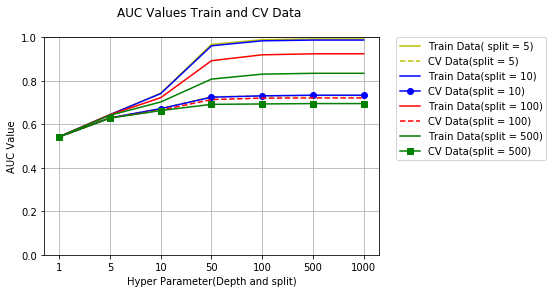

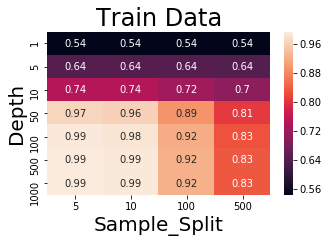

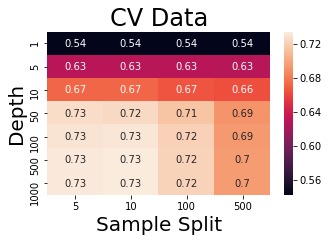

The optimal value of max_depth =  500   Optimal min_samples_split is :  10
threshold train data  0.44294024065275694
threshold test data  0.44294024065275694
The AUC value for train data is  0.9850652303325719
The AUC value for test data is  0.7871436450224328


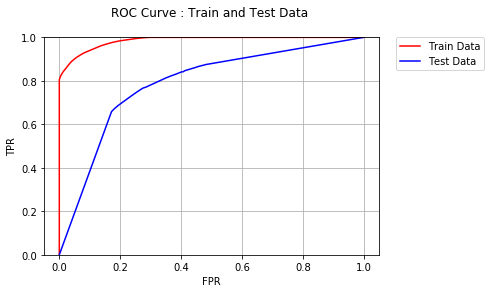

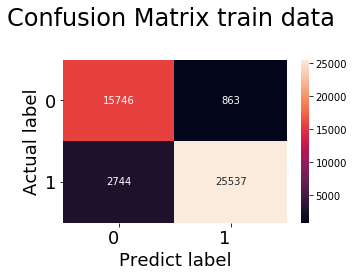

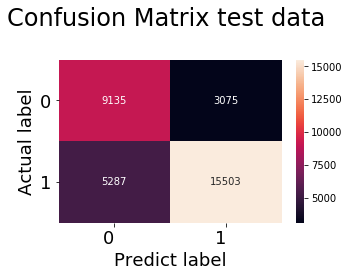

In [ ]:
train_pred1, test_pred1  = run_decision_tree_algo(x_train_data,x_cv_data,x_test_data,y_train,y_cv,y_test)

#### Observation:
    We have merged all the categorical, numerical features + project_title(encoded using BOW)+project_essay(encoded 
    using BOW).
    1. Optimal value of max_depth = 500 and min_samples_split is : 5
    2. TN = 9135,FP = 3075,TP = 15503 and FN = 5287.
    3. The AUC value for test data is  0.78.
    

In [ ]:
a_pred = []
for i in test_pred1:
    if i > .50:
        a_pred.append(1)
    else:
        a_pred.append(0)
data_fp = X_test
data_fp['quantity'] = a_pred
data_fp = data_fp.loc[data_fp['project_is_approved'] == 0]
data_fp = data_fp.loc[data_fp['project_is_approved'] != data_fp['quantity']]
data_fp.shape 

(3075, 22)

#### wordcloud  for project_title

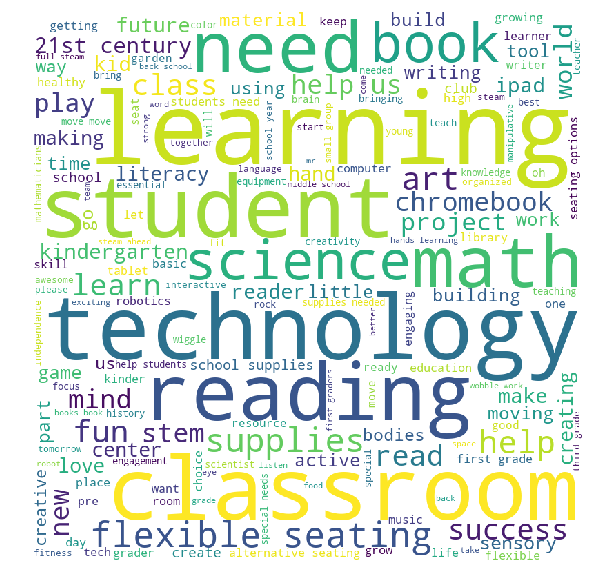

In [ ]:
wordcloud(data_fp['project_title'])

#### wordcloud  for project_essay

100%|██████████| 3247/3247 [00:02<00:00, 1190.41it/s]


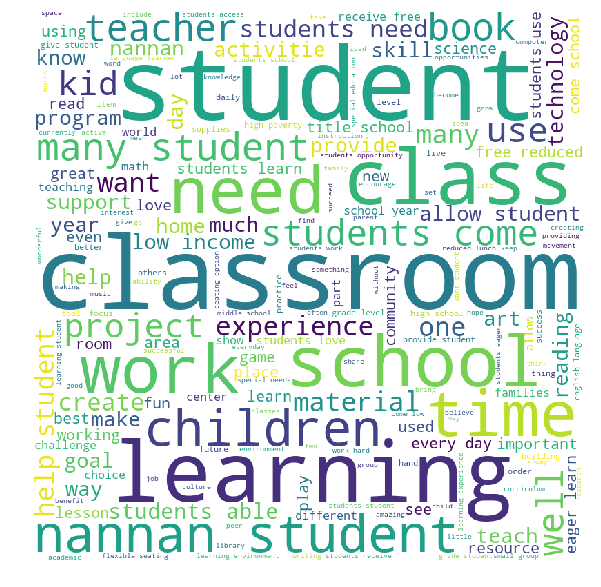

In [ ]:
project_essay = process_essay(data_fp)
wordcloud(project_essay)

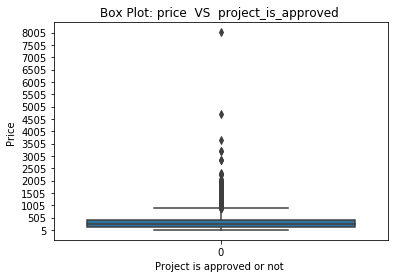

In [ ]:
a_min = data_fp['price'].min()
a_max = data_fp['price'].max()
sns.boxplot(x='project_is_approved',y='price', data=data_fp)
plt.ylabel("Price ")
plt.xlabel("Project is approved or not ")
plt.title("Box Plot: price  VS  project_is_approved ")
#plt.yticks(x2, dt_depth)
plt.yticks(np.arange(a_min, a_max, step=500))
plt.show()

### Observation:
          upper extreme   : price > 4000
          third quartile  : price > 450 
          second quartile : price > 250
          first quartile  : price < 150 
          lower extreme   : price <3

[8.25069295e-01 7.88420080e-02 2.89497998e-02 1.78626424e-02
 1.04712042e-02 8.62334463e-03 7.39143825e-03 4.00369572e-03
 4.00369572e-03 1.53988297e-03 3.38774253e-03 2.46381275e-03
 2.46381275e-03 3.07976594e-04 1.53988297e-03 3.07976594e-04
 6.15953188e-04 9.23929781e-04 6.15953188e-04 6.15953188e-04]
[  0.   10.3  20.6  30.9  41.2  51.5  61.8  72.1  82.4  92.7 103.  113.3
 123.6 133.9 144.2 154.5 164.8 175.1 185.4 195.7 206. ]


Text(0.5, 1.0, 'PDF of teacher_number_of_previously_posted_projects ')

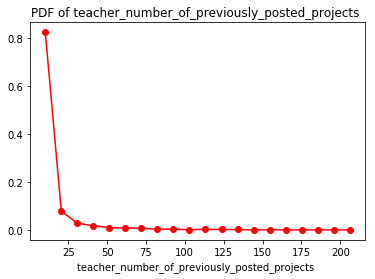

In [ ]:
counts, bin_edges = np.histogram(data_fp['teacher_number_of_previously_posted_projects'], bins=20, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,"ro-",label='')
plt.xlabel("teacher_number_of_previously_posted_projects ")
plt.title("PDF of teacher_number_of_previously_posted_projects ")

### Observation:
    if number of previously submitted project < 25 , number of false positive dataset is more.

####  categorical, numerical features + project_title(W2V_TFIDF)+project_essay(W2V_TFIDF).

In [ ]:

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train_data_wf = hstack((grade_list_train,sub_categories_train,categories_train ,school_state_train,teacher_prefix_train,
                   price_train,teacher_number_of_previously_posted_projects_train,
                   text_w2v_tfidf_train,
                   text_w2v_tidf_train_pe)).tocsr()

print("train data x, y",x_train_data_wf.shape,y_train.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_cv_data_wf = hstack((grade_list_cv,sub_categories_cv,categories_cv ,school_state_cv,teacher_prefix_cv,
                   price_cv,teacher_number_of_previously_posted_projects_cv,
                   text_w2v_tfidf_cv,
                   text_w2v_tidf_cv_pe)).tocsr()

print("CV data x, y ",x_cv_data_wf.shape,y_cv.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_test_data_wf = hstack((grade_list_test,sub_categories_test,categories_test ,school_state_test,teacher_prefix_test,
                   price_test,teacher_number_of_previously_posted_projects_test,
                   text_w2v_tfidf_test,
                   text_w2v_tidf_test_pe)).tocsr()

print("test data x , y",x_test_data_wf.shape,y_test.shape)

train data x, y (44890, 701) (44890,)
CV data x, y  (22110, 701) (22110,)
test data x , y (33000, 701) (33000,)


Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed: 50.6min finished


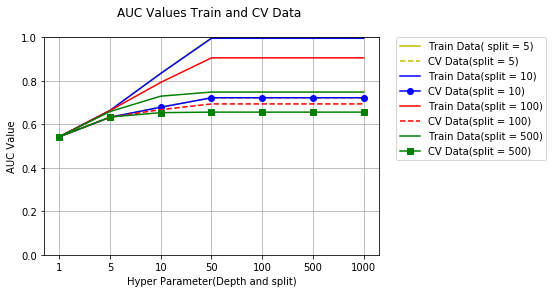

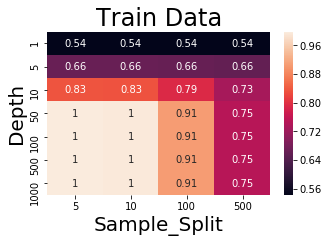

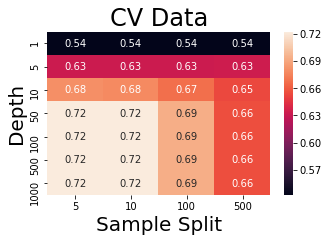

The optimal value of max_depth =  50   Optimal min_samples_split is :  10
threshold train data  0.44294024065275694
threshold test data  0.44294024065275694
The AUC value for train data is  0.9946186138823399
The AUC value for test data is  0.7805699934487813


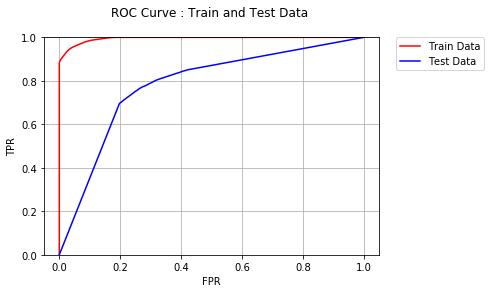

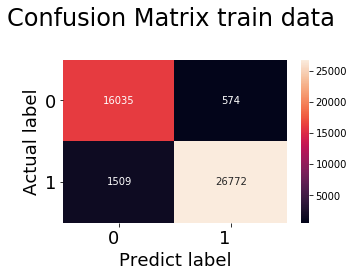

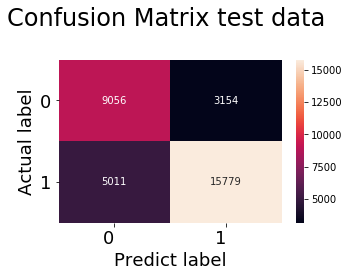

In [ ]:
train_pred_wf, test_pred_wf  = run_decision_tree_algo(x_train_data_wf,x_cv_data_wf,x_test_data_wf,y_train,y_cv,y_test)

#### Observation:
    We have merged all the categorical, numerical features + project_title(encoded using
    W2V_TFIDF)+project_essay(encoded using W2V_TFIDF) .
    1. Optimal value of max_depth = 50 and min_samples_split is : 5
    2. TN = 9056,FP = 3154,TP = 15779 and FN = 5011.
    3. The AUC value for test data is  0.78.

In [ ]:
a_pred = []
for i in test_pred_wf:
    if i > .50:
        a_pred.append(1)
    else:
        a_pred.append(0)
data_fp = X_test
data_fp['quantity'] = a_pred
data_fp = data_fp.loc[data_fp['project_is_approved'] == 0]
data_fp = data_fp.loc[data_fp['project_is_approved'] != data_fp['quantity']]
data_fp.shape 

(3154, 22)

#### wordcloud  for project_title

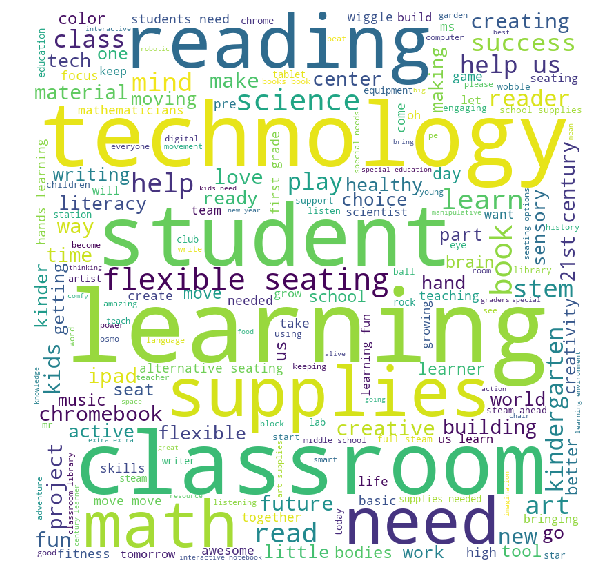

In [ ]:
wordcloud(data_fp['project_title'])

#### wordcloud  for project essay

100%|██████████| 3408/3408 [00:03<00:00, 1076.74it/s]


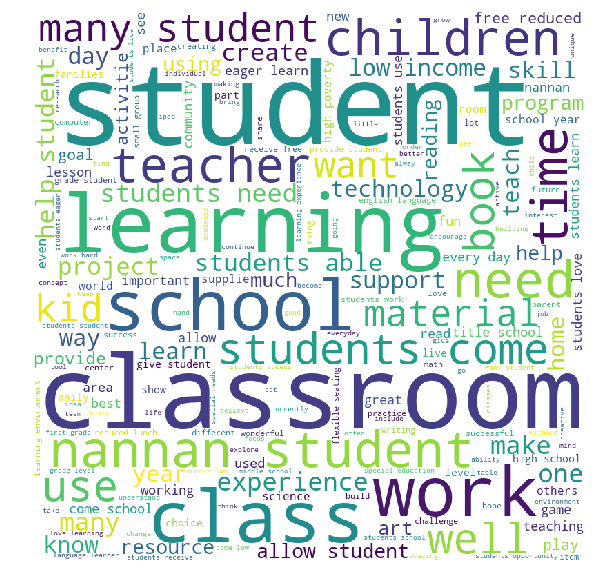

In [ ]:
project_essay = process_essay(data_fp)
wordcloud(project_essay)

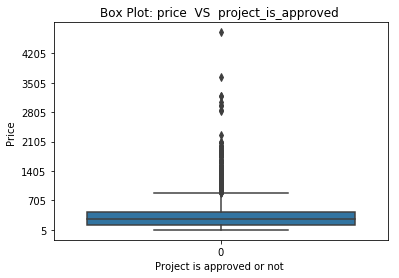

In [ ]:
a_min = data_fp['price'].min()
a_max = data_fp['price'].max()
sns.boxplot(x='project_is_approved',y='price', data=data_fp)
plt.ylabel("Price ")
plt.xlabel("Project is approved or not ")
plt.title("Box Plot: price  VS  project_is_approved ")
#plt.yticks(x2, dt_depth)
plt.yticks(np.arange(a_min,a_max, step=700))
plt.show()

### Observation:
          upper extreme   : price > 9000
          third quartile  : price > 450 
          second quartile : price > 250
          first quartile  : price < 150 
          lower extreme   : price <3

[8.09272300e-01 9.24295775e-02 3.72652582e-02 2.17136150e-02
 1.05633803e-02 7.62910798e-03 4.98826291e-03 3.22769953e-03
 2.93427230e-03 1.46713615e-03 2.64084507e-03 2.05399061e-03
 5.86854460e-04 8.80281690e-04 2.93427230e-04 2.93427230e-04
 0.00000000e+00 5.86854460e-04 5.86854460e-04 5.86854460e-04]
[  0.   10.3  20.6  30.9  41.2  51.5  61.8  72.1  82.4  92.7 103.  113.3
 123.6 133.9 144.2 154.5 164.8 175.1 185.4 195.7 206. ]


Text(0.5, 1.0, 'PDF of teacher_number_of_previously_posted_projects ')

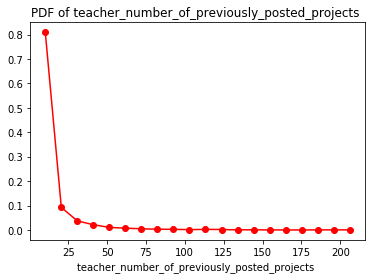

In [ ]:
counts, bin_edges = np.histogram(data_fp['teacher_number_of_previously_posted_projects'], bins=20, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,"ro-",label='')
plt.xlabel("teacher_number_of_previously_posted_projects ")
plt.title("PDF of teacher_number_of_previously_posted_projects ")

### Observation:
    if number of previously submitted project < 25 , number of false positive dataset is more.

####  categorical, numerical features + project_title(W2V_AVG)+project_essay(W2V_AVG).

In [ ]:

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train_data_wa = hstack((grade_list_train,sub_categories_train,categories_train ,school_state_train,teacher_prefix_train,
                   price_train,teacher_number_of_previously_posted_projects_train,
                   text_w2v_avg_train,
                   text_w2v_avg_train_pe)).tocsr()

print("train data x, y",x_train_data_wa.shape,y_train.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_cv_data_wa = hstack((grade_list_cv,sub_categories_cv,categories_cv ,school_state_cv,teacher_prefix_cv,
                   price_cv,teacher_number_of_previously_posted_projects_cv,
                   text_w2v_avg_cv,
                   text_w2v_avg_cv_pe)).tocsr()

print("CV data x, y ",x_cv_data_wa.shape,y_cv.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_test_data_wa = hstack((grade_list_test,sub_categories_test,categories_test ,school_state_test,teacher_prefix_test,
                   price_test,teacher_number_of_previously_posted_projects_test,
                   text_w2v_avg_test,
                   text_w2v_avg_test_pe)).tocsr()

print("test data x , y",x_test_data_wa.shape,y_test.shape)

train data x, y (44890, 701) (44890,)
CV data x, y  (22110, 701) (22110,)
test data x , y (33000, 701) (33000,)


Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed: 14.9min finished


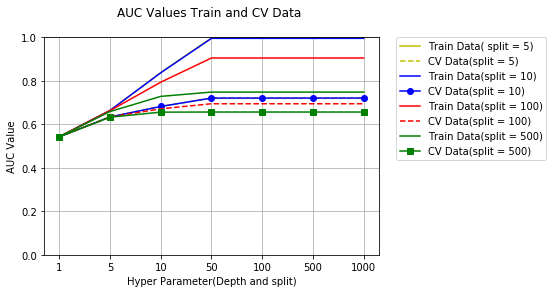

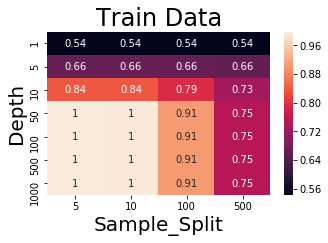

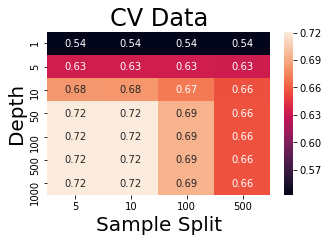

The optimal value of max_depth =  100   Optimal min_samples_split is :  5
threshold train data  0.48271850776943415
threshold test data  0.48271850776943415
The AUC value for train data is  0.9954215107130542
The AUC value for test data is  0.7807825416916327


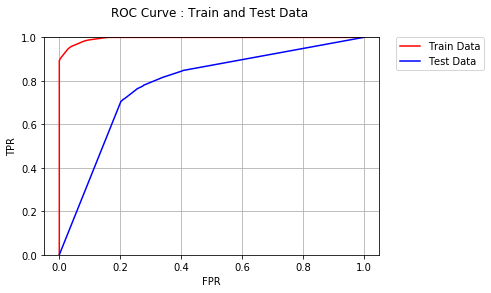

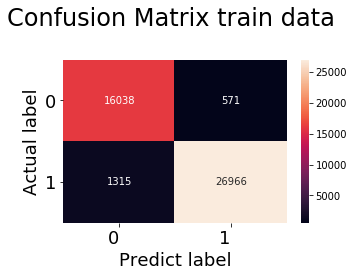

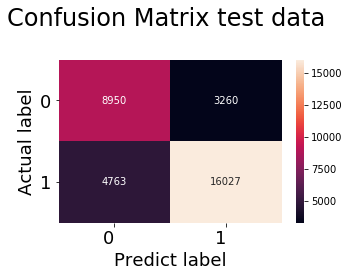

In [ ]:
 train_pred_wa, test_pred_wa  = run_decision_tree_algo(x_train_data_wa,x_cv_data_wa,x_test_data_wa,y_train,y_cv,y_test)

#### Observation:
    We have merged all the categorical, numerical features + project_title(encoded using
    W2V_AVG)+project_essay(encoded using W2V_AVG) .
    1. Optimal value of max_depth = 50 and min_samples_split is : 10
    2. TN = 8950,FP = 3260,TP = 16027 and FN = 4763 .
    3. The AUC value for test data is  0.78.

In [ ]:
a_pred = []
for i in test_pred_wa:
    if i > .50:
        a_pred.append(1)
    else:
        a_pred.append(0)
data_fp = X_test
data_fp['quantity'] = a_pred
data_fp = data_fp.loc[data_fp['project_is_approved'] == 0]
data_fp = data_fp.loc[data_fp['project_is_approved'] != data_fp['quantity']]
data_fp.shape 

(3260, 22)

#### wordcloud  for project_title

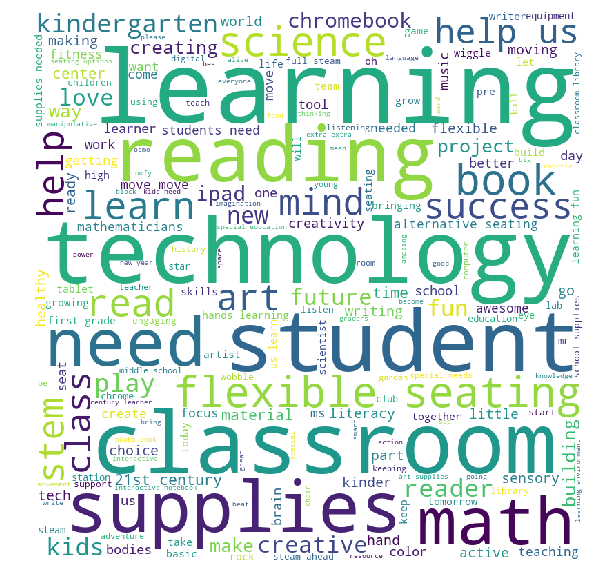

In [ ]:
wordcloud(data_fp['project_title'])

#### wordcloud  for project_essay

100%|██████████| 3408/3408 [00:02<00:00, 1187.01it/s]


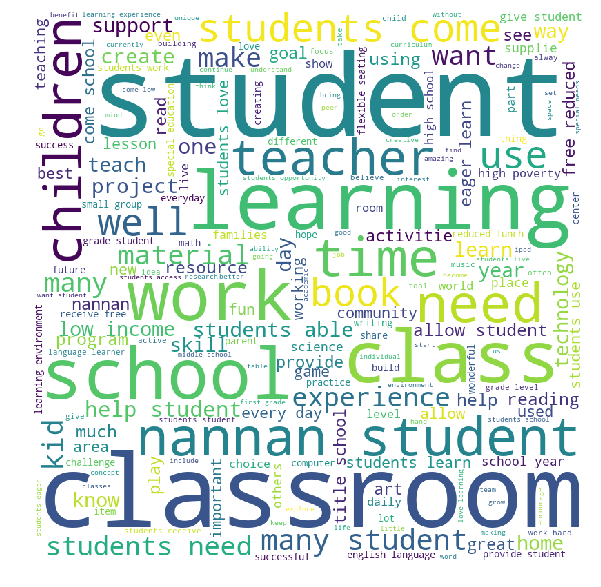

In [ ]:
project_essay = process_essay(data_fp)
wordcloud(project_essay)

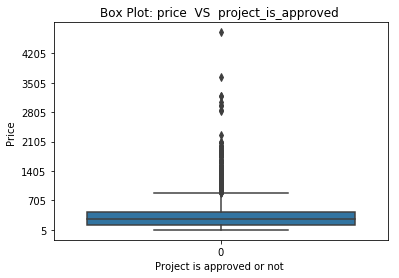

In [ ]:
a_min = data_fp['price'].min()
a_max = data_fp['price'].max()
sns.boxplot(x='project_is_approved',y='price', data=data_fp)
plt.ylabel("Price ")
plt.xlabel("Project is approved or not ")
plt.title("Box Plot: price  VS  project_is_approved ")
#plt.yticks(x2, dt_depth)
plt.yticks(np.arange(a_min,a_max, step=700))
plt.show()

### Observation:
          upper extreme   : price > 9000
          third quartile  : price > 450 
          second quartile : price > 250
          first quartile  : price < 150 
          lower extreme   : price <3           

[8.09272300e-01 9.24295775e-02 3.72652582e-02 2.17136150e-02
 1.05633803e-02 7.62910798e-03 4.98826291e-03 3.22769953e-03
 2.93427230e-03 1.46713615e-03 2.64084507e-03 2.05399061e-03
 5.86854460e-04 8.80281690e-04 2.93427230e-04 2.93427230e-04
 0.00000000e+00 5.86854460e-04 5.86854460e-04 5.86854460e-04]
[  0.   10.3  20.6  30.9  41.2  51.5  61.8  72.1  82.4  92.7 103.  113.3
 123.6 133.9 144.2 154.5 164.8 175.1 185.4 195.7 206. ]


Text(0.5, 1.0, 'PDF of teacher_number_of_previously_posted_projects ')

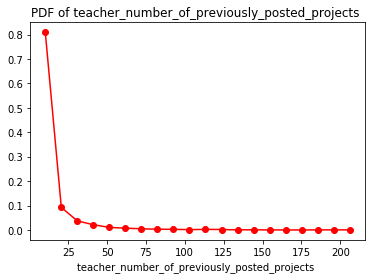

In [ ]:
counts, bin_edges = np.histogram(data_fp['teacher_number_of_previously_posted_projects'], bins=20, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,"ro-",label='')
plt.xlabel("teacher_number_of_previously_posted_projects ")
plt.title("PDF of teacher_number_of_previously_posted_projects ")

### Observation:
    if number of previously submitted project < 25 , number of false positive dataset is more.

#### categorical, numerical features + project_title(TFIDF)+project_essay(TFIDF).

In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train_data_t = hstack((grade_list_train,sub_categories_train,categories_train ,school_state_train,teacher_prefix_train,
                   price_train,teacher_number_of_previously_posted_projects_train,
                   text_tfidf_train,
                   text_tfidf_project_essay_train)).tocsr()

print("train data x, y",x_train_data_t.shape,y_train.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_cv_data_t = hstack((grade_list_cv,sub_categories_cv,categories_cv ,school_state_cv,teacher_prefix_cv,
                   price_cv,teacher_number_of_previously_posted_projects_cv,
                   text_tfidf_cv,
                   text_tfidf_project_essay_cv)).tocsr()

print("CV data x, y ",x_cv_data_t.shape,y_cv.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_test_data_t = hstack((grade_list_test,sub_categories_test,categories_test ,school_state_test,teacher_prefix_test,
                   price_test,teacher_number_of_previously_posted_projects_test,
                   text_tfidf_test,
                   text_tfidf_project_essay_test)).tocsr()


print("test data x , y",x_test_data_t.shape,y_test.shape)

train data x, y (44890, 13762) (44890,)
CV data x, y  (22110, 13762) (22110,)
test data x , y (33000, 13762) (33000,)


Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed:  6.6min finished


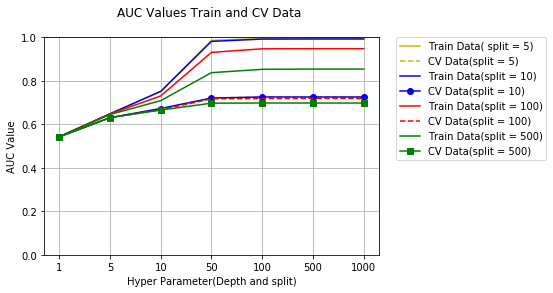

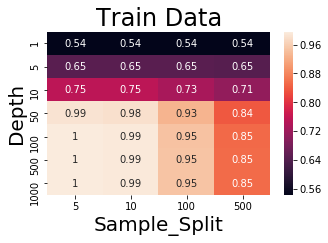

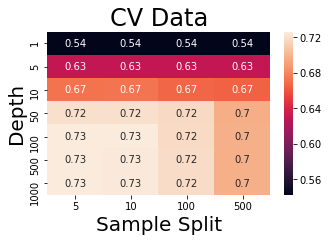

The optimal value of max_depth =  500   Optimal min_samples_split is :  5
threshold train data  0.48271850776943415
threshold test data  0.48271850776943415
The AUC value for train data is  0.9915441052859485
The AUC value for test data is  0.7844683881047518


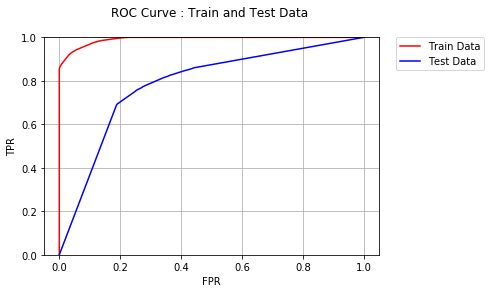

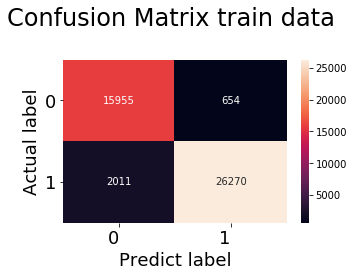

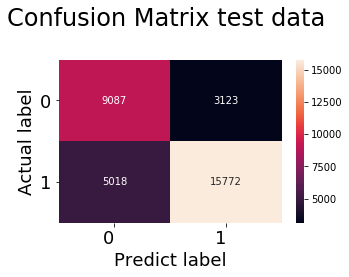

In [ ]:
train_pred_t, test_pred_t  =  run_decision_tree_algo(x_train_data_t,x_cv_data_t,x_test_data_t,y_train,y_cv,y_test)

#### Observation:
    We have merged all the categorical, numerical features + project_title(encoded using
    TFIDF)+project_essay(encoded using TFDIF).
    1. Optimal value of max_depth = 500 and min_samples_split is : 5
    2. TN = 9087,FP = 3123,TP = 15772 and FN = 5018 .
    3. The AUC value for test data is  0.78.

In [ ]:
a_pred = []
for i in test_pred_t:
    if i > .5:
        a_pred.append(1)
    else:
        a_pred.append(0)
  

In [ ]:
data_fp = X_test
data_fp['quantity'] = a_pred
data_fp = data_fp.loc[data_fp['project_is_approved'] == 0]
data_fp = data_fp.loc[data_fp['project_is_approved'] != data_fp['quantity']]
data_fp.shape

(3123, 22)

#### wordcloud  for project_title

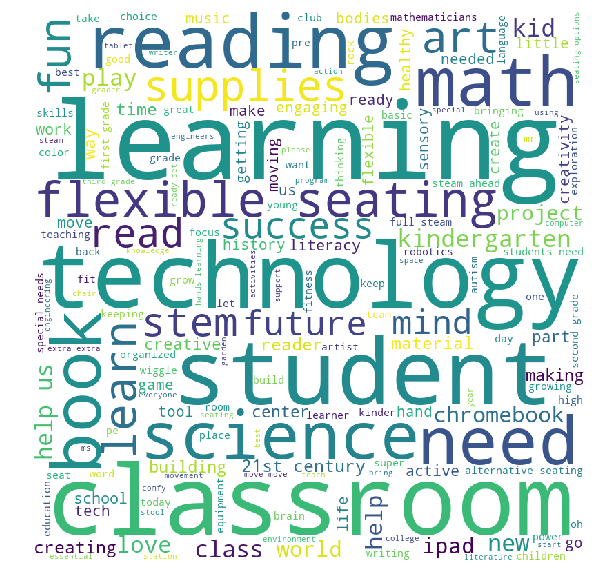

In [ ]:
wordcloud(data_fp['project_title'])

In [ ]:
project_essay = process_essay(data_fp)

100%|██████████| 3504/3504 [00:02<00:00, 1294.89it/s]


#### wordcloud  for project_essay

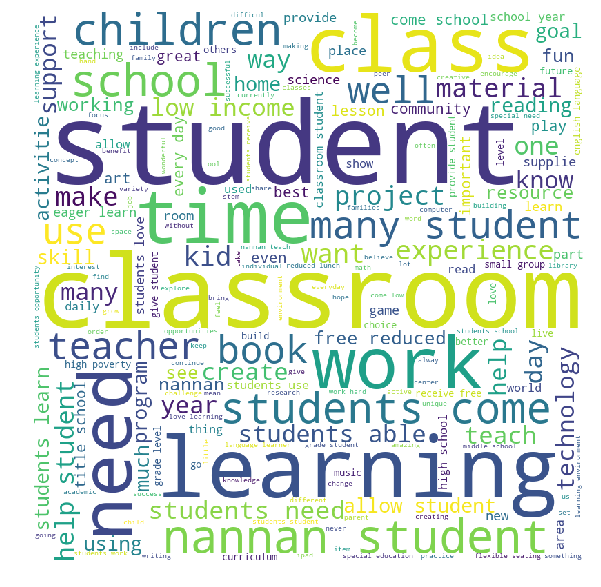

In [ ]:
wordcloud(project_essay)

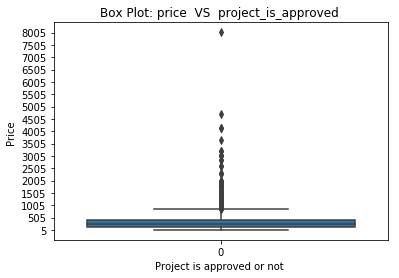

In [ ]:
a_min = data_fp['price'].min()
a_max = data_fp['price'].max()
sns.boxplot(x='project_is_approved',y='price', data=data_fp)
plt.ylabel("Price ")
plt.xlabel("Project is approved or not ")
plt.title("Box Plot: price  VS  project_is_approved ")
#plt.yticks(x2, dt_depth)
plt.yticks(np.arange(a_min, a_max, step=500))
plt.show()

### Observation:
          upper extreme   : price > 4000
          third quartile  : price > 450 
          second quartile : price > 250
          first quartile  : price < 150 
          lower extreme   : price <3
 

[8.15353881e-01 8.27625571e-02 3.62442922e-02 1.94063927e-02
 1.05593607e-02 7.13470320e-03 6.56392694e-03 2.85388128e-03
 4.28082192e-03 1.42694064e-03 3.42465753e-03 1.99771689e-03
 1.71232877e-03 8.56164384e-04 8.56164384e-04 2.85388128e-04
 1.71232877e-03 1.71232877e-03 2.85388128e-04 5.70776256e-04]
[  0.   10.3  20.6  30.9  41.2  51.5  61.8  72.1  82.4  92.7 103.  113.3
 123.6 133.9 144.2 154.5 164.8 175.1 185.4 195.7 206. ]


Text(0.5, 1.0, 'PDF of teacher_number_of_previously_posted_projects ')

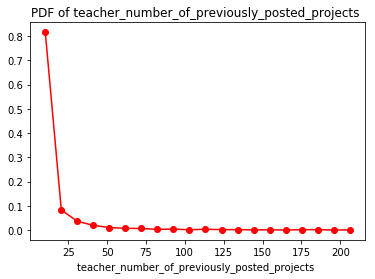

In [ ]:
counts, bin_edges = np.histogram(data_fp['teacher_number_of_previously_posted_projects'], bins=20, 
                                 density = True)
pdf = counts/(sum(counts))
print(pdf);
print(bin_edges)
plt.plot(bin_edges[1:],pdf,"ro-",label='')
plt.xlabel("teacher_number_of_previously_posted_projects ")
plt.title("PDF of teacher_number_of_previously_posted_projects ")

### Observation:
    if number of previously submitted project < 25 , number of false positive dataset is more.

### visualize  BOW  decision trees using Graphviz 

In [ ]:
from graphviz import Source
import graphviz
x_train_data_bow = hstack((
                   text_bow_train,
                   text_bow_project_essay_train)).tocsr()
dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=50, min_samples_split=100)
dt_Classifier.fit(x_train_data_bow,y_train)

bow_feature = train_project_essay_feature + train_project_title_feature

#Source(tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2))
dot_data =  tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2)

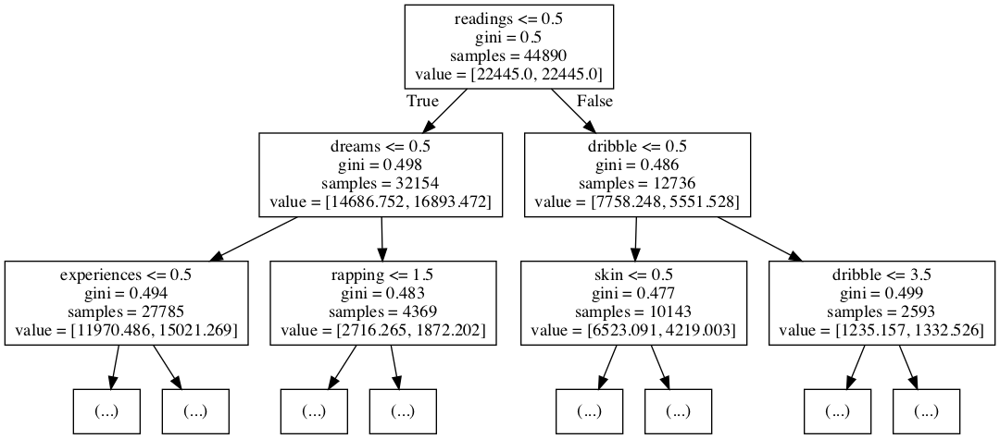

In [ ]:
#from graphviz import graph
# Draw graph
import pydotplus
from IPython.display import Image  
graph = pydotplus.graph_from_dot_data(dot_data)  

# Show graph
Image(graph.create_png())

In [ ]:
# Create PDF
graph.write_pdf("bow.pdf")

# Create PNG
graph.write_png("bow.png")

True

### visualize TFIDF decision trees using Graphviz 

In [ ]:
x_train_data_tf = hstack((text_tfidf_train,
                   text_tfidf_project_essay_train)).tocsr()

dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=5, min_samples_split=500)
dt_Classifier.fit(x_train_data_tf,y_train)

bow_feature = train_project_essay_feature_t + train_project_title_feature_t

#Source(tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2))
dot_data1 =  tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2)

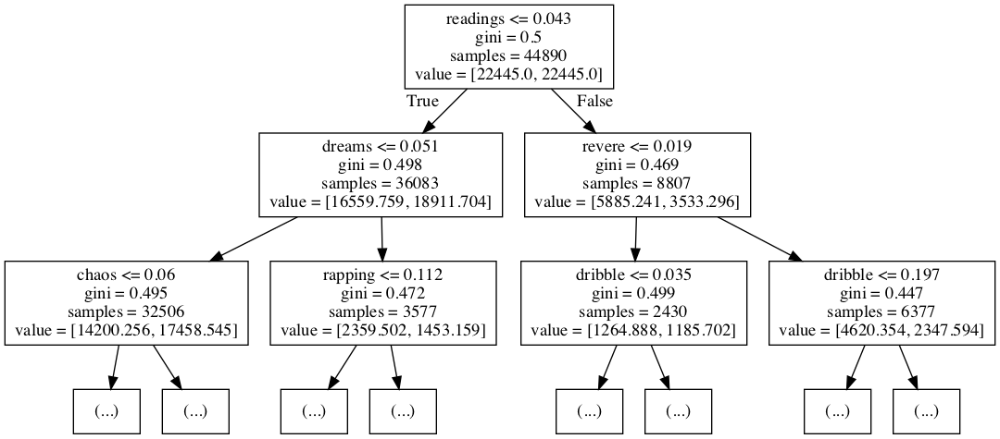

In [ ]:
#from graphviz import graph
# Draw graph
import pydotplus
from IPython.display import Image  
graph1 = pydotplus.graph_from_dot_data(dot_data1)  

# Show graph
Image(graph1.create_png())

In [ ]:
from prettytable import PrettyTable
y = PrettyTable()
y.field_names = ["","Algo","Dataset","TN","FP","TP","FN"]
y.add_row([1,"Grid","cat,num + proj_title(BOW)+proj_essay(BOW)","9135","3075","15503","5287"])
y.add_row(["--","--------------","-------------------------------------------","-----","---","--","--"])
y.add_row([2,"Grid","cat,num + proj_title(TFIDF)+proj_essay(TFIDF)","9087","2123","15772","5018"])
y.add_row(["--","--------------","-------------------------------------------","-----","---","--","--"])
y.add_row([3,"Grid","cat,num + proj_title(W2V_TFIDF)+proj_essay(W2V_TFIDF)","9056","3154","15779","5011"])
y.add_row(["--","--------------","-------------------------------------------","-----","---","--","--"])
y.add_row([4,"Grid","cat,num + proj_title(W2V_AVG)+proj_essay(W2V_AVG)","8950","3075","15503","5287"])
print(y)

+----+----------------+-------------------------------------------------------+-------+------+-------+------+
|    |      Algo      |                        Dataset                        |   TN  |  FP  |   TP  |  FN  |
+----+----------------+-------------------------------------------------------+-------+------+-------+------+
| 1  |      Grid      |       cat,num + proj_title(BOW)+proj_essay(BOW)       |  9135 | 3075 | 15503 | 5287 |
| -- | -------------- |      -------------------------------------------      | ----- | ---  |   --  |  --  |
| 2  |      Grid      |     cat,num + proj_title(TFIDF)+proj_essay(TFIDF)     |  9087 | 2123 | 15772 | 5018 |
| -- | -------------- |      -------------------------------------------      | ----- | ---  |   --  |  --  |
| 3  |      Grid      | cat,num + proj_title(W2V_TFIDF)+proj_essay(W2V_TFIDF) |  9056 | 3154 | 15779 | 5011 |
| -- | -------------- |      -------------------------------------------      | ----- | ---  |   --  |  --  |
| 4  |    

In [ ]:
y = PrettyTable()
y.field_names = ["","Algo","Dataset","opt_depth","opt_split","AUC_test"]

y.add_row([1,"Grid","cat,num + proj_title(BOW)+proj_essay(BOW)","500","5",".78"])
y.add_row(["--","--------------","-------------------------------------------","--","-----","---"])
y.add_row([2,"Grid","cat,num + proj_title(TFIDF)+proj_essay(TFIDF)","500","5",".77"])
y.add_row(["--","--------------","-------------------------------------------","--","-----","---"])
y.add_row([3,"Grid","cat,num + proj_title(W2V_TFIDF)+proj_essay(W2V_TFIDF)","50","5",".77"])
y.add_row(["--","--------------","-------------------------------------------","--","-----","---"])
y.add_row([4,"Grid","cat,num + proj_title(W2V_AVG)+proj_essay(W2V_AVG)","50","10",".77"])
y.add_row(["--","--------------","-------------------------------------------","--","-----","---"])
print(y)

+----+----------------+-------------------------------------------------------+-----------+-----------+----------+
|    |      Algo      |                        Dataset                        | opt_depth | opt_split | AUC_test |
+----+----------------+-------------------------------------------------------+-----------+-----------+----------+
| 1  |      Grid      |       cat,num + proj_title(BOW)+proj_essay(BOW)       |    500    |     5     |   .78    |
| -- | -------------- |      -------------------------------------------      |     --    |   -----   |   ---    |
| 2  |      Grid      |     cat,num + proj_title(TFIDF)+proj_essay(TFIDF)     |    500    |     5     |   .77    |
| -- | -------------- |      -------------------------------------------      |     --    |   -----   |   ---    |
| 3  |      Grid      | cat,num + proj_title(W2V_TFIDF)+proj_essay(W2V_TFIDF) |     50    |     5     |   .77    |
| -- | -------------- |      -------------------------------------------      | 

## Task2  Select 5k best features from features of Set 2 using`feature_importances_`, discard all the other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3

In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train_data_t1 = hstack((grade_list_train,sub_categories_train,categories_train ,school_state_train,teacher_prefix_train,
                   price_train_t,teacher_number_of_previously_posted_projects_train_t,
                   text_tfidf_train,
                   text_tfidf_project_essay_train)).tocsr()

#nb_data_f = StandardScaler(with_mean = False).fit_transform(nb_data_f)
print("train data x, y",x_train_data_t.shape,y_train.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_cv_data_t1 = hstack((grade_list_cv,sub_categories_cv,categories_cv ,school_state_cv,teacher_prefix_cv,
                   price_cv_t,teacher_number_of_previously_posted_projects_cv_t,
                   text_tfidf_cv,
                   text_tfidf_project_essay_cv)).tocsr()

#nb_data_f = StandardScaler(with_mean = False).fit_transform(nb_data_f)
print("CV data x, y ",x_cv_data_t.shape,y_cv.shape)

# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_test_data_t1 = hstack((grade_list_test,sub_categories_test,categories_test ,school_state_test,teacher_prefix_test,
                   price_test_t,teacher_number_of_previously_posted_projects_test_t,
                   text_tfidf_test,
                   text_tfidf_project_essay_test)).tocsr()

#nb_data_f = StandardScaler(with_mean = False).fit_transform(nb_data_f)
print("test data x , y",x_test_data_t.shape,y_test.shape)

train data x, y (44890, 13762) (44890,)
CV data x, y  (22110, 13762) (22110,)
test data x , y (33000, 13762) (33000,)


In [ ]:
dt_Classifier = tree.DecisionTreeClassifier()
dt_Classifier.fit(x_train_data_t1,y_train)


# Calculate feature importances from decision trees
dt_feature = dt_Classifier.feature_importances_
# Sort feature importances in descending order
indices = np.argsort(dt_feature)[::-1][:5000]
p_data_train = p_feature_dataframe_train.squeeze()
#p_y_train = y_train.squeeze()
p_feature1 =[]

k = []
for i in indices:    
    p_feature1.append(p_data_train[i])
    k.append(indices)


m = list()
for i in k[0]:
    m.append(y.loc[i])

x_train_1 = pd.DataFrame(data= p_feature1,columns = ['feature'])

y_train_1 = pd.DataFrame(data=m)

In [ ]:
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(x_train_1['feature'].values)
count_vect_feature = count_vect.get_feature_names()
print("train data",X_train_counts.shape)

train data (5000, 4806)


In [ ]:
dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=5, min_samples_split=500)
dt_Classifier.fit(x_cv_data_t1,y_cv)


# Calculate feature importances from decision trees
dt_feature = dt_Classifier.feature_importances_
# Sort feature importances in descending order
indices = np.argsort(dt_feature)[::-1][:5000]
p_data_cv = p_feature_dataframe_cv.squeeze()
p_y_cv = y_cv.squeeze()
p_feature1 =[]
k = []
p_y_cv = []
for i in indices:    
    p_feature1.append(p_data_cv[i])
    k.append(indices)
#    p_y_cv.append(y[indices])
x_cv_1 = pd.DataFrame(data=p_feature1,columns = ['feature'])

#count_vect = CountVectorizer()
X_cv_counts = count_vect.transform(x_cv_1['feature'].values)

print("cv data",X_cv_counts.shape)
m = list()
for i in k[0]:
    m.append(y.loc[i])

y_cv_1 = pd.DataFrame(data=m)

cv data (5000, 4806)


In [ ]:
dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=5, min_samples_split=500)
dt_Classifier.fit(x_test_data_t1,y_test)


# Calculate feature importances from decision trees
dt_feature = dt_Classifier.feature_importances_
# Sort feature importances in descending order
indices = np.argsort(dt_feature)[::-1][:5000]
p_data_test = p_feature_dataframe_cv.squeeze()
p_y_test = y_test.squeeze()
p_feature1 =[]
k = []
p_y_test = []
for i in indices:    
    p_feature1.append(p_data_test[i])
    k.append(indices)
#    p_y_test.append(y[indices])
x_test_1 = pd.DataFrame(data=p_feature1,columns = ['feature'])
#count_vect = CountVectorizer()
X_test_counts = count_vect.transform(x_test_1['feature'].values)
print("test data",X_test_counts.shape)
a = np.arange(0,5000)
for i in a:
    a[i] = 1
y_test_1 = a
m = list()
for i in k[0]:
    m.append(y.loc[i])

y_test_1 = pd.DataFrame(data=m)

test data (5000, 4806)


Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed:    3.9s finished


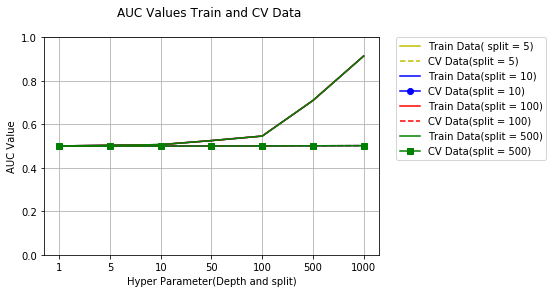

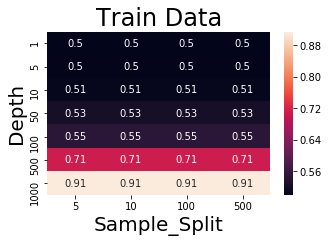

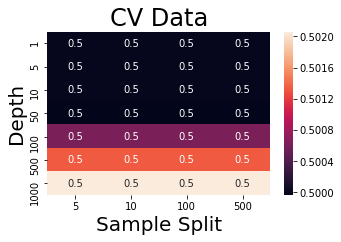

The optimal value of max_depth =  1000   Optimal min_samples_split is :  5
threshold train data  0.9179128975780562
threshold test data  0.9179128975780562
The AUC value for train data is  0.7772628304821151
The AUC value for test data is  0.7042555730928706


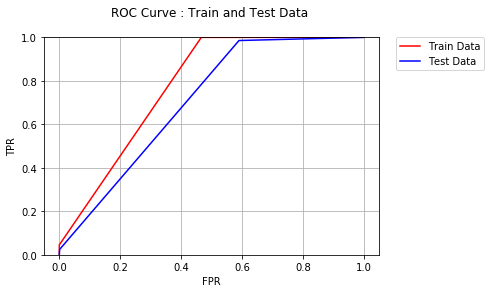

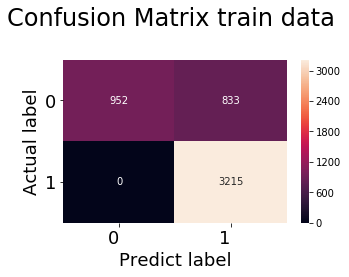

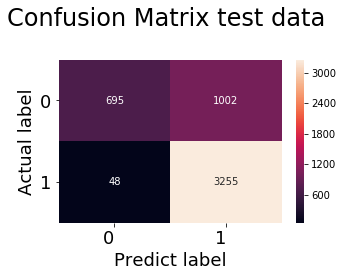

In [ ]:
train_pred_f, test_pred_f  = run_decision_tree_algo(X_train_counts,X_cv_counts,X_test_counts,y_train_1,y_cv_1,y_test_1)

#### Observation:
    We have selected 5000 feature .
    1. Optimal value of max_depth =  1000  And Optimal min_samples_split is :  5
    2. TN = 695,FP = 1002,TP = 3255 and FN = 48 .
    3. The AUC value for test data is  0.70.

### visualize features decision trees using Graphviz 

In [ ]:
from graphviz import Source
import graphviz

dt_Classifier = tree.DecisionTreeClassifier(class_weight= 'balanced',max_depth=3, min_samples_split=5)
dt_Classifier.fit(X_train_counts,y_train_1)

bow_feature = count_vect_feature

#Source(tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2))

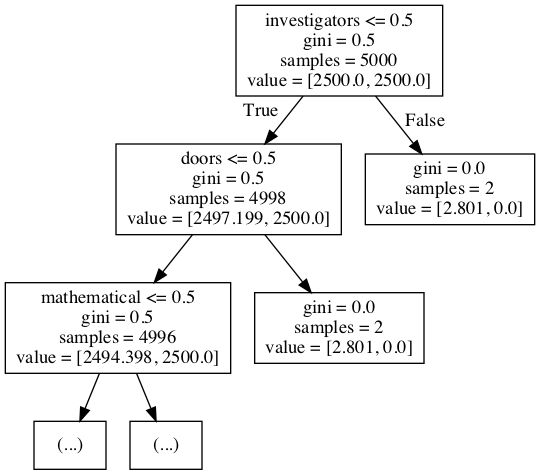

In [ ]:
dot_data2 =  tree.export_graphviz(dt_Classifier, out_file = None, feature_names = bow_feature,max_depth=2)
#from graphviz import graph
# Draw graph
import pydotplus
from IPython.display import Image  
graph2 = pydotplus.graph_from_dot_data(dot_data2)  

# Show graph
Image(graph2.create_png())

In [ ]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable

#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable

x = PrettyTable()
x.field_n1ames = ["","Algo","Dataset","opt_depth","opt_split","AUC_test"]

#for i in range(0,101,5):
x.add_row([1,"Grid","cat,num + proj_title(TFIDF)+proj_essay(TFIDF)","1000","5","0.70"])
print(x) 


+---------+---------+-----------------------------------------------+---------+---------+---------+
| Field 1 | Field 2 |                    Field 3                    | Field 4 | Field 5 | Field 6 |
+---------+---------+-----------------------------------------------+---------+---------+---------+
|    1    |   Grid  | cat,num + proj_title(TFIDF)+proj_essay(TFIDF) |   1000  |    5    |   0.70  |
+---------+---------+-----------------------------------------------+---------+---------+---------+


In [ ]:
y = PrettyTable()
y.field_names = ["","Algo","Dataset","TN","FP","TP","FN"]
y.add_row([1,"Brute+Simple loop","cat,num + proj_title(TFIDF)+proj_essay(TFIDF)","695","1002","3255","48"])
print(y)

+---+-------------------+-----------------------------------------------+-----+------+------+----+
|   |        Algo       |                    Dataset                    |  TN |  FP  |  TP  | FN |
+---+-------------------+-----------------------------------------------+-----+------+------+----+
| 1 | Brute+Simple loop | cat,num + proj_title(TFIDF)+proj_essay(TFIDF) | 695 | 1002 | 3255 | 48 |
+---+-------------------+-----------------------------------------------+-----+------+------+----+


### Conclusion:
     1. There are 109248 datapoints and 28 features in project file and 1541272 datapoints and 4 features in 
        resource file.
     2. AUC for ROC curve for test model >= 50%
     

### Reference :
    1. https://github.com/omkar1610
    2. https://www.geeksforgeeks.org/generating-word-cloud-python/